# CS116.P22 - ĐỒ ÁN

## DANH SÁCH THÀNH VIÊN

1. **Đinh Lê Bình An** - `23520004`
2. **Vũ Gia Khang** - `23520713`
3. **Bùi Nhật Anh Khôi** - `23520761`
4. **Nguyễn Khang Hy** - `23520662`

## Tên bộ dữ liệu:  [Consumer Behavior and Shopping Habits Dataset](https://www.kaggle.com/datasets/zeesolver/consumer-behavior-and-shopping-habits-dataset)


Tên bài toán: **Customer behavior analysis for product recommendations (Đề xuất sản phẩm dựa trên hành vi mua sắm của khách hàng)**

In [1]:
from google.colab import files
files.upload()  # Chọn tệp kaggle.json từ máy tính của bạn

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"khoibuivn","key":"26b3b31dd2f09ced4f225193e5f85ccb"}'}

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
import os
root_dir = "/content"
dataset_dir = os.path.join(root_dir, "datasets")

if not os.path.exists(dataset_dir):
    os.makedirs(dataset_dir)

In [4]:
import kaggle
kaggle.api.authenticate()  # Xác thực bằng API key từ tệp kaggle.json
# Đổi tên biến dataset_name theo dataset mong muốn:
dataset_name = "zeesolver/consumer-behavior-and-shopping-habits-dataset"
kaggle.api.dataset_download_files(dataset_name, path=dataset_dir, unzip=True)
print(f"Dataset đã được tải về tại: {dataset_dir}")

Dataset URL: https://www.kaggle.com/datasets/zeesolver/consumer-behavior-and-shopping-habits-dataset
Dataset đã được tải về tại: /content/datasets


In [5]:
dataset_path = '/content/datasets/shopping_behavior_updated.csv'

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [7]:
df = pd.read_csv(dataset_path)
print("Đọc file CSV thành công.")

Đọc file CSV thành công.


# Bước 1: Đăng ký đề tài


## 1.1 Lý do chọn dữ liệu

Bộ dữ liệu này rất phù hợp để phân tích hành vi mua sắm của khách hàng:
- Cung cấp một cái nhìn toàn diện về các yếu tố ảnh hưởng đến quyết định mua hàng như độ tuổi, giới tính, sở thích sản phẩm, phương thức thanh toán, hình thức giao hàng và tần suất mua sắm.
- Thông qua việc khai thác các thông tin như sản phẩm đã mua, mức chi tiêu, đánh giá của khách hàng, và lịch sử mua hàng trước đó, chúng ta có thể hiểu rõ hơn về xu hướng tiêu dùng, mức độ trung thành và khả năng quay lại của từng nhóm khách hàng.

**Những hiểu biết này sẽ hỗ trợ mạnh mẽ cho việc xây dựng hệ thống gợi ý sản phẩm cá nhân hóa, giúp các doanh nghiệp thương mại điện tử tối ưu hóa chiến lược tiếp thị, nâng cao trải nghiệm người dùng, và phát triển các chương trình giữ chân khách hàng một cách hiệu quả hơn**.



## 1.2 Các thông tin về bộ dữ liệu

- Số dòng: 3900 dòng
- Số cột: 18 cột
- Loại bài toán: Đề xuất sản phẩm dựa trên thói quen mua đồ của khách hàng

- **Customer ID**: Là khoá chính định danh từng khách hàng, hỗ trợ theo dõi hành vi theo thời gian và phân tích mức độ trung thành.

- **Age**: Dữ liệu định lượng giúp phân khúc khách hàng theo độ tuổi, từ đó cá nhân hoá nội dung tiếp thị.

- **Gender**: Biến phân loại giúp xác định sự khác biệt trong hành vi tiêu dùng giữa nam và nữ.

- **Item Purchased**: Là mục tiêu chính trong bài toán gợi ý; thể hiện rõ sản phẩm mà khách hàng quan tâm.

- **Category**: Cho phép nhóm các sản phẩm cùng loại để phân tích xu hướng theo danh mục (ví dụ: thời trang, điện tử...).

- **Purchase Amount (USD)**: Dữ liệu định lượng cho biết sức chi tiêu, giúp đánh giá khách hàng có giá trị cao (high-value customers).

- **Location**: Cho phép phân tích sự khác biệt hành vi mua sắm theo vùng miền hoặc quốc gia.

- **Size**: Áp dụng cho các sản phẩm thời trang , hỗ trợ kiểm tra mức độ phù hợp kho hàng theo kích cỡ phổ biến.

- **Color**: Phân tích thị hiếu về màu sắc để cải thiện thiết kế và quản lý tồn kho hiệu quả hơn.

- **Season**: Hữu ích trong việc dự đoán nhu cầu theo mùa và lập kế hoạch nhập hàng.

- **Review Rating**: Đo lường sự hài lòng của khách hàng, có thể dùng làm chỉ số đầu vào cho mô hình gợi ý chất lượng.

- **Subscription Status**: Phân biệt giữa khách hàng thường và khách hàng trung thành (đăng ký dịch vụ định kỳ).

- **Shipping Type**: Phân tích lựa chọn giao hàng để tối ưu thời gian & chi phí vận chuyển.

- **Discount Applied**: Xác định mức độ nhạy cảm với giá và tác động của giảm giá đến hành vi mua hàng.

- **Promo Code Used**: Cho biết hiệu quả của các chiến dịch marketing qua mã khuyến mãi.

- **Previous Purchases**: Là một chỉ số quan trọng để xác định khách hàng trung thành và mô hình dự đoán mua lại.

- **Payment Method**: Giúp doanh nghiệp xác định phương thức thanh toán phổ biến và cải thiện cổng thanh toán.

- **Frequency of Purchases**: Đánh giá tần suất mua hàng, là chỉ số then chốt trong mô hình dự đoán giá trị vòng đời khách hàng (CLV).

## 1.3 Một số nhận xét ban đầu về bộ dữ liệu

● **Thông tin dữ liệu**: Dataset bao gồm các trường quan trọng phản ánh hành vi tiêu dùng như: `thông tin khách hàng` (Customer ID, Age, Gender, Location), `thông tin sản phẩm` (Item Purchased, Category, Size, Color, Season), `chi tiêu và đánh giá` (Purchase Amount, Review Rating), cũng như `thói quen và hình thức mua sắm` (Previous Purchases, Frequency of Purchases, Subscription Status, Payment Method, Shipping Type, Promo Code Used, Discount Applied).

● **Tình trạng dữ liệu**: Bộ dữ liệu được mô tả khá đầy đủ, đa dạng và có tính ứng dụng cao. Các trường thông tin có giá trị rõ ràng, thuận lợi cho việc xử lý và phân tích dữ liệu. Chưa có dấu hiệu rõ ràng về thiếu hụt dữ liệu ở mức nghiêm trọng trong phần mô tả.

● **Định dạng dữ liệu**: Kết hợp giữa nhiều kiểu dữ liệu như số nguyên (int64), số thực (float64) và chuỗi (object), phù hợp để thực hiện các phân tích mô tả, trích xuất insight và huấn luyện các mô hình học máy.

● **Phân tích khách hàng**: Dữ liệu cho phép phân khúc người dùng theo nhân khẩu **học, hành vi chi tiêu, xu hướng sử dụng mã khuyến mãi, lựa chọn phương thức thanh toán hay hình thức vận chuyển. Đây là cơ sở vững chắc để xây dựng hệ thống cá nhân hóa và đề xuất thông minh.

# Bước 2: Phân tích dữ liệu - EDA

### Kiểm tra dữ liệu ban đầu

In [8]:
print("5 dòng đầu tiên của dữ liệu:")
display(df.head())

5 dòng đầu tiên của dữ liệu:


,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually


In [9]:
print("\nThông tin tổng quan về DataFrame:")
df.info()


Thông tin tổng quan về DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Customer ID             3900 non-null   int64  
 1   Age                     3900 non-null   int64  
 2   Gender                  3900 non-null   object 
 3   Item Purchased          3900 non-null   object 
 4   Category                3900 non-null   object 
 5   Purchase Amount (USD)   3900 non-null   int64  
 6   Location                3900 non-null   object 
 7   Size                    3900 non-null   object 
 8   Color                   3900 non-null   object 
 9   Season                  3900 non-null   object 
 10  Review Rating           3900 non-null   float64
 11  Subscription Status     3900 non-null   object 
 12  Shipping Type           3900 non-null   object 
 13  Discount Applied        3900 non-null   object 
 14  Promo

In [10]:
print(f"\nKích thước DataFrame: {df.shape}")
print("\nThống kê mô tả cho các cột số:")
display(df.describe())


Kích thước DataFrame: (3900, 18)

Thống kê mô tả cho các cột số:


,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases
count,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000
mean,1950.500000,44.068462,59.764359,3.749949,25.351538
std,1125.977353,15.207589,23.685392,0.716223,14.447125
min,1.000000,18.000000,20.000000,2.500000,1.000000
25%,975.750000,31.000000,39.000000,3.100000,13.000000
50%,1950.500000,44.000000,60.000000,3.700000,25.000000
75%,2925.250000,57.000000,81.000000,4.400000,38.000000
max,3900.000000,70.000000,100.000000,5.000000,50.000000


In [11]:
print("\nThống kê mô tả các cột:")
display(df.describe())


Thống kê mô tả các cột:


,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases
count,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000
mean,1950.500000,44.068462,59.764359,3.749949,25.351538
std,1125.977353,15.207589,23.685392,0.716223,14.447125
min,1.000000,18.000000,20.000000,2.500000,1.000000
25%,975.750000,31.000000,39.000000,3.100000,13.000000
50%,1950.500000,44.000000,60.000000,3.700000,25.000000
75%,2925.250000,57.000000,81.000000,4.400000,38.000000
max,3900.000000,70.000000,100.000000,5.000000,50.000000


In [12]:
print("\nThống kê mô tả cho các cột phân loại:")
display(df.describe(include='object'))


Thống kê mô tả cho các cột phân loại:


,Gender,Item Purchased,Category,Location,Size,Color,Season,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Payment Method,Frequency of Purchases
count,3900,3900,3900,3900,3900,3900,3900,3900,3900,3900,3900,3900,3900
unique,2,25,4,50,4,25,4,2,6,2,2,6,7
top,Male,Blouse,Clothing,Montana,M,Olive,Spring,No,Free Shipping,No,No,PayPal,Every 3 Months
freq,2652,171,1737,96,1755,177,999,2847,675,2223,2223,677,584


#### Kiểm tra giá trị thiếu (NULL)

In [13]:
print("Kiểm tra số lượng giá trị thiếu (NULL) cho mỗi cột:")
missing_values = df.isnull().sum()
missing_info = pd.DataFrame({
    'Số lượng thiếu': missing_values,
})
display(missing_info)

Kiểm tra số lượng giá trị thiếu (NULL) cho mỗi cột:


,Số lượng thiếu
Customer ID,0
Age,0
Gender,0
Item Purchased,0
Category,0
Purchase Amount (USD),0
Location,0
Size,0
Color,0
Season,0


#### Kiểm tra dữ liệu trùng lặp

In [14]:
# check duplicate value

print(df.duplicated().sum())


0


## Nhận xét ban đầu:
- **Kích thước:** Tập dữ liệu gồm 3900 hàng và 19 cột.

- **Kiểu dữ liệu:** Các cột có vẻ có kiểu dữ liệu phù hợp (số nguyên, số thực, object/chuỗi). Cột `Customer ID` là định danh.

- **Giá trị thiếu:** Kiểm tra bằng `df.isnull().sum()` xác nhận **không có giá trị thiếu (NULL)** nào trong toàn bộ dữ liệu. Điều này rất tốt cho việc phân tích.

- **Gia trị trùng lặp**: Kiểm tra bằng `df.duplicated().sum()` xác nhận **không có giá trị trùng lặp** nào trong toàn bộ dữ liệu. Điều này rất tốt cho việc phân tích.


- **Nhóm thông tin về dữ liệu**
  + Thông tin khách hàng: `Customer ID`, `Gender`, `Age`, `Location`, `Subscripttion status`
  + Thông tin sản phẩm và giao dịch: `Item Purchased`, `Category`, `Size`, `Color`, `Season`, `Purchase Amount (USD)`, `Discount Applied`, `Promo Code Used`
  + Thông tin về hành vi mua sắm: `Frequency of Purchases`, `Previous Purchases`, `Review Rating`, `Shipping type`, `Payment Method`


- **Thống kê số:**
  - `Age`: Tuổi từ 18 đến 70, trung bình khoảng 44. Tuổi phân bố khá rộng.
  - `Purchase Amount (USD)`: Số tiền mua hàng từ 20 đến 100 USD, trung bình khoảng 60 USD. Phân bố đều.
  - `Review Rating`: Đánh giá từ 2.5 đến 5.0, trung bình 3.7. Đa số đánh giá ở mức khá cao.
  - `Previous Purchases`: Số lượt mua trước đó từ 1 đến 50, trung bình 25. Phân bố đều.

- **Thống kê phân loại:**
  - Có nhiều cột phân loại cần khám phá chi tiết hơn (ví dụ: `Gender`, `Item Purchased`, `Category`, `Location`, `Payment Method`).
  - `Gender`: Có 2 giá trị duy nhất, `Male` là phổ biến nhất cho thấy nam giới có xu hướng mua sắm nhiều hơn nữ giới.
  - `Item Purchased`: Có 25 mặt hàng khác nhau, `Blouse` phổ biến nhất
  - `Category`: Có 4 danh mục, `Clothing` phổ biến nhất.
  - `Location`: Có 50 địa điểm khác nhau, `Montana` phổ biến nhất.
  - `Size`: có 4 loại, `M` là phổ biến nhất.
  - `Color`: Có 7 màu sắc khác nhau, `Olive` là phổ biến nhất.
  - `Season`: Có 4 mùa, `Spring` phổ biến nhất vì đây là mùa xuân mát mẻ và dễ chịu cho việc mua sắm dẫn đến người dân chi tiêu nhiều hơn cho các sản phẩm về quần áo vì dụ như áo blouse, đặc biệt là thành phố `Montana` nơi có khí hậu lạnh hơn.
  - `Payment Method`: Có 6 phương thức, `Credit Card` là phương thức thường được dùng để thanh toán vì độ tiện lợi và nhanh chóng nhưng phương thích ưu thích của khách hàng lại là `PayPal` vì tính bảo mật và an toàn hơn, đặc biệt là khi mua sắm trực tuyến.
  - `Shipping type`: có 6 loại, `Free Shipping` là lựa chọn ưu tiên của khách hàng với mong muốn tiết kiệm chi tiết cho phí vận chuyển và tập trung số tiền vào sản phẩm
  - `Frequency of Purchases`: Có 7 tần suất mua hàng, `Every 3 Months` là tần suất mua hàng phố biến nhất vì đây là thời điểm mà người tiêu dùng thường có nhu cầu mua sắm nhiều hơn, đặc biệt là vào mùa xuân và mùa hè.


## Phân tích đơn biến (Univariate Analysis)

#### 5.1. Phân tích biến số (Numerical Variables)

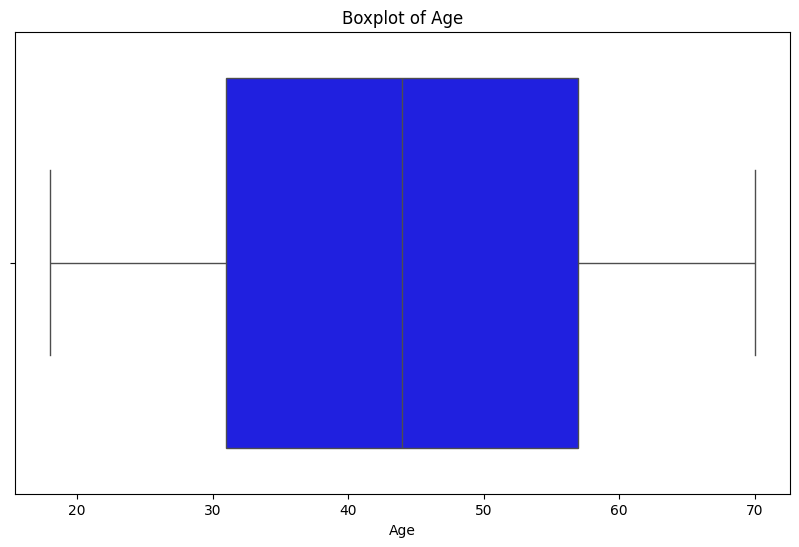

In [15]:
# Phân bố tuổi
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Age', color='blue')
plt.title('Boxplot of Age')
plt.xlabel('Age')
plt.show()


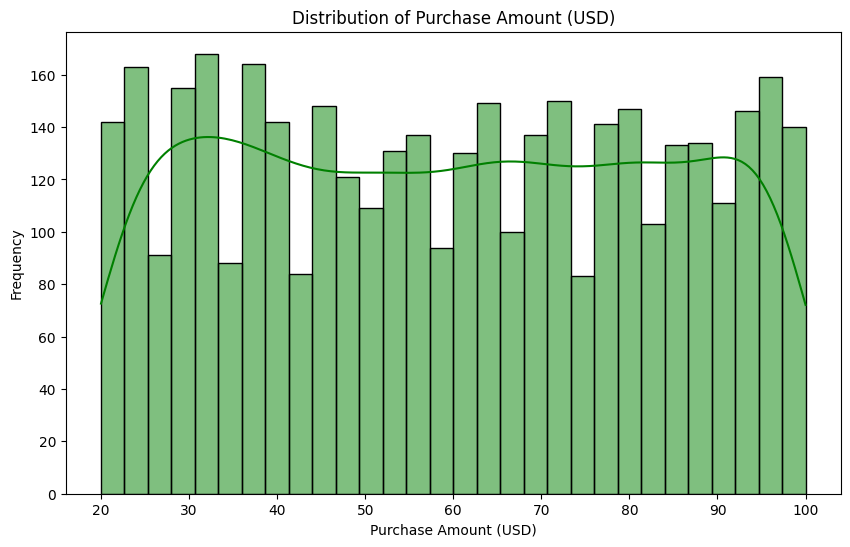

In [16]:
# Phân bố Purchase Amount (USD)
plt.figure(figsize=(10, 6))
sns.histplot(df, x='Purchase Amount (USD)', bins=30, kde=True, color='green')
plt.title('Distribution of Purchase Amount (USD)')
plt.xlabel('Purchase Amount (USD)')
plt.ylabel('Frequency')
plt.show()


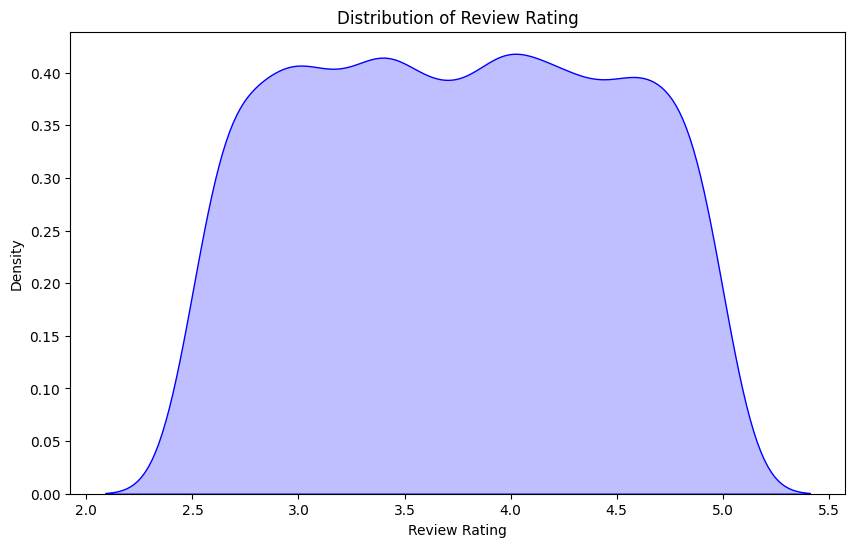

In [17]:
# Phân bố review rating
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x='Review Rating', fill=True, color='blue')
plt.title("Distribution of Review Rating")
plt.xlabel("Review Rating")
plt.ylabel("Density")
plt.show()


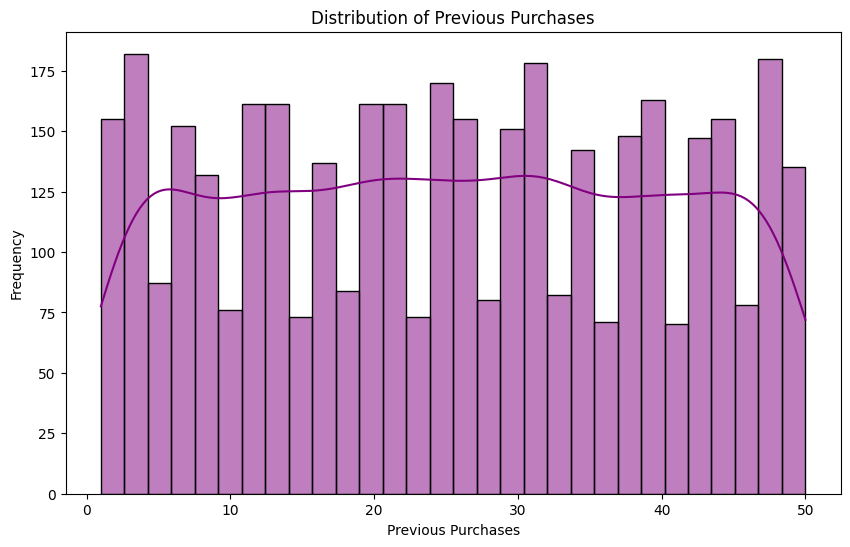

In [18]:
# Phân bố Previous Purchase
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Previous Purchases', bins=30, kde=True, color='purple')
plt.title("Distribution of Previous Purchases")
plt.xlabel("Previous Purchases")
plt.ylabel("Frequency")
plt.show()


#### 5.2. Phân tích biến phân loại (Categorical Variables)

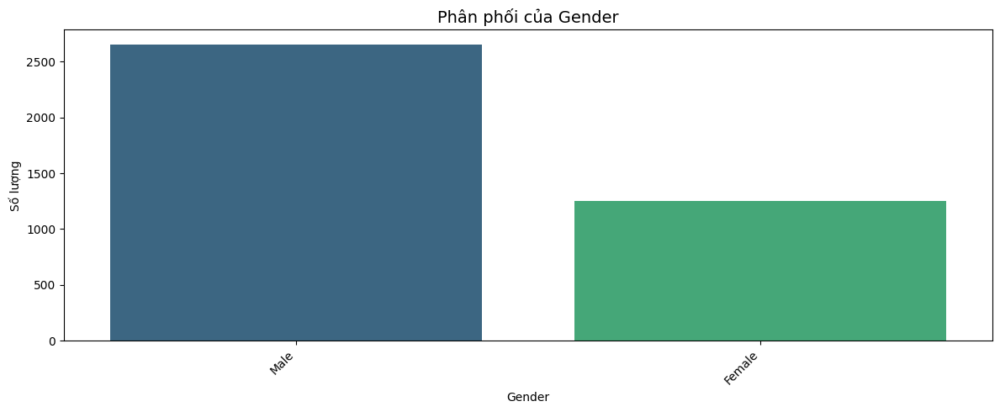

Tần suất của 'Gender':
Gender
Male      2652
Female    1248
Name: count, dtype: int64
------------------------------------------------------------
* Hiển thị Top 15 loại phổ biến nhất (Tổng số loại: 25)


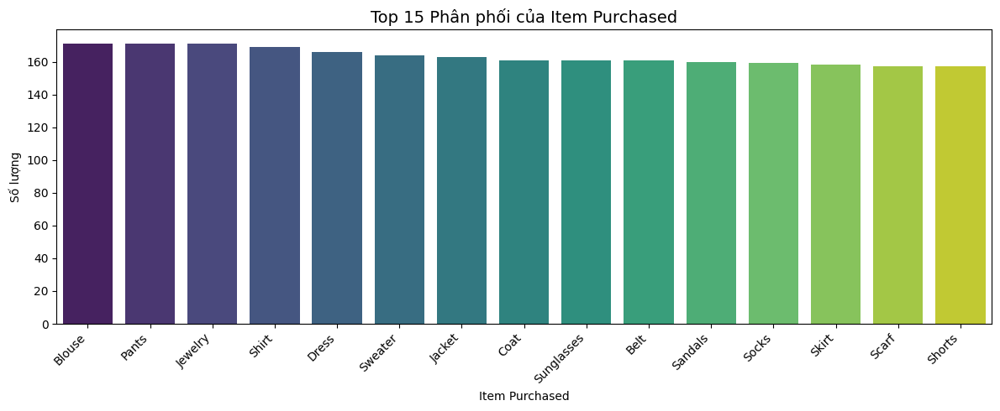

Tần suất của 'Item Purchased':
Item Purchased
Blouse        171
Pants         171
Jewelry       171
Shirt         169
Dress         166
Sweater       164
Jacket        163
Coat          161
Sunglasses    161
Belt          161
Sandals       160
Socks         159
Skirt         158
Scarf         157
Shorts        157
Name: count, dtype: int64
------------------------------------------------------------


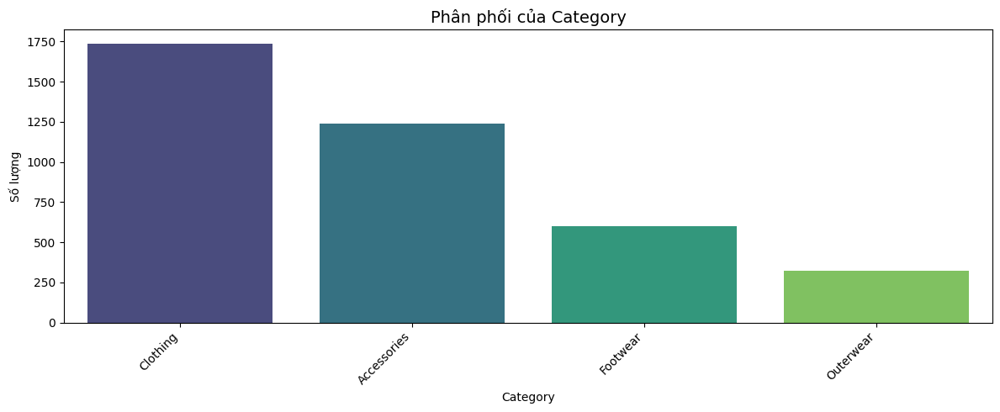

Tần suất của 'Category':
Category
Clothing       1737
Accessories    1240
Footwear        599
Outerwear       324
Name: count, dtype: int64
------------------------------------------------------------
* Hiển thị Top 15 loại phổ biến nhất (Tổng số loại: 50)


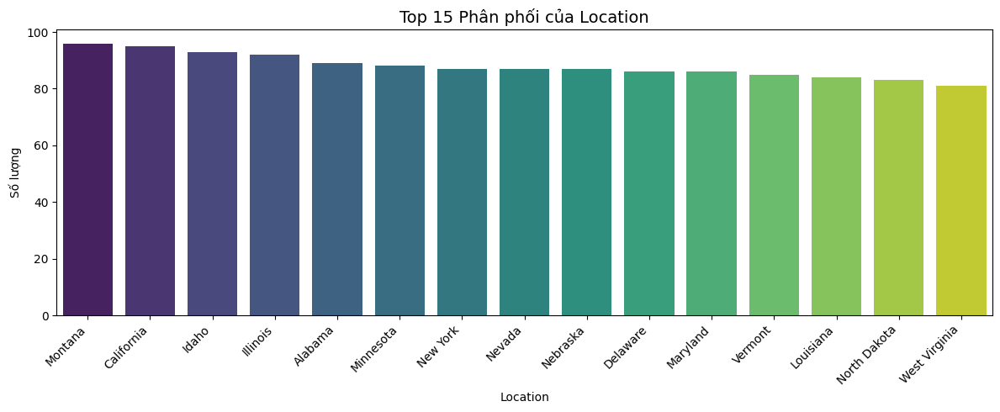

Tần suất của 'Location':
Location
Montana          96
California       95
Idaho            93
Illinois         92
Alabama          89
Minnesota        88
New York         87
Nevada           87
Nebraska         87
Delaware         86
Maryland         86
Vermont          85
Louisiana        84
North Dakota     83
West Virginia    81
Name: count, dtype: int64
------------------------------------------------------------


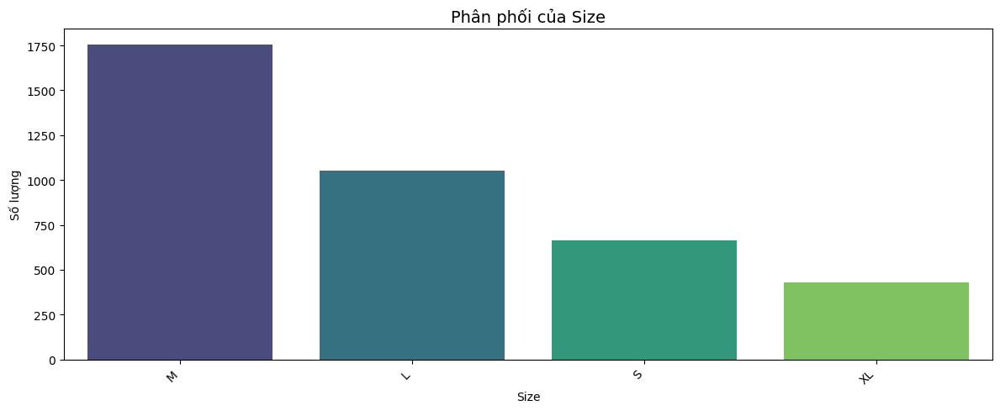

Tần suất của 'Size':
Size
M     1755
L     1053
S      663
XL     429
Name: count, dtype: int64
------------------------------------------------------------
* Cột 'Color' có 25 giá trị duy nhất. Chỉ hiển thị 5 giá trị phổ biến nhất:
Color
Olive     177
Yellow    174
Silver    173
Teal      172
Green     169
Name: count, dtype: int64
------------------------------------------------------------


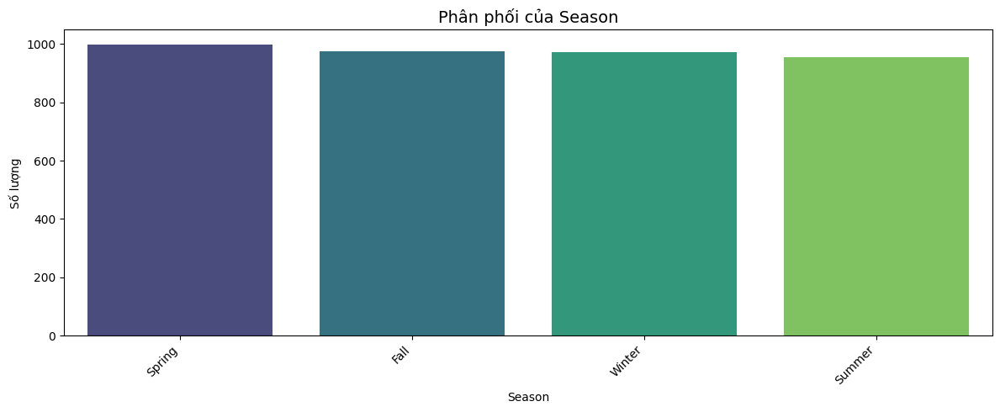

Tần suất của 'Season':
Season
Spring    999
Fall      975
Winter    971
Summer    955
Name: count, dtype: int64
------------------------------------------------------------


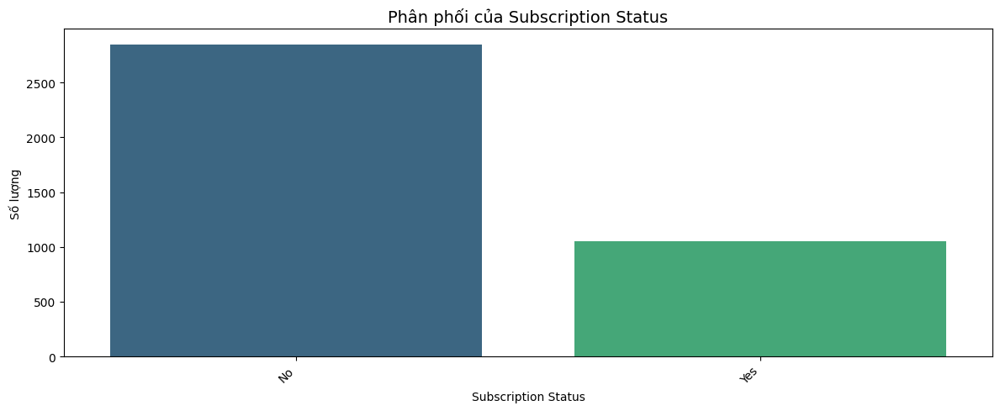

Tần suất của 'Subscription Status':
Subscription Status
No     2847
Yes    1053
Name: count, dtype: int64
------------------------------------------------------------


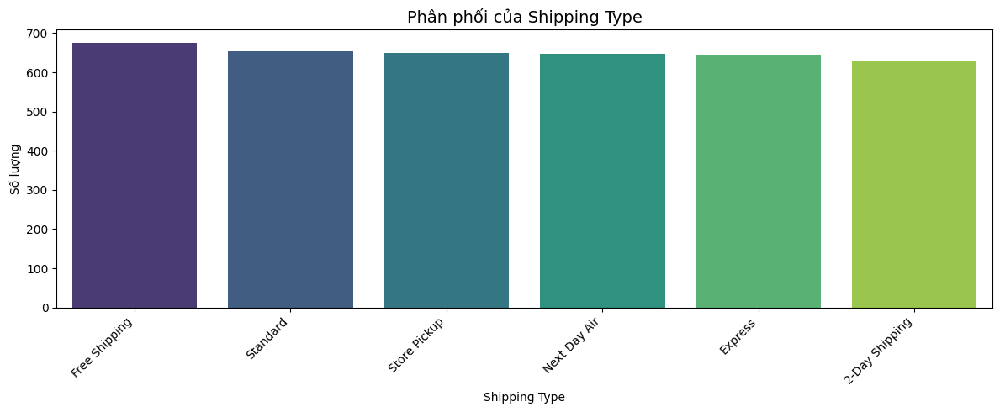

Tần suất của 'Shipping Type':
Shipping Type
Free Shipping     675
Standard          654
Store Pickup      650
Next Day Air      648
Express           646
2-Day Shipping    627
Name: count, dtype: int64
------------------------------------------------------------


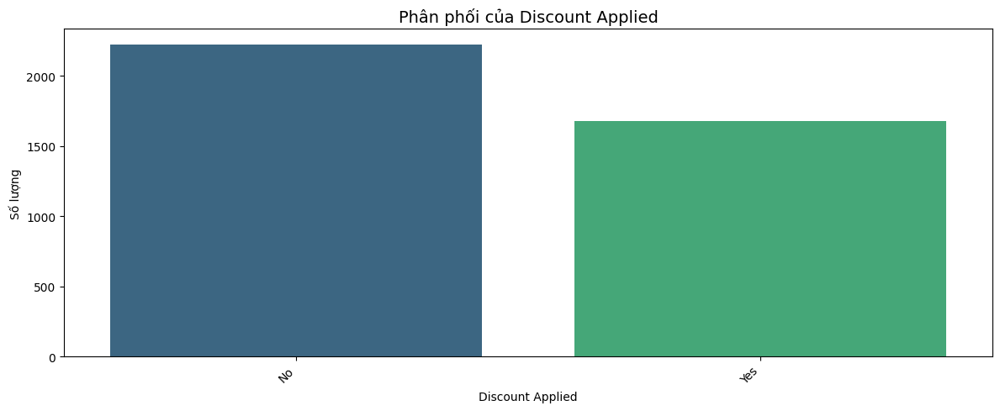

Tần suất của 'Discount Applied':
Discount Applied
No     2223
Yes    1677
Name: count, dtype: int64
------------------------------------------------------------


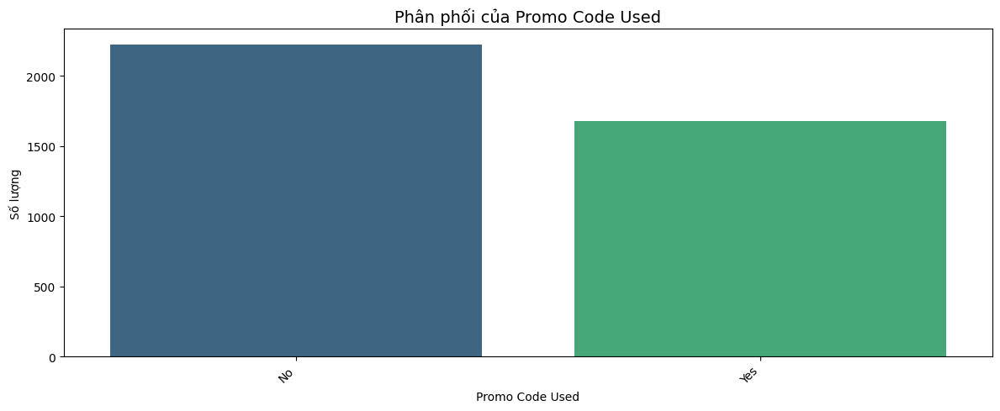

Tần suất của 'Promo Code Used':
Promo Code Used
No     2223
Yes    1677
Name: count, dtype: int64
------------------------------------------------------------


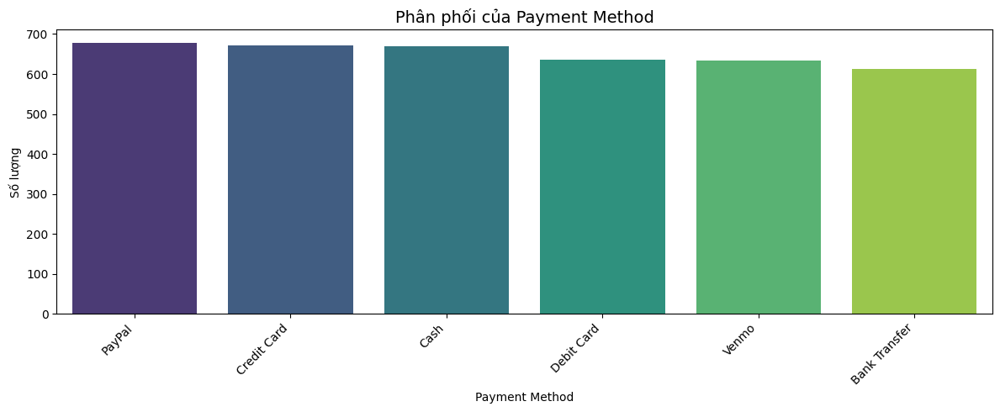

Tần suất của 'Payment Method':
Payment Method
PayPal           677
Credit Card      671
Cash             670
Debit Card       636
Venmo            634
Bank Transfer    612
Name: count, dtype: int64
------------------------------------------------------------


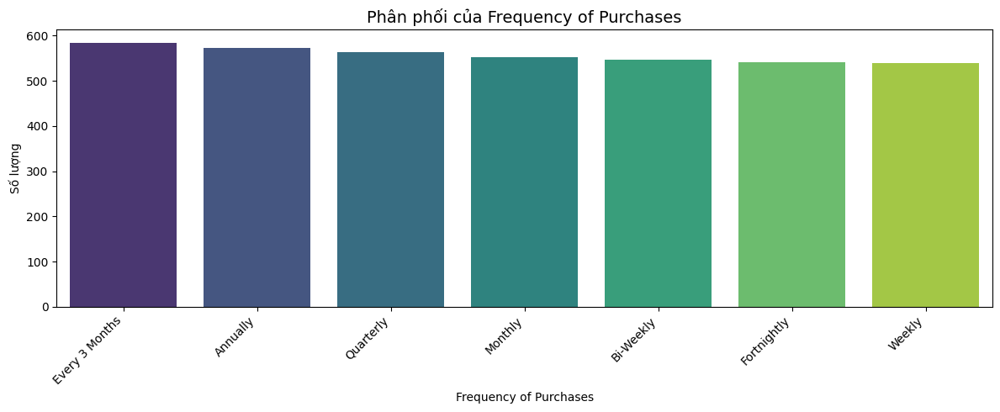

Tần suất của 'Frequency of Purchases':
Frequency of Purchases
Every 3 Months    584
Annually          572
Quarterly         563
Monthly           553
Bi-Weekly         547
Fortnightly       542
Weekly            539
Name: count, dtype: int64
------------------------------------------------------------


In [19]:
categorical_columns = df.select_dtypes(include=['object']).columns
cols_to_plot = ['Gender', 'Category', 'Item Purchased', 'Size', 'Season', 'Location',
                    'Subscription Status', 'Payment Method', 'Shipping Type',
                    'Discount Applied', 'Promo Code Used', 'Frequency of Purchases']

for col in categorical_columns:
    n_unique = df[col].nunique()
    if col in cols_to_plot or n_unique <= 20:
        plt.figure(figsize=(12, 5))
        order = df[col].value_counts().index

        if n_unique > 15:
            top_n = 15
            value_counts = df[col].value_counts().nlargest(top_n)
            sns.barplot(x=value_counts.index, y=value_counts.values, hue=value_counts.index, palette='viridis', order=value_counts.index, legend=False)
            plt.title(f'Top {top_n} Phân phối của {col}', fontsize=14)
            print(f"* Hiển thị Top {top_n} loại phổ biến nhất (Tổng số loại: {n_unique})")
        else:
            value_counts = df[col].value_counts()
            sns.barplot(x=value_counts.index, y=value_counts.values, hue=value_counts.index, palette='viridis', order=order, legend=False)
            plt.title(f'Phân phối của {col}', fontsize=14)

        plt.xlabel(col)
        plt.ylabel('Số lượng')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

        print(f"Tần suất của '{col}':")
        print(value_counts)
    else:
        print(f"* Cột '{col}' có {n_unique} giá trị duy nhất. Chỉ hiển thị 5 giá trị phổ biến nhất:")
        print(df[col].value_counts().head())
    print("-"*60)

**Nhận xét biến phân loại:**
- `Gender`: **Nam (Male) chiếm đa số** (khoảng 68%), gấp đôi Nữ (Female). Đây là một điểm mất cân bằng cần lưu ý.
- `Category` (Nhãn tiềm năng): **Clothing (Quần áo)** là danh mục phổ biến nhất, chiếm gần một nửa số giao dịch. Tiếp theo là Accessories (Phụ kiện), Footwear (Giày dép) và Outerwear (Áo khoác ngoài). Phân phối không cân bằng.
- `Item Purchased` (Nhãn tiềm năng): Có 25 loại mặt hàng. **Blouse, Jeans, Pants, Shirt, Dress** là những mặt hàng được mua nhiều nhất. Phân phối khá đa dạng, không quá tập trung vào một vài mặt hàng.
- `Location`, `Color`: Có quá nhiều giá trị duy nhất (50 và 25), biểu đồ đầy đủ sẽ khó đọc. Montana là địa điểm phổ biến nhất, Olive/Yellow/Silver/Teal/Green là các màu phổ biến.
- `Size`: Size **M (Medium)** là phổ biến nhất, chiếm hơn 40%. Tiếp theo là L (Large), S (Small), và XL (Extra Large).
- `Season`: Các mùa có số lượng mua hàng **khá cân bằng**, với Spring (Xuân) và Fall (Thu) nhỉnh hơn một chút so với Winter (Đông) và Summer (Hè).
- `Subscription Status`: Đa số khách hàng **không đăng ký (No)**, chiếm khoảng 73%.
- `Payment Method`, `Preferred Payment Method`: **PayPal và Credit Card** là hai phương thức thanh toán/ưu tiên thống trị. Các phương thức khác ít phổ biến hơn. Cần xem xét mối quan hệ giữa hai cột này.
- `Shipping Type`: **Free Shipping (Miễn phí vận chuyển)** là lựa chọn phổ biến nhất, tiếp theo là Standard (Tiêu chuẩn) và Store Pickup (Nhận tại cửa hàng). Các loại hình vận chuyển nhanh ít được sử dụng hơn.
- `Discount Applied`, `Promo Code Used`: Phần lớn các giao dịch **có áp dụng giảm giá/mã khuyến mãi (Yes)**, chiếm khoảng 57%. Hai cột này có vẻ liên quan chặt chẽ.
- `Frequency of Purchases`: Tần suất mua hàng **phân bố khá đều** giữa các lựa chọn (Weekly, Fortnightly, Monthly, Quarterly, Bi-Weekly, Annually, Every 3 Months), mỗi loại chiếm khoảng 13-15%.

## Phân tích hai biến (Bivariate Analysis)

#### Tương quan giữa các biến số (Feature-Feature: Numerical)

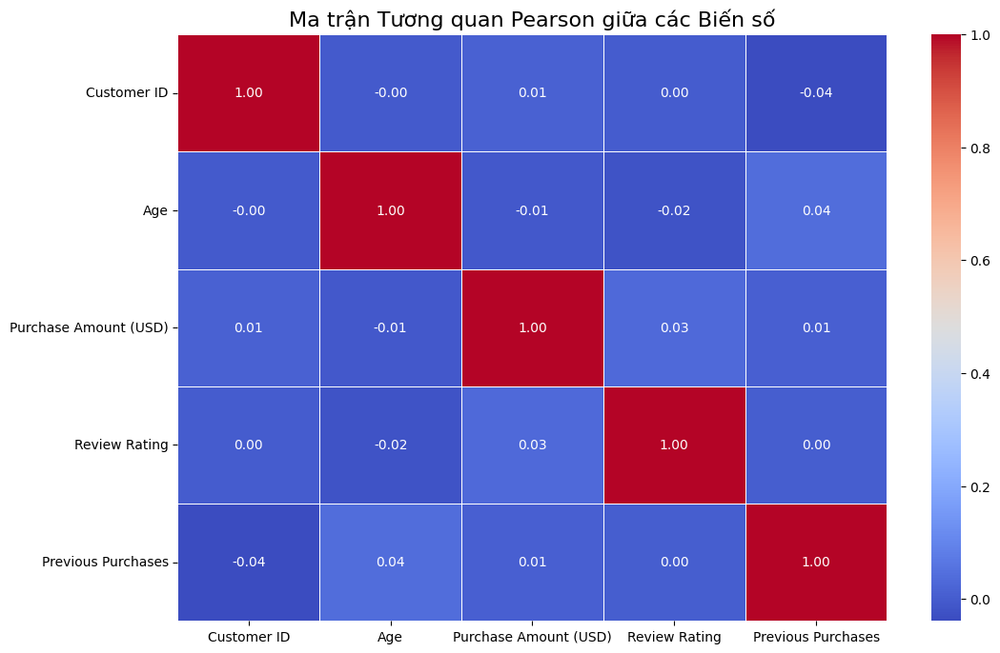

Ma trận tương quan Pearson:


,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Customer ID,1.000000,-0.004079,0.011048,0.001343,-0.039159
Age,-0.004079,1.000000,-0.010424,-0.021949,0.040445
Purchase Amount (USD),0.011048,-0.010424,1.000000,0.030776,0.008063
Review Rating,0.001343,-0.021949,0.030776,1.000000,0.004229
Previous Purchases,-0.039159,0.040445,0.008063,0.004229,1.000000


In [20]:
# Tính ma trận tương quan
numerical_columns = df.select_dtypes(include=np.number).columns
correlation_matrix = df[numerical_columns].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Ma trận Tương quan Pearson giữa các Biến số', fontsize=16)
plt.show()
print("Ma trận tương quan Pearson:")
display(correlation_matrix)

**Nhận xét ma trận tương quan:**
- Các hệ số tương quan Pearson giữa các cặp biến số (`Age`, `Purchase Amount (USD)`, `Review Rating`, `Previous Purchases`) đều **rất gần 0** (giá trị tuyệt đối < 0.04).
- Điều này cho thấy **hầu như không có mối quan hệ tuyến tính** nào đáng kể giữa các biến số này.
- Ví dụ: Tuổi của khách hàng không liên quan tuyến tính đến số tiền họ chi tiêu, đánh giá của họ, hay số lần mua hàng trước đó.
- Các biến số này cung cấp thông tin tương đối độc lập với nhau.

#### Mối quan hệ giữa biến số và biến phân loại (Feature-Feature/Label: Numerical vs Categorical)

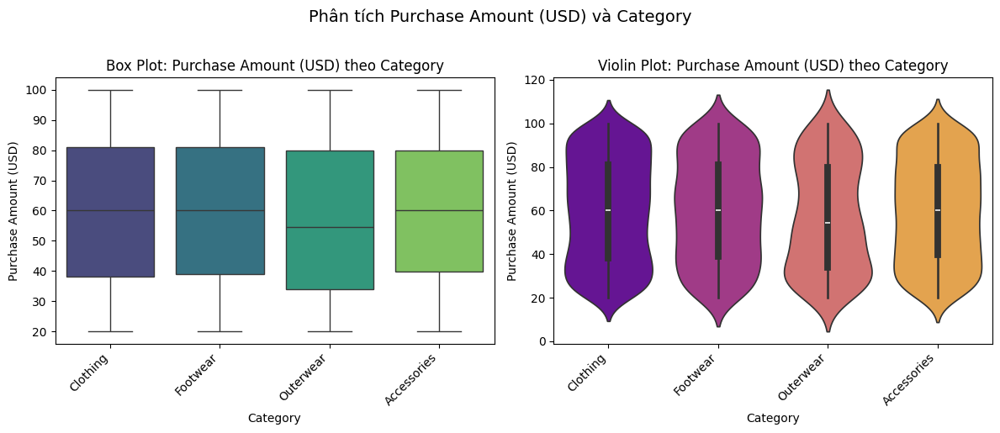

------------------------------------------------------------


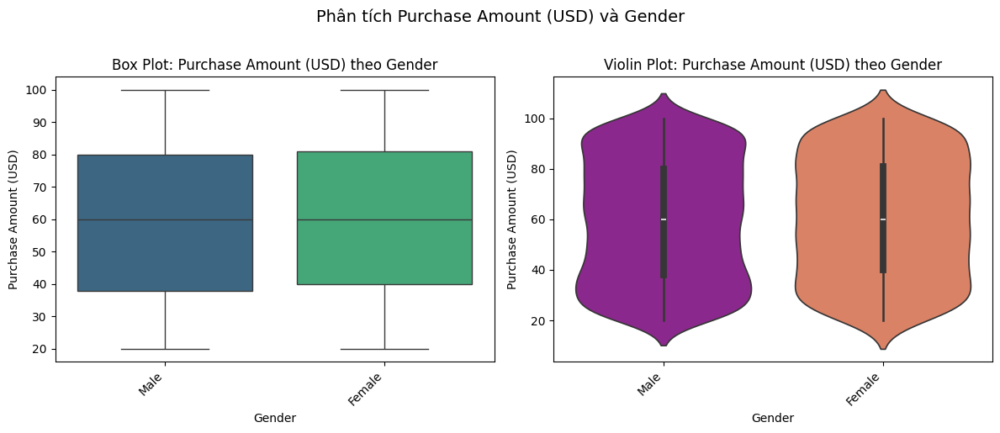

------------------------------------------------------------


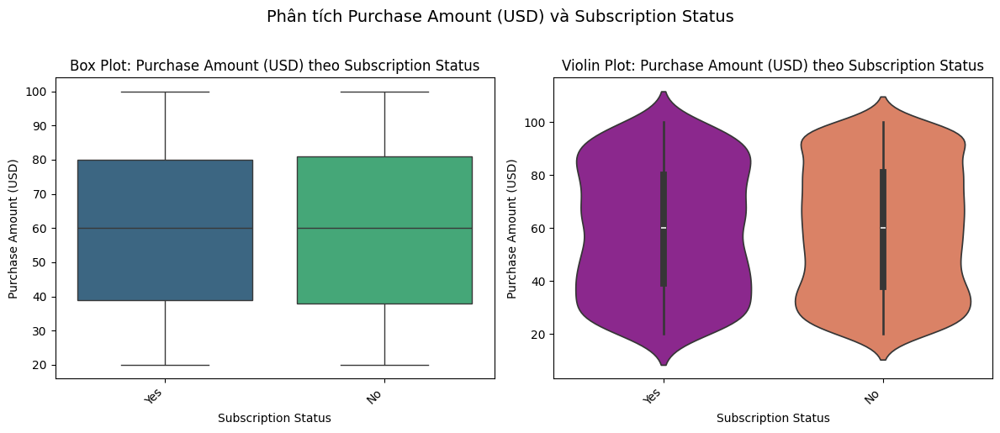

------------------------------------------------------------


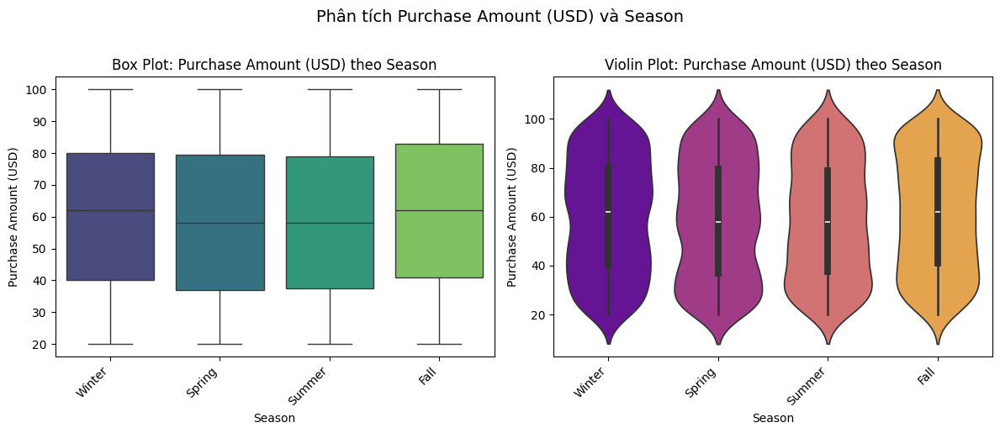

------------------------------------------------------------


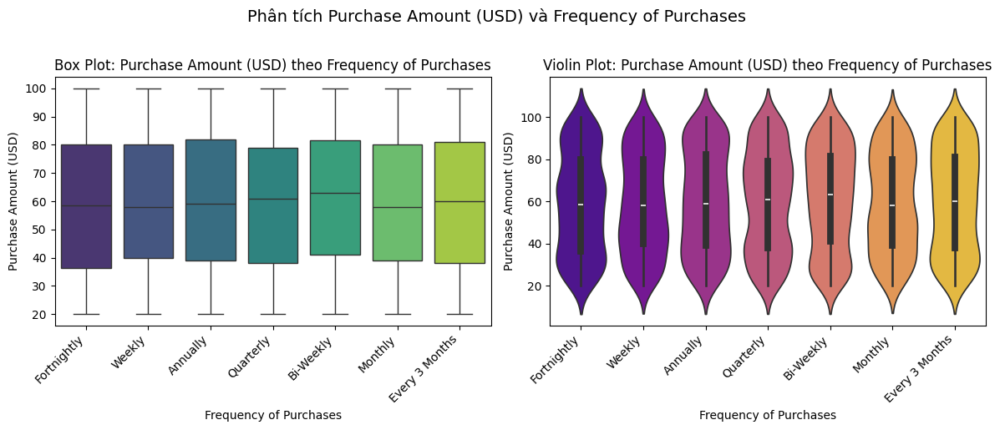

------------------------------------------------------------


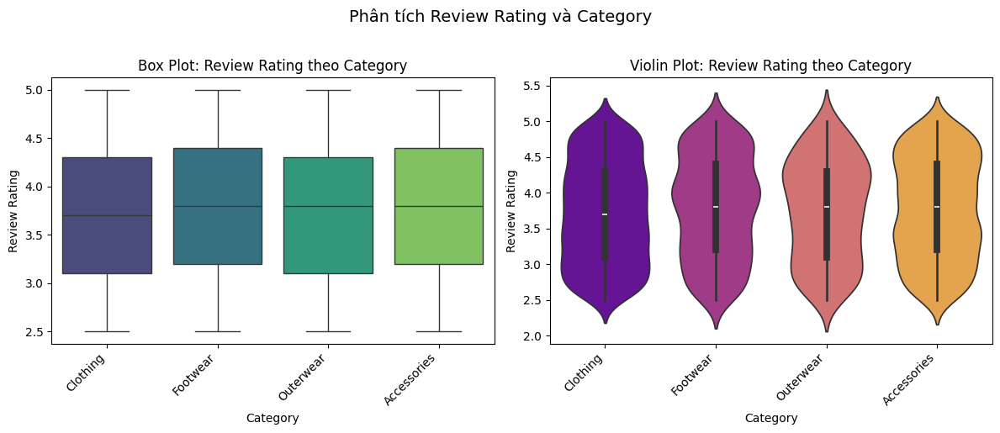

------------------------------------------------------------


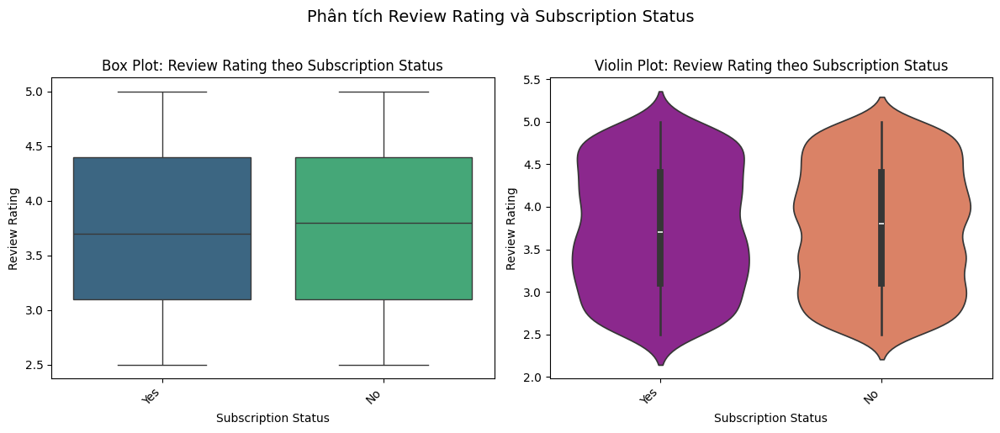

------------------------------------------------------------


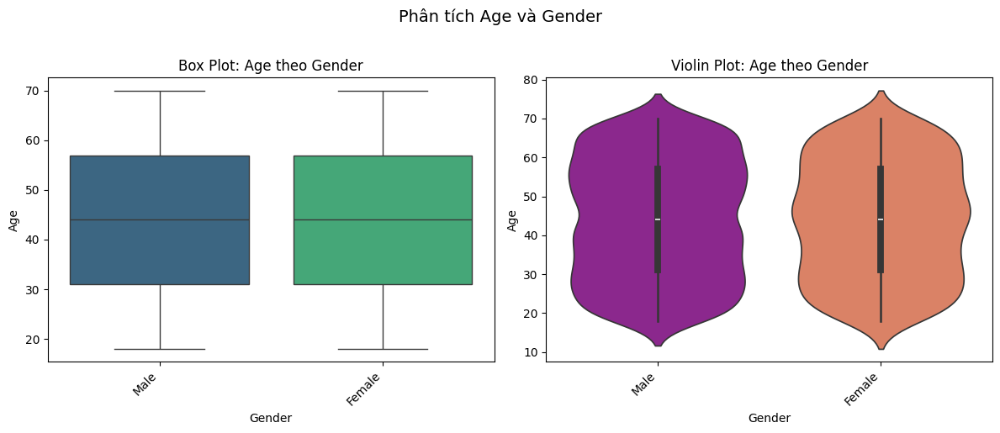

------------------------------------------------------------


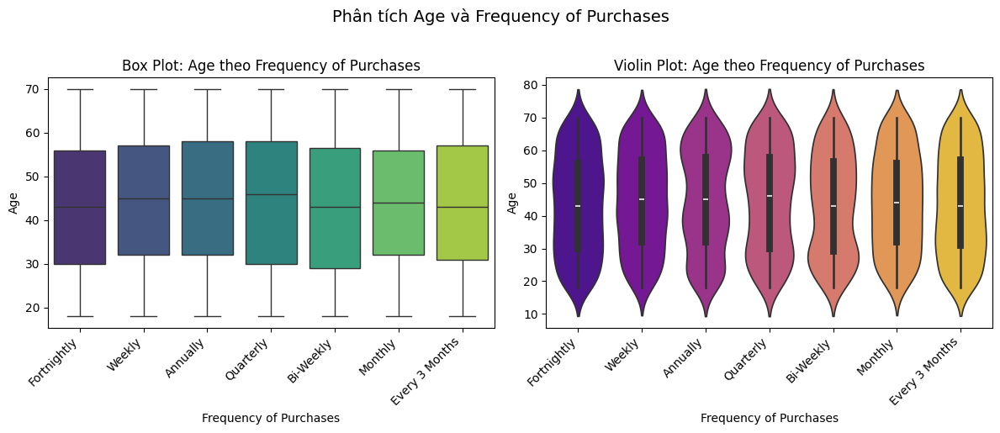

------------------------------------------------------------


In [21]:
num_vars = ['Purchase Amount (USD)', 'Review Rating', 'Age']
cat_vars = ['Category', 'Gender', 'Subscription Status', 'Season', 'Frequency of Purchases']

for num_var in num_vars:
    for cat_var in cat_vars:
        if (num_var == 'Age' and cat_var not in ['Gender', 'Frequency of Purchases']) or \
            (num_var == 'Review Rating' and cat_var not in ['Subscription Status', 'Category']):
            continue
        n_unique_cat = df[cat_var].nunique()
        if n_unique_cat > 10:
                continue
        plt.figure(figsize=(12, 5))
        # Box Plot
        plt.subplot(1, 2, 1)
        sns.boxplot(data=df, x=cat_var, y=num_var, hue=cat_var, palette='viridis', legend=False)
        plt.title(f'Box Plot: {num_var} theo {cat_var}', fontsize=12)
        plt.xlabel(cat_var)
        plt.ylabel(num_var)
        plt.xticks(rotation=45, ha='right')

        # Violin Plot (cung cấp thêm thông tin về mật độ)
        plt.subplot(1, 2, 2)
        sns.violinplot(data=df, x=cat_var, y=num_var, hue=cat_var, palette='plasma', legend=False)
        plt.title(f'Violin Plot: {num_var} theo {cat_var}', fontsize=12)
        plt.xlabel(cat_var)
        plt.ylabel(num_var)
        plt.xticks(rotation=45, ha='right')

        plt.suptitle(f'Phân tích {num_var} và {cat_var}', fontsize=14, y=1.02)
        plt.tight_layout()
        plt.show()
        print("-"*60)


**Nhận xét (Numerical vs Categorical):**
- `Purchase Amount vs Category`: Phân phối số tiền mua hàng (trung vị, tứ phân vị, mật độ) **khá tương đồng** giữa các danh mục (`Clothing`, `Footwear`, `Outerwear`, `Accessories`). Violin plot xác nhận phân phối gần như đồng đều trong mỗi danh mục. Không có danh mục nào nổi bật về mức chi tiêu cao hơn hẳn.
- `Purchase Amount vs Gender`: Phân phối số tiền mua hàng giữa **Nam và Nữ gần như giống hệt nhau**. Giới tính dường như không ảnh hưởng đến số tiền chi tiêu trung bình cho mỗi giao dịch.
- `Purchase Amount vs Season`: Phân phối số tiền mua hàng **không thay đổi đáng kể theo mùa**. Mức chi tiêu trung bình và khoảng biến thiên tương tự nhau qua các mùa.
- `Review Rating vs Category`: Đánh giá trung bình có vẻ **cao hơn một chút cho Footwear và Outerwear** so với Clothing và Accessories, nhưng sự khác biệt không lớn. Phân phối đánh giá lệch trái (nhiều điểm cao) ở tất cả các danh mục.
- `Review Rating vs Subscription Status`: Khách hàng đã đăng ký (`Yes`) có xu hướng đưa ra **đánh giá trung bình cao hơn một chút** so với khách hàng không đăng ký (`No`). Violin plot cho thấy mật độ đánh giá cao (4-5) dày đặc hơn ở nhóm 'Yes'.
- `Age vs Gender`: Phân phối tuổi giữa **Nam và Nữ rất giống nhau**, đều gần như đồng đều.
- `Age vs Frequency of Purchases`: Phân phối tuổi **khá tương đồng** giữa các nhóm tần suất mua hàng khác nhau. Không có nhóm tuổi nào đặc biệt ưa chuộng một tần suất mua hàng cụ thể.

### Mối quan hệ giữa các biến phân loại (Feature-Feature: Categorical vs Categorical)

- Category vs Gender

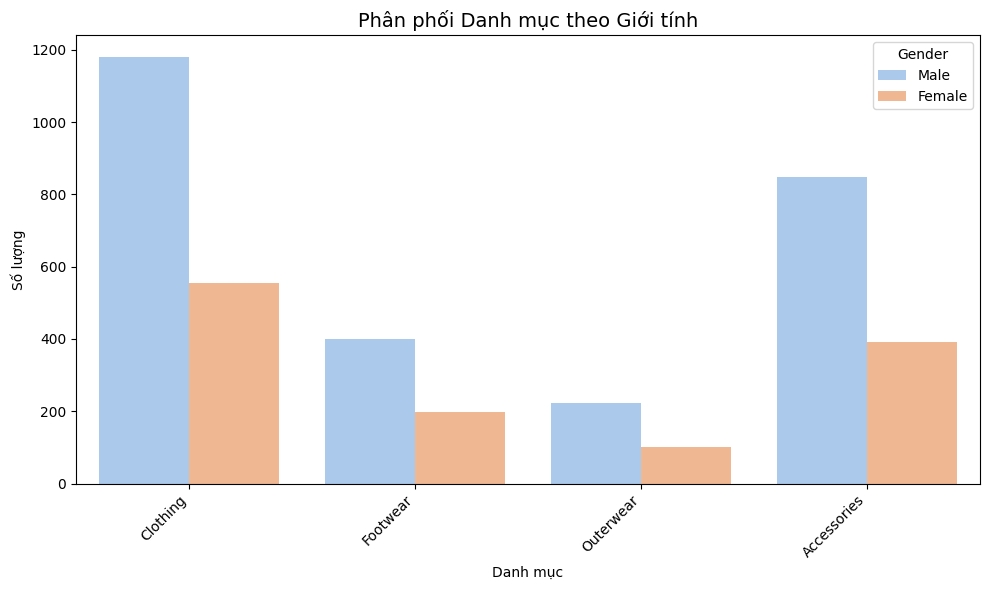

In [22]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Category', hue='Gender', palette='pastel')
plt.title('Phân phối Danh mục theo Giới tính', fontsize=14)
plt.xlabel('Danh mục')
plt.ylabel('Số lượng')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

- Season vs Subscription Status

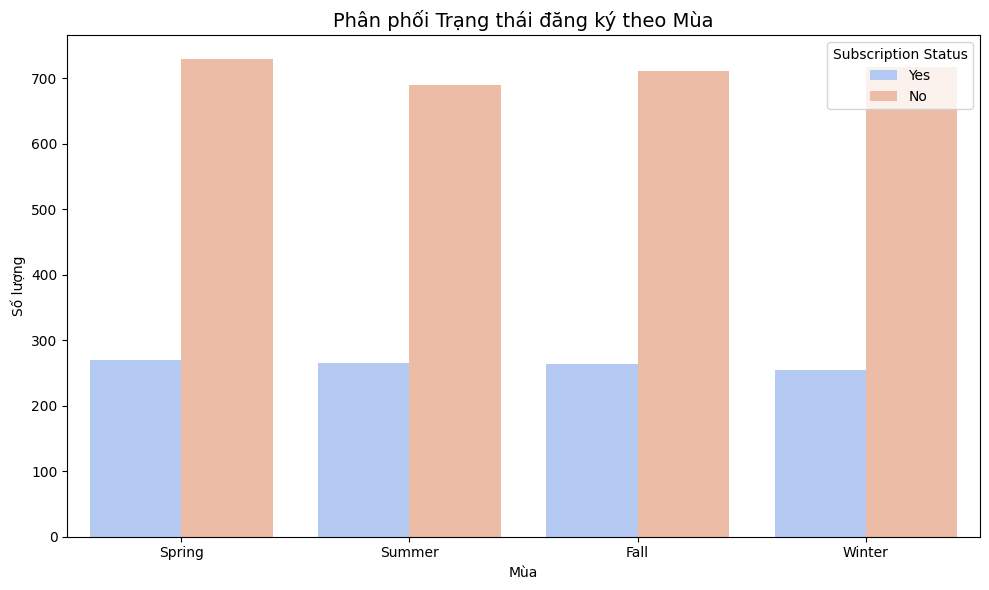

In [23]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Season', hue='Subscription Status', palette='coolwarm', order=['Spring', 'Summer', 'Fall', 'Winter'])
plt.title('Phân phối Trạng thái đăng ký theo Mùa', fontsize=14)
plt.xlabel('Mùa')
plt.ylabel('Số lượng')
plt.tight_layout()
plt.show()

- Discount Applied vs Promo Code Used

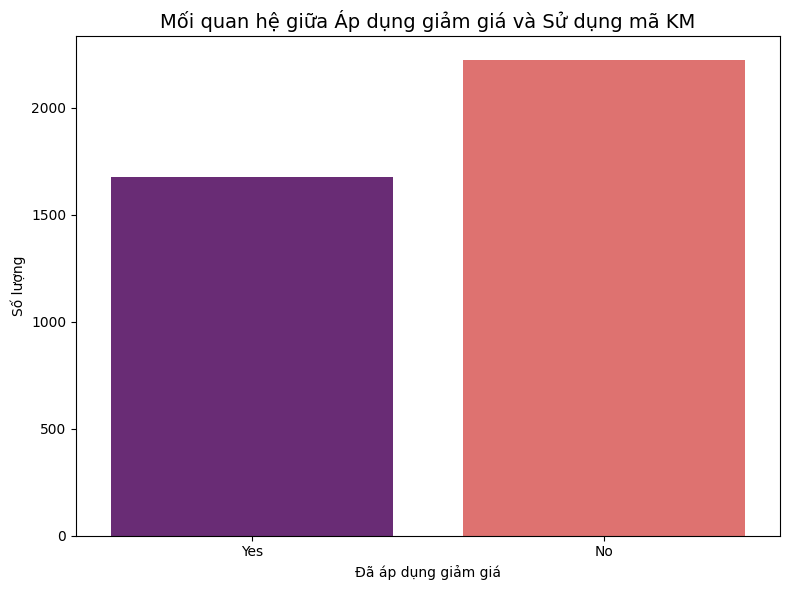

Bảng chéo: Discount Applied vs Promo Code Used


Promo Code Used,No,Yes
Discount Applied,,
No,2223,0
Yes,0,1677


In [24]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Discount Applied', hue='Promo Code Used', palette='magma')
plt.title('Mối quan hệ giữa Áp dụng giảm giá và Sử dụng mã KM', fontsize=14)
plt.xlabel('Đã áp dụng giảm giá')
plt.ylabel('Số lượng')
plt.tight_layout()
plt.show()
# Bảng chéo để xem chi tiết
print("Bảng chéo: Discount Applied vs Promo Code Used")
display(pd.crosstab(df['Discount Applied'], df['Promo Code Used']))

- Phân tích nhãn tiềm năng 'Item Purchased' với 'Gender'

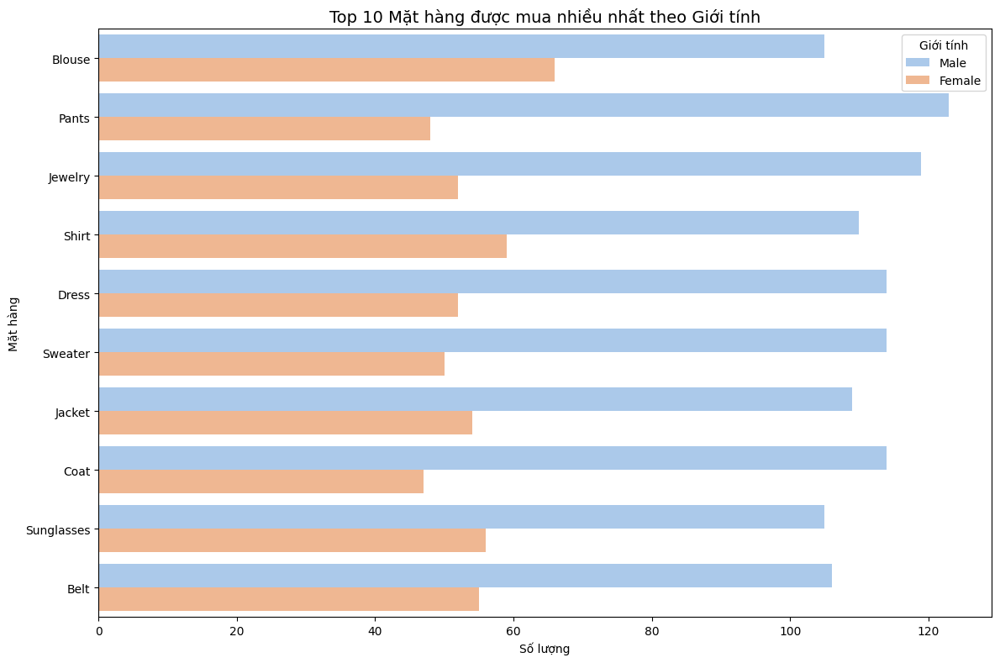

In [25]:
plt.figure(figsize=(12, 8))
top_items = df['Item Purchased'].value_counts().nlargest(10).index
sns.countplot(data=df[df['Item Purchased'].isin(top_items)], y='Item Purchased', hue='Gender', palette='pastel', order=top_items)
plt.title('Top 10 Mặt hàng được mua nhiều nhất theo Giới tính', fontsize=14)
plt.xlabel('Số lượng')
plt.ylabel('Mặt hàng')
plt.legend(title='Giới tính')
plt.tight_layout()
plt.show()

- Gender and Size

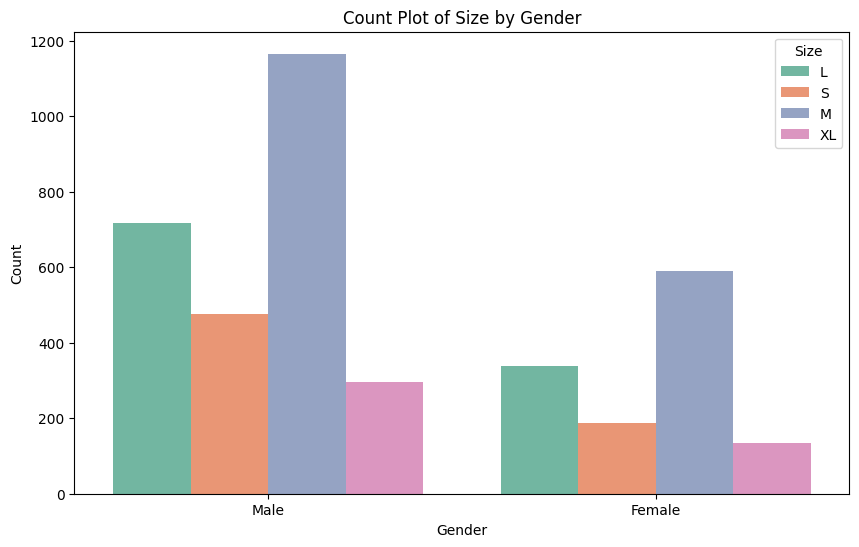

In [26]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Gender', hue='Size', palette='Set2')
plt.title("Count Plot of Size by Gender")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.legend(title="Size")
plt.show()


- Discount applied vs Gender

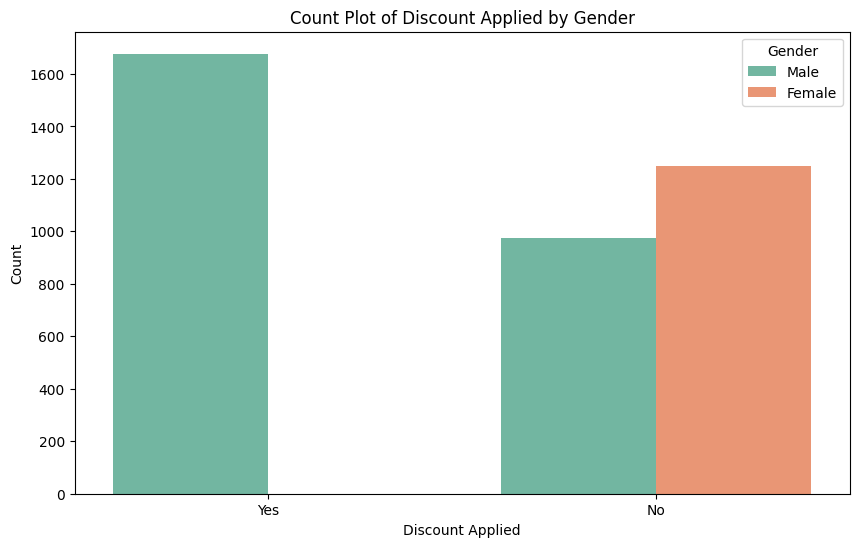

In [27]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Discount Applied', hue='Gender', palette='Set2')
plt.title("Count Plot of Discount Applied by Gender")
plt.xlabel("Discount Applied")
plt.ylabel("Count")
plt.legend(title="Gender")
plt.show()


**Nhận xét (Categorical vs Categorical):**
- `Category vs Gender`: Ở **mọi danh mục**, số lượng mua hàng của **Nam đều nhiều hơn Nữ**, phản ánh tỷ lệ giới tính chung trong dữ liệu (Nam chiếm ~68%). Tỷ lệ phân bố các danh mục trong nhóm Nam và Nữ có vẻ tương tự nhau (Clothing là phổ biến nhất cho cả hai).
- `Season vs Subscription Status`: Tỷ lệ khách hàng **không đăng ký (No) luôn cao hơn** khách hàng có đăng ký (Yes) ở tất cả các mùa. Không có sự khác biệt rõ rệt về xu hướng đăng ký theo mùa; tỷ lệ Yes/No khá ổn định qua các mùa.
- `Discount Applied vs Promo Code Used`: Có một **mối quan hệ cực kỳ chặt chẽ** giữa hai biến này. Bảng chéo cho thấy 100% các trường hợp `Discount Applied = Yes` đều tương ứng với `Promo Code Used = Yes`, và 100% trường hợp `Discount Applied = No` tương ứng với `Promo Code Used = No`. Điều này xác nhận hai cột này chứa **thông tin hoàn toàn trùng lặp**.
- `Item Purchased vs Gender` (Phân tích nhãn tiềm năng): Xem xét top 10 mặt hàng phổ biến nhất, tỷ lệ Nam mua nhiều hơn Nữ được duy trì ở hầu hết các mặt hàng, phù hợp với tỷ lệ giới tính chung. Không có mặt hàng nào trong top 10 cho thấy sự ưa chuộng đặc biệt rõ rệt của một giới tính so với giới tính còn lại (ví dụ: tỷ lệ Nam/Nữ mua Blouse tương tự tỷ lệ Nam/Nữ mua Jeans).

## Phân tích đa biến (Multivariate Analysis)

## Pair Plot cho các biến số theo Giới tính

- Thêm cột 'Gender' vào danh sách để dùng làm hue

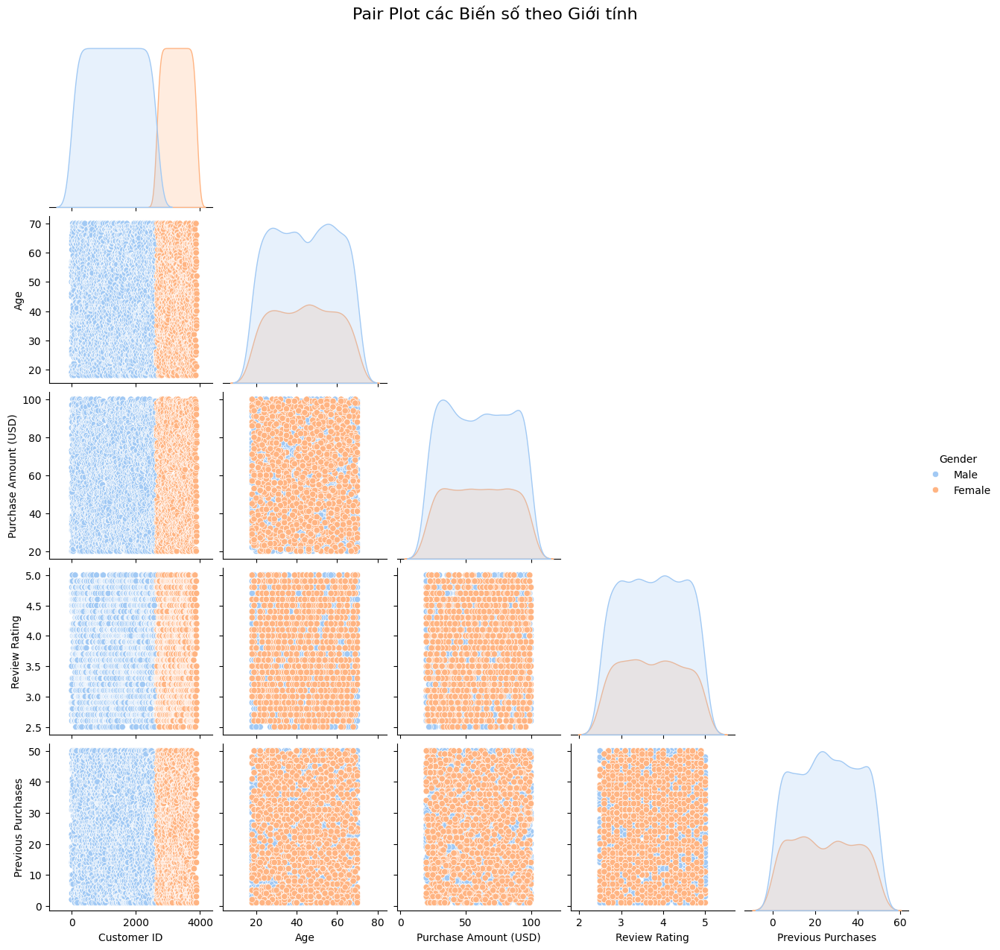

In [28]:
cols_for_pairplot = numerical_columns.tolist() + ['Gender']
sns.pairplot(df[cols_for_pairplot], hue='Gender', diag_kind='kde', corner=True, palette='pastel')
plt.suptitle('Pair Plot các Biến số theo Giới tính', y=1.02, fontsize=16)
plt.show()


**Nhận xét Pair Plot:**
- **Tương quan:** Các biểu đồ phân tán (scatter plots) ở các ô không nằm trên đường chéo xác nhận lại kết quả từ ma trận tương quan: **không có mối quan hệ tuyến tính rõ ràng** giữa các cặp biến số (`Age`, `Purchase Amount (USD)`, `Review Rating`, `Previous Purchases`). Các điểm dữ liệu phân bố khá ngẫu nhiên.
- **Phân phối theo Giới tính:** Các biểu đồ phân phối mật độ (KDE) trên đường chéo cho thấy hình dạng phân phối của từng biến số là **tương tự nhau giữa Nam và Nữ**. Mặc dù số lượng Nam nhiều hơn, nhưng hình dạng chung của phân phối tuổi, số tiền mua hàng, đánh giá, và số lượt mua trước đó không khác biệt đáng kể giữa hai giới.

#### Phân tích Số tiền mua hàng theo Danh mục và Giới tính

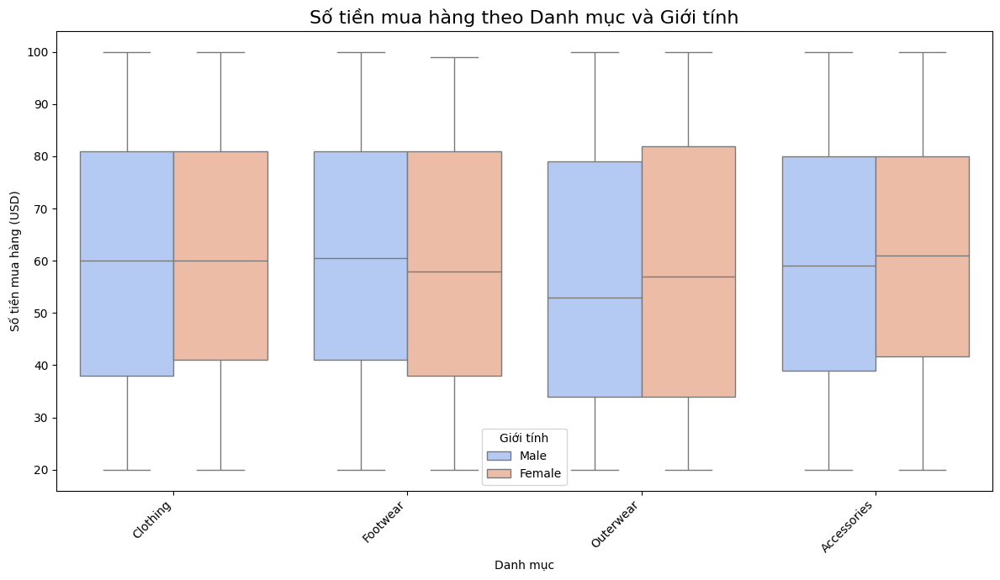

In [29]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=df, x='Category', y='Purchase Amount (USD)', hue='Gender', palette='coolwarm')
plt.title('Số tiền mua hàng theo Danh mục và Giới tính', fontsize=16)
plt.xlabel('Danh mục')
plt.ylabel('Số tiền mua hàng (USD)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Giới tính')
plt.tight_layout()
plt.show()


**Nhận xét (Số tiền mua hàng theo Danh mục và Giới tính):**
- Biểu đồ này kết hợp thông tin từ `Purchase Amount`, `Category`, và `Gender`.
- Nó tái khẳng định những gì đã thấy trong phân tích hai biến:
  - Phân phối số tiền mua hàng **khá giống nhau giữa các danh mục**.
  - Phân phối số tiền mua hàng **gần như giống hệt nhau giữa Nam và Nữ** trong từng danh mục.
- Không có sự tương tác đáng kể nào giữa Giới tính và Danh mục đối với Số tiền mua hàng. Ví dụ, không có chuyện Nam chi tiêu nhiều hơn Nữ đáng kể chỉ ở một danh mục cụ thể nào đó.

### 8. Tổng kết và Nhận xét chung:
- **Chất lượng dữ liệu:** Dữ liệu rất tốt, đầy đủ, **không có giá trị thiếu (NULL)** như đã kiểm tra. Các kiểu dữ liệu phù hợp.
- **Phân phối biến:**
  - Các biến số (`Age`, `Purchase Amount`, `Previous Purchases`) có phân phối gần như đồng đều.
  - `Review Rating` lệch trái nhẹ (nhiều đánh giá cao).
  - Biến `Gender` mất cân bằng (Nam nhiều hơn Nữ).
  - Các biến phân loại khác như `Category`, `Size`, `Payment Method`, `Shipping Type` có sự tập trung vào một vài giá trị phổ biến (`Clothing`, `M`, `PayPal`/`Credit Card`, `Free Shipping`).
  - `Season` và `Frequency of Purchases` phân bố khá đều.
- **Ngoại lai:** Các biến số chính (`Age`, `Purchase Amount`, `Previous Purchases`) **không có ngoại lai đáng kể** theo phương pháp IQR. `Review Rating` có một số điểm thấp nhưng nằm trong phạm vi hợp lệ và không ảnh hưởng lớn.
- **Mối quan hệ:**
  - **Không có tương quan tuyến tính** mạnh giữa các biến số.
  - Số tiền mua hàng (`Purchase Amount`) **không phụ thuộc nhiều** vào `Category`, `Gender`, hay `Season`.
  - Khách hàng đăng ký (`Subscription Status=Yes`) có xu hướng **đánh giá cao hơn một chút**.
  - `Discount Applied` và `Promo Code Used` chứa **thông tin hoàn toàn trùng lặp**.
- **Phân tích nhãn tiềm năng (cho bài toán đề xuất):**
  - `Category`: 'Clothing' chiếm đa số, các danh mục khác ít hơn đáng kể.
  - `Item Purchased`: Phân phối đa dạng hơn `Category`, có 25 mặt hàng, top 5 là Blouse, Jeans, Pants, Shirt, Dress. Không có sự khác biệt lớn về sở thích mặt hàng (trong top 10) giữa Nam và Nữ.
- **Hướng tiếp theo:**
  - Dữ liệu sạch và có cấu trúc tốt, sẵn sàng cho các bước tiếp theo như tiền xử lý (mã hóa biến phân loại) và xây dựng mô hình.
  - **Cần loại bỏ một trong hai cột `Discount Applied` hoặc `Promo Code Used`** do tính dư thừa.
  - Sự mất cân bằng giới tính cần được lưu ý nếu xây dựng mô hình dự đoán liên quan đến giới tính, nhưng có thể không ảnh hưởng nhiều đến mô hình đề xuất dựa trên sản phẩm/danh mục.
  - Dữ liệu phù hợp để xây dựng các mô hình đề xuất (ví dụ: lọc cộng tác dựa trên `Customer ID`, `Item Purchased`, `Review Rating`; hoặc lọc dựa trên nội dung/thuộc tính sản phẩm như `Category`, `Color`, `Season`) hoặc phân cụm khách hàng (dựa trên `Age`, `Frequency of Purchases`, `Category` ưa thích, v.v.).

# Bước 3: Tiền xử lý dữ liệu - Preprocessing


In [30]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns


In [31]:
df = pd.read_csv(dataset_path)


In [32]:
pd.set_option('display.max_columns', None)


In [33]:
df.head()


,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually


- Kiểm tra lại giá trị thiếu

In [34]:
print("Kiểm tra giá trị thiếu:")
print(df.isnull().sum())


Kiểm tra giá trị thiếu:
Customer ID               0
Age                       0
Gender                    0
Item Purchased            0
Category                  0
Purchase Amount (USD)     0
Location                  0
Size                      0
Color                     0
Season                    0
Review Rating             0
Subscription Status       0
Shipping Type             0
Discount Applied          0
Promo Code Used           0
Previous Purchases        0
Payment Method            0
Frequency of Purchases    0
dtype: int64


- Kiểm tra ngoại lai cho các cột số (sử dụng IQR)

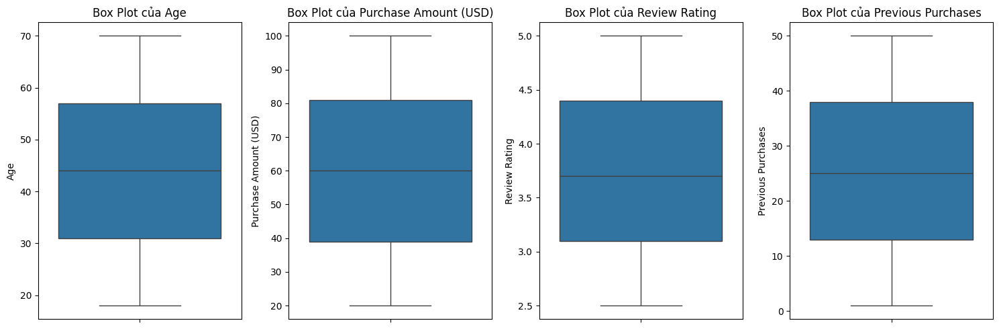

In [35]:
numeric_cols_initial = ['Age', 'Purchase Amount (USD)', 'Review Rating', 'Previous Purchases']
plt.figure(figsize=(15, 5))
for i, col in enumerate(numeric_cols_initial, 1):
    plt.subplot(1, len(numeric_cols_initial), i)
    sns.boxplot(y=df[col])
    plt.title(f'Box Plot của {col}')
plt.tight_layout()
plt.show()

In [36]:
print("\nNhận xét ngoại lai:")
# Dựa trên EDA trước đó, không có ngoại lai đáng kể cần loại bỏ ở bước này.
# Nếu có, có thể xử lý bằng cách loại bỏ hoặc capping (ví dụ: thay thế bằng percentile 1 và 99).
# Ví dụ capping (chưa áp dụng):
# lower_bound = df['Review Rating'].quantile(0.01)
# upper_bound = df['Review Rating'].quantile(0.99)
# df['Review Rating'] = np.where(df['Review Rating'] < lower_bound, lower_bound, df['Review Rating'])
# df['Review Rating'] = np.where(df['Review Rating'] > upper_bound, upper_bound, df['Review Rating'])



Nhận xét ngoại lai:


In [37]:
unique_counts = df.nunique()
unique_counts


,0
Customer ID,3900
Age,53
Gender,2
Item Purchased,25
Category,4
Purchase Amount (USD),81
Location,50
Size,4
Color,25
Season,4


### 1. Tạo đặc trưng mới - `Product_ID`

**Mục tiêu**: Tạo mã định danh duy nhất cho sản phẩm, vì `Item Purchased` không đủ chi tiết để phân biệt các sản phẩm khác nhau.

- **Vấn đề:**

  - Item Purchased (như Blouse, Sweater) chỉ là tên sản phẩm, không bao gồm thông tin về Category, Size, Color.

  - Ví dụ: Blouse màu Gray, size L khác với Blouse màu Black, size M, nhưng chỉ có cùng Item Purchased.

  - Điều này gây khó khăn cho Collaborative Filtering và Content-Based Filtering.

- **Ý nghĩa:**

  - *Product_ID* đảm bảo mỗi sản phẩm được định danh rõ ràng, phù hợp để xây dựng ma trận *User-Item*.

  - Hỗ trợ Content-Based Filtering bằng cách giữ thông tin chi tiết về sản phẩm (danh mục, kích cỡ, màu sắc).

  - Giảm nhầm lẫn khi gợi ý sản phẩm (ví dụ: không gợi ý cùng một **BLOUSE** với màu/kích cỡ không phù hợp).

In [38]:
df['Product_ID'] = (df['Item Purchased'] + '_' +
                    df['Category'] + '_' +
                    df['Size'] + '_' +
                    df['Color'])


In [39]:
df.head()


,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Blouse_Clothing_L_Gray
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,Sweater_Clothing_L_Maroon
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,Jeans_Clothing_S_Maroon
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,Sandals_Footwear_M_Maroon
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Blouse_Clothing_M_Turquoise


### 2. Mã hóa đặc trưng phân loại

Sử dụng One-Hot Encoding cho các biến có ít giá trị duy nhất và không có thứ tự tự nhiên (Gender, Category).

Sử dụng Label Encoding cho các biến có nhiều giá trị hơn hoặc có thể có thứ tự tiềm ẩn (mặc dù LabelEncoder không bảo toàn thứ tự, nó tiết kiệm chiều dữ liệu).


In [40]:
one_hot_cols = ['Gender', 'Category']
df = pd.get_dummies(df, columns=one_hot_cols, prefix=one_hot_cols, dtype=int)


In [41]:
df.head()


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Gender_Male,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear
0,1,55,Blouse,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,1,0,1,0,0
1,2,19,Sweater,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,1,0,1,0,0
2,3,50,Jeans,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,1,0,1,0,0
3,4,21,Sandals,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,1,0,0,1,0
4,5,45,Blouse,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,1,0,1,0,0


In [42]:
categorical_cols = ['Location', 'Size', 'Color',
                    'Subscription Status', 'Shipping Type', 'Discount Applied',
                    'Promo Code Used', 'Payment Method']

le = LabelEncoder()
label_mappings = {}
for col in categorical_cols:
    df[col + '_encoded'] = le.fit_transform(df[col])
    label_mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))


In [43]:
df.head()


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Gender_Male,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Promo Code Used_encoded,Payment Method_encoded
0,1,55,Blouse,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,1,0,1,0,0,16,0,7,1,1,1,1,5
1,2,19,Sweater,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,1,0,1,0,0,18,0,12,1,1,1,1,1
2,3,50,Jeans,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,1,0,1,0,0,20,2,12,1,2,1,1,2
3,4,21,Sandals,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,1,0,0,1,0,38,1,12,1,3,1,1,4
4,5,45,Blouse,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,1,0,1,0,0,36,1,21,1,2,1,1,4


#### 2.1 Kiểm tra tương quan giữa các đặc trưng đã mã hóa (Redundancy Check)

In [44]:
encoded_cols = [col for col in df.columns if '_encoded' in col or 'Gender_' in col or 'Category_' in col]
corr_matrix_encoded = df[encoded_cols].corr()
corr_matrix_encoded


,Gender_Female,Gender_Male,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Promo Code Used_encoded,Payment Method_encoded
Gender_Female,1.000000,-1.000000,-0.005666,0.000177,0.011160,-0.005337,-0.000747,-0.018764,0.000560,-0.417197,-0.016490,-0.595823,-0.595823,-0.003369
Gender_Male,-1.000000,1.000000,0.005666,-0.000177,-0.011160,0.005337,0.000747,0.018764,-0.000560,0.417197,0.016490,0.595823,0.595823,0.003369
Category_Accessories,-0.005666,0.005666,1.000000,-0.611845,-0.290844,-0.205515,0.000754,0.033260,-0.024460,-0.000992,0.008173,0.010899,0.010899,0.017178
Category_Clothing,0.000177,-0.000177,-0.611845,1.000000,-0.381735,-0.269740,-0.007941,-0.009671,0.026566,-0.013933,-0.003782,-0.016579,-0.016579,-0.028651
Category_Footwear,0.011160,-0.011160,-0.290844,-0.381735,1.000000,-0.128223,0.017624,-0.012903,-0.001141,0.014849,0.001215,0.002054,0.002054,0.014357
Category_Outerwear,-0.005337,0.005337,-0.205515,-0.269740,-0.128223,1.000000,-0.009997,-0.021848,-0.005079,0.007366,-0.008567,0.008782,0.008782,0.003854
Location_encoded,-0.000747,0.000747,0.000754,-0.007941,0.017624,-0.009997,1.000000,0.000275,-0.004944,0.004529,-0.001458,0.011926,0.011926,-0.006931
Size_encoded,-0.018764,0.018764,0.033260,-0.009671,-0.012903,-0.021848,0.000275,1.000000,-0.005124,-0.014501,0.001020,-0.001804,-0.001804,-0.033220
Color_encoded,0.000560,-0.000560,-0.024460,0.026566,-0.001141,-0.005079,-0.004944,-0.005124,1.000000,0.021333,-0.000034,0.019394,0.019394,-0.007578
Subscription Status_encoded,-0.417197,0.417197,-0.000992,-0.013933,0.014849,0.007366,0.004529,-0.014501,0.021333,1.000000,0.017142,0.700202,0.700202,0.015559


In [45]:
# Hiển thị heatmap cho các tương quan cao
high_corr_threshold = 0.8
high_corr = corr_matrix_encoded[((corr_matrix_encoded > high_corr_threshold) | (corr_matrix_encoded < -high_corr_threshold)) & (corr_matrix_encoded != 1.0)]
high_corr

,Gender_Female,Gender_Male,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Promo Code Used_encoded,Payment Method_encoded
Gender_Female,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender_Male,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category_Accessories,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category_Clothing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category_Footwear,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category_Outerwear,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Location_encoded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Size_encoded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Color_encoded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Subscription Status_encoded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


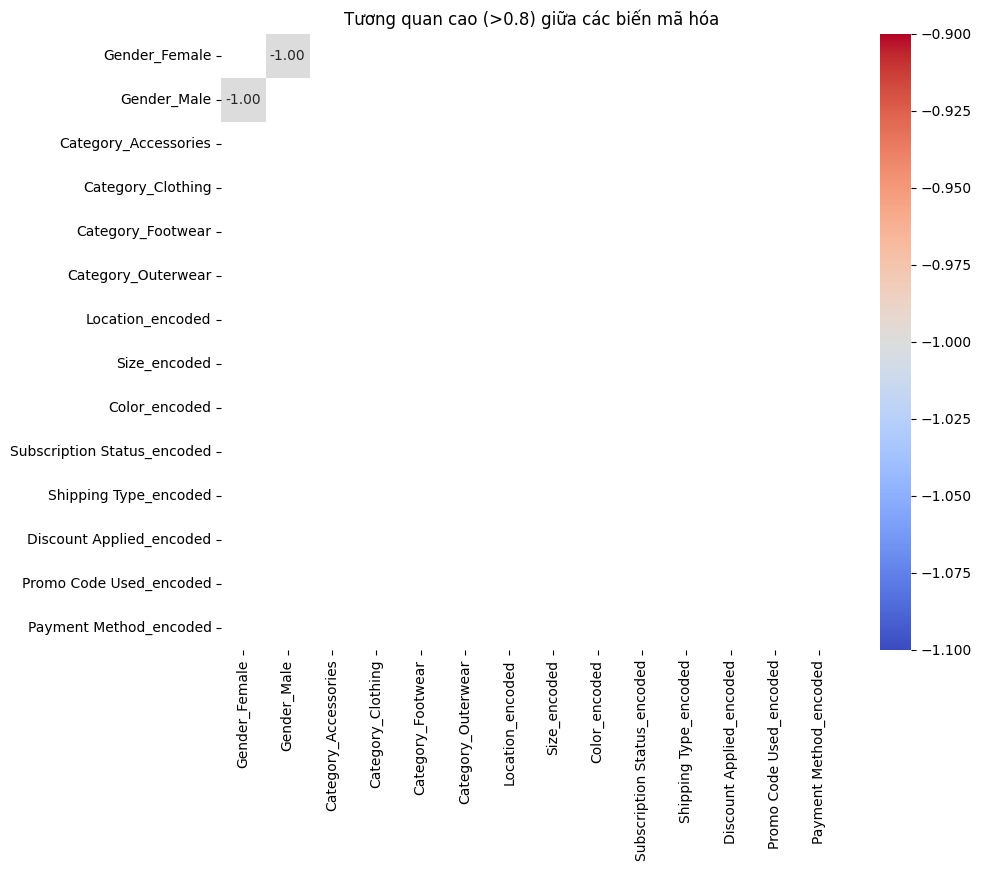

In [46]:
# Hiển thị heatmap cho các tương quan cao
plt.figure(figsize=(10, 8))
sns.heatmap(high_corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Tương quan cao (>{high_corr_threshold}) giữa các biến mã hóa')
plt.show()


In [47]:
print("Nhận xét về tương quan cao:")
print("- Gender_Female và Gender_Male có tương quan hoàn hảo -1. Một trong hai cột này là dư thừa và nên được loại bỏ để tránh multicollinearity.")
print("- Discount Applied_encoded và Promo Code Used_encoded có tương quan hoàn hảo 1. Một trong hai cột này là dư thừa.")

# Loại bỏ cột dư thừa (ví dụ: Gender_Male và Promo Code Used_encoded)
df = df.drop(columns=['Gender_Male', 'Promo Code Used_encoded'])
print("\nĐã loại bỏ cột Gender_Male và Promo Code Used_encoded.")


Nhận xét về tương quan cao:
- Gender_Female và Gender_Male có tương quan hoàn hảo -1. Một trong hai cột này là dư thừa và nên được loại bỏ để tránh multicollinearity.
- Discount Applied_encoded và Promo Code Used_encoded có tương quan hoàn hảo 1. Một trong hai cột này là dư thừa.

Đã loại bỏ cột Gender_Male và Promo Code Used_encoded.


### 3. Chuẩn hóa đặc trưng số

Sử dụng StandardScaler để đưa các đặc trưng số về cùng một thang đo (trung bình 0, độ lệch chuẩn 1).

Điều này quan trọng cho các thuật toán nhạy cảm với thang đo như KNN, SVM, hoặc các phương pháp dựa trên khoảng cách.

In [48]:
numeric_cols = ['Age', 'Purchase Amount (USD)', 'Review Rating', 'Previous Purchases']

scaler = StandardScaler()
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])
df[numeric_cols]

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
0,0.718913,-0.285629,-0.907584,-0.785831
1,-1.648629,0.178852,-0.907584,-1.616552
2,0.390088,0.558882,-0.907584,-0.162789
3,-1.517099,1.276716,-0.349027,1.637107
4,0.061263,-0.454531,-1.466141,0.391025
...,...,...,...,...
3895,-0.267563,-1.341267,0.628448,0.460252
3896,0.521618,-0.454531,1.047366,1.083293
3897,0.127028,-1.130139,-1.186862,-0.093563
3898,-0.004502,0.727784,0.069891,-0.093563


In [49]:
df[numeric_cols].head(5)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
0,0.718913,-0.285629,-0.907584,-0.785831
1,-1.648629,0.178852,-0.907584,-1.616552
2,0.390088,0.558882,-0.907584,-0.162789
3,-1.517099,1.276716,-0.349027,1.637107
4,0.061263,-0.454531,-1.466141,0.391025


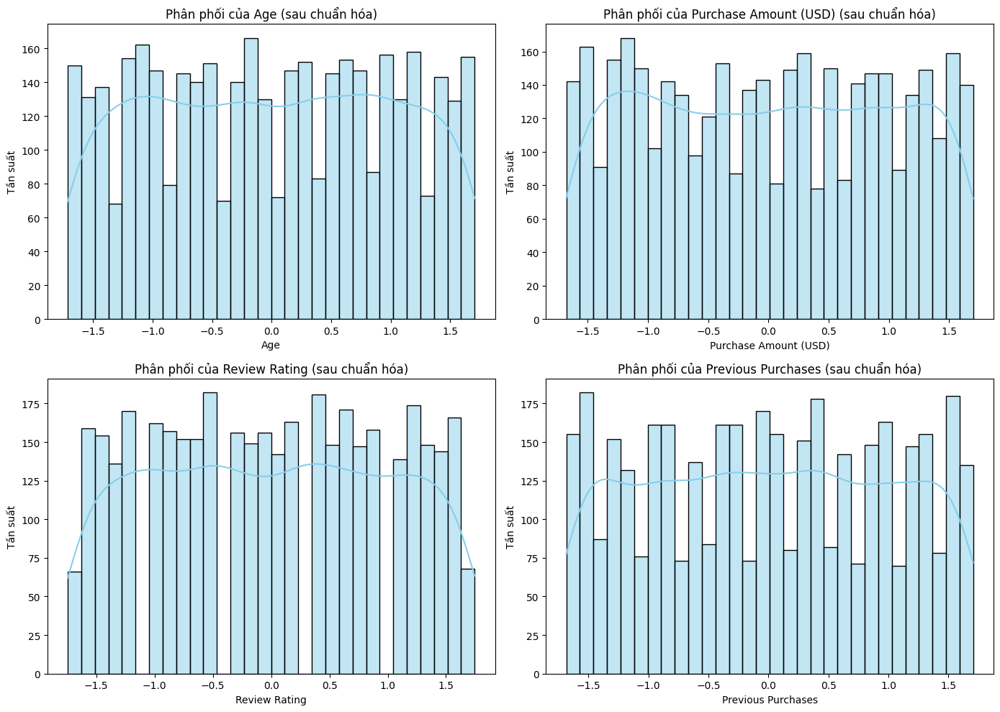

In [50]:
plt.figure(figsize=(14, 10))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(2, 2, i)
    sns.histplot(df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Phân phối của {col} (sau chuẩn hóa)', fontsize=12)
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Tần suất', fontsize=10)
plt.tight_layout()
plt.show()


In [51]:
df.head()

,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded
0,1,0.718913,Blouse,-0.285629,Kentucky,L,Gray,Winter,-0.907584,Yes,Express,Yes,Yes,-0.785831,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,0,1,0,0,16,0,7,1,1,1,5
1,2,-1.648629,Sweater,0.178852,Maine,L,Maroon,Winter,-0.907584,Yes,Express,Yes,Yes,-1.616552,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,0,1,0,0,18,0,12,1,1,1,1
2,3,0.390088,Jeans,0.558882,Massachusetts,S,Maroon,Spring,-0.907584,Yes,Free Shipping,Yes,Yes,-0.162789,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,0,1,0,0,20,2,12,1,2,1,2
3,4,-1.517099,Sandals,1.276716,Rhode Island,M,Maroon,Spring,-0.349027,Yes,Next Day Air,Yes,Yes,1.637107,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,0,0,1,0,38,1,12,1,3,1,4
4,5,0.061263,Blouse,-0.454531,Oregon,M,Turquoise,Spring,-1.466141,Yes,Free Shipping,Yes,Yes,0.391025,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,0,1,0,0,36,1,21,1,2,1,4


### 4. Xử lý đặc trưng `Season`

- Mục tiêu: Mã hóa Season theo cách giữ được tính chu kỳ (Winter → Spring → Summer → Fall → Winter), hỗ trợ Context-Aware Recommendation.

- Phương pháp: Sử dụng mã hóa tuần hoàn (cyclical encoding) với sin và cos để biểu diễn chu kỳ mùa.

In [52]:
season_map = {'Winter': 0, 'Spring': 1, 'Summer': 2, 'Fall': 3}
df['Season_cycle'] = df['Season'].map(season_map)
df['Season_sin'] = np.sin(2 * np.pi * df['Season_cycle'] / 4)
df['Season_cos'] = np.cos(2 * np.pi * df['Season_cycle'] / 4)


In [53]:
df['Season_cycle'].value_counts()

,count
Season_cycle,
1,999
3,975
0,971
2,955


In [54]:
df['Season_sin'].value_counts()

,count
Season_sin,
1.000000e+00,999
-1.000000e+00,975
0.000000e+00,971
1.224647e-16,955


In [55]:
df['Season_cos'].value_counts()

,count
Season_cos,
6.123234e-17,999
-1.836970e-16,975
1.000000e+00,971
-1.000000e+00,955


#### Vẽ scatter plot để kiểm tra tính chu kỳ

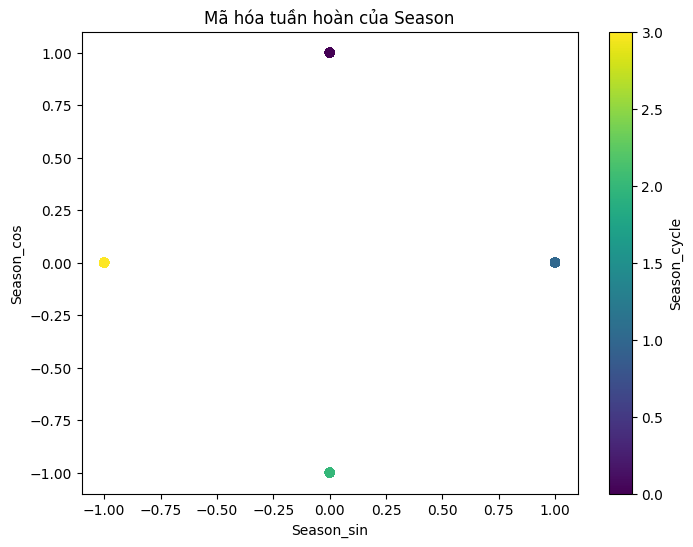

In [56]:
plt.figure(figsize=(8, 6))
plt.scatter(df['Season_sin'], df['Season_cos'], c=df['Season_cycle'], cmap='viridis')
plt.title('Mã hóa tuần hoàn của Season', fontsize=12)
plt.xlabel('Season_sin', fontsize=10)
plt.ylabel('Season_cos', fontsize=10)
plt.colorbar(label='Season_cycle')
plt.show()


In [57]:
df.head()


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos
0,1,0.718913,Blouse,-0.285629,Kentucky,L,Gray,Winter,-0.907584,Yes,Express,Yes,Yes,-0.785831,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,0,1,0,0,16,0,7,1,1,1,5,0,0.0,1.000000e+00
1,2,-1.648629,Sweater,0.178852,Maine,L,Maroon,Winter,-0.907584,Yes,Express,Yes,Yes,-1.616552,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,0,1,0,0,18,0,12,1,1,1,1,0,0.0,1.000000e+00
2,3,0.390088,Jeans,0.558882,Massachusetts,S,Maroon,Spring,-0.907584,Yes,Free Shipping,Yes,Yes,-0.162789,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,0,1,0,0,20,2,12,1,2,1,2,1,1.0,6.123234e-17
3,4,-1.517099,Sandals,1.276716,Rhode Island,M,Maroon,Spring,-0.349027,Yes,Next Day Air,Yes,Yes,1.637107,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,0,0,1,0,38,1,12,1,3,1,4,1,1.0,6.123234e-17
4,5,0.061263,Blouse,-0.454531,Oregon,M,Turquoise,Spring,-1.466141,Yes,Free Shipping,Yes,Yes,0.391025,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,0,1,0,0,36,1,21,1,2,1,4,1,1.0,6.123234e-17


### 5. Tạo đặc trưng `Customer_Loyalty_Score`

Mục tiêu: Tạo một điểm số tổng hợp thể hiện mức độ trung thành của khách hàng, kết hợp số lần mua trước, tần suất mua và trạng thái đăng ký.

**Lưu ý về trọng số:** Các trọng số (0.4, 0.4, 0.2) được chọn dựa trên phán đoán heuristic. Trong thực tế, các trọng số này có thể được tối ưu hóa bằng các kỹ thuật như phân tích thành phần chính (PCA) hoặc dựa trên kết quả đánh giá mô hình (ví dụ: grid search nếu điểm số này được dùng trực tiếp trong mô hình).

In [58]:
df['Frequency of Purchases'].unique()


array(['Fortnightly', 'Weekly', 'Annually', 'Quarterly', 'Bi-Weekly',
       'Monthly', 'Every 3 Months'], dtype=object)

- Gán điểm số dựa trên tần suất (cao hơn = thường xuyên hơn)

In [59]:
frequency_ranking = {
    'Annually': 1,
    'Quarterly': 2,
    'Every 3 Months': 2,
    'Monthly': 3,
    'Fortnightly': 4,
    'Weekly': 5,
    'Bi-Weekly': 6
}


In [60]:
df['Frequency_score'] = df['Frequency of Purchases'].map(frequency_ranking)


In [61]:
df['Frequency_score']

,Frequency_score
0,4
1,4
2,5
3,5
4,1
...,...
3895,5
3896,6
3897,2
3898,5


In [62]:
df['Frequency_score'].value_counts()

,count
Frequency_score,
2,1147
1,572
3,553
6,547
4,542
5,539


In [63]:
# Chuẩn hóa điểm tần suất để có thể kết hợp với các biến đã chuẩn hóa khác
scaler_freq = StandardScaler()
df['Frequency_score'] = scaler_freq.fit_transform(df[['Frequency_score']])


In [64]:
df['Frequency_score']

,Frequency_score
0,0.451156
1,0.451156
2,1.051672
3,1.051672
4,-1.350390
...,...
3895,1.051672
3896,1.652187
3897,-0.749874
3898,1.051672


In [65]:
# Tính điểm trung thành - sử dụng các biến đã được chuẩn hóa/mã hóa
# Previous Purchases đã được chuẩn hóa (mean 0, std 1)
# Frequency_score_scaled đã được chuẩn hóa (mean 0, std 1)
# Subscription Status_encoded là 0 (No) hoặc 1 (Yes)
# Lưu ý: Trọng số 0.4, 0.4, 0.2 là heuristic, có thể cần tối ưu hóa.
df['Customer_Loyalty_Score'] = (df['Previous Purchases'] * 0.4 +
                               df['Frequency_score'] * 0.4 +
                               df['Subscription Status_encoded']* 0.2)


In [66]:
df['Customer_Loyalty_Score']

,Customer_Loyalty_Score
0,0.066130
1,-0.266158
2,0.555553
3,1.275512
4,-0.183746
...,...
3895,0.604769
3896,1.094192
3897,-0.337375
3898,0.383244


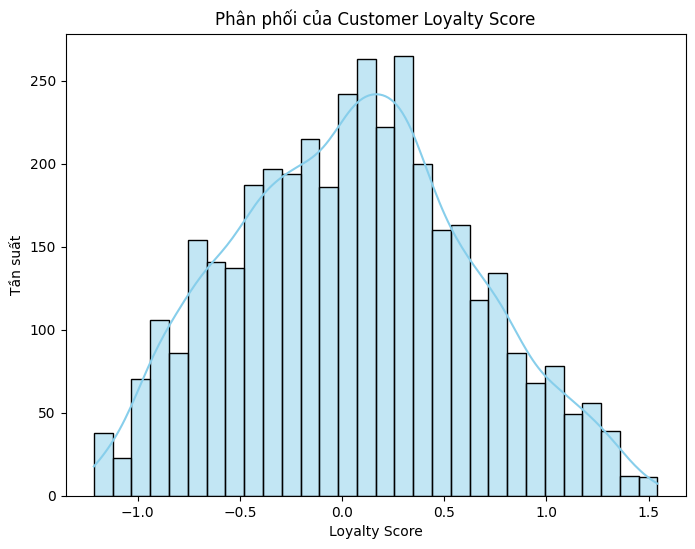

In [67]:
plt.figure(figsize=(8, 6))
sns.histplot(df['Customer_Loyalty_Score'], kde=True, bins=30, color='skyblue')
plt.title('Phân phối của Customer Loyalty Score', fontsize=12)
plt.xlabel('Loyalty Score', fontsize=10)
plt.ylabel('Tần suất', fontsize=10)
plt.show()


In [68]:
df.head()


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos,Frequency_score,Customer_Loyalty_Score
0,1,0.718913,Blouse,-0.285629,Kentucky,L,Gray,Winter,-0.907584,Yes,Express,Yes,Yes,-0.785831,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,0,1,0,0,16,0,7,1,1,1,5,0,0.0,1.000000e+00,0.451156,0.066130
1,2,-1.648629,Sweater,0.178852,Maine,L,Maroon,Winter,-0.907584,Yes,Express,Yes,Yes,-1.616552,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,0,1,0,0,18,0,12,1,1,1,1,0,0.0,1.000000e+00,0.451156,-0.266158
2,3,0.390088,Jeans,0.558882,Massachusetts,S,Maroon,Spring,-0.907584,Yes,Free Shipping,Yes,Yes,-0.162789,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,0,1,0,0,20,2,12,1,2,1,2,1,1.0,6.123234e-17,1.051672,0.555553
3,4,-1.517099,Sandals,1.276716,Rhode Island,M,Maroon,Spring,-0.349027,Yes,Next Day Air,Yes,Yes,1.637107,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,0,0,1,0,38,1,12,1,3,1,4,1,1.0,6.123234e-17,1.051672,1.275512
4,5,0.061263,Blouse,-0.454531,Oregon,M,Turquoise,Spring,-1.466141,Yes,Free Shipping,Yes,Yes,0.391025,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,0,1,0,0,36,1,21,1,2,1,4,1,1.0,6.123234e-17,-1.350390,-0.183746


### 6. Tạo đặc trưng `Dominant_Season` cho sản phẩm

**Mục tiêu**: Xác định mùa phổ biến nhất cho mỗi loại mặt hàng (`Item Purchased`), giúp hiểu rõ hơn về tính thời vụ của sản phẩm.

- **Vấn đề:**

  - Mùa ảnh hưởng mạnh đến lựa chọn sản phẩm (ví dụ: áo khoác vào Winter), giúp gợi ý chính xác hơn.

- **Ý nghĩa:**
  - Đặc trưng này có thể hữu ích cho việc gợi ý sản phẩm theo ngữ cảnh mùa hiện tại.
  - Ví dụ: Nếu đang là mùa đông, hệ thống có thể ưu tiên gợi ý các sản phẩm có `Dominant_Season` là 'Winter'.

In [69]:
# Tính số lần xuất hiện của mỗi Item trong từng Season
product_season = df.groupby(['Item Purchased', 'Season']).size().unstack(fill_value=0)
product_season



Season,Fall,Spring,Summer,Winter
Item Purchased,,,,
Backpack,34,39,45,25
Belt,41,41,39,40
Blouse,42,46,43,40
Boots,35,40,38,31
Coat,34,46,42,39
Dress,36,43,47,40
Gloves,37,42,29,32
Handbag,48,36,35,34
Hat,50,27,37,40


In [70]:
# Xác định mùa có số lần xuất hiện cao nhất cho mỗi Item
product_season['Dominant_Season'] = product_season.idxmax(axis=1)
product_season['Dominant_Season']

,Dominant_Season
Item Purchased,
Backpack,Summer
Belt,Fall
Blouse,Spring
Boots,Spring
Coat,Spring
Dress,Summer
Gloves,Spring
Handbag,Fall
Hat,Fall


In [71]:
product_season['Dominant_Season'].value_counts()

,count
Dominant_Season,
Fall,8
Spring,7
Summer,5
Winter,5


In [72]:
# Gộp đặc trưng Dominant_Season vào DataFrame chính
df = df.merge(product_season['Dominant_Season'], left_on='Item Purchased', right_index=True, how='left')


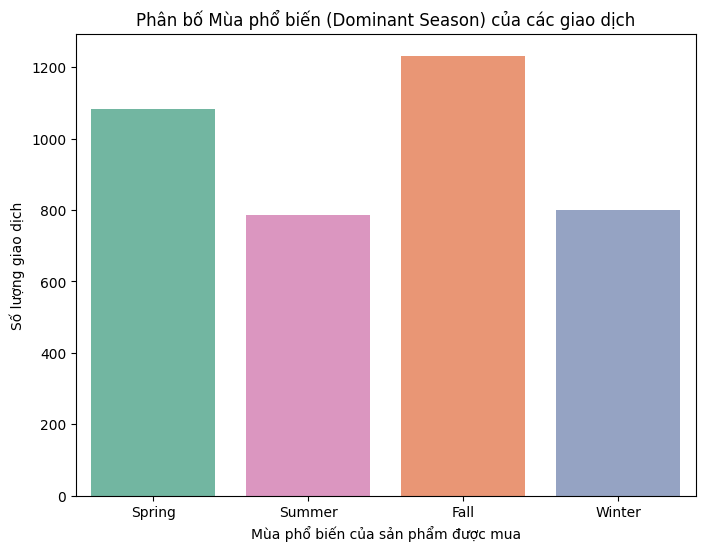

In [73]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Dominant_Season', hue='Dominant_Season',
              palette='Set2', order=['Spring', 'Summer', 'Fall', 'Winter'], legend=False)
plt.title('Phân bố Mùa phổ biến (Dominant Season) của các giao dịch', fontsize=12)
plt.xlabel('Mùa phổ biến của sản phẩm được mua', fontsize=10)
plt.ylabel('Số lượng giao dịch', fontsize=10)
plt.show()



In [74]:
print("Số lượng giao dịch theo Mùa phổ biến của sản phẩm:")
print(df['Dominant_Season'].value_counts())

Số lượng giao dịch theo Mùa phổ biến của sản phẩm:
Dominant_Season
Fall      1232
Spring    1082
Winter     799
Summer     787
Name: count, dtype: int64


In [75]:
df.head()


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos,Frequency_score,Customer_Loyalty_Score,Dominant_Season
0,1,0.718913,Blouse,-0.285629,Kentucky,L,Gray,Winter,-0.907584,Yes,Express,Yes,Yes,-0.785831,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,0,1,0,0,16,0,7,1,1,1,5,0,0.0,1.000000e+00,0.451156,0.066130,Spring
1,2,-1.648629,Sweater,0.178852,Maine,L,Maroon,Winter,-0.907584,Yes,Express,Yes,Yes,-1.616552,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,0,1,0,0,18,0,12,1,1,1,1,0,0.0,1.000000e+00,0.451156,-0.266158,Spring
2,3,0.390088,Jeans,0.558882,Massachusetts,S,Maroon,Spring,-0.907584,Yes,Free Shipping,Yes,Yes,-0.162789,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,0,1,0,0,20,2,12,1,2,1,2,1,1.0,6.123234e-17,1.051672,0.555553,Fall
3,4,-1.517099,Sandals,1.276716,Rhode Island,M,Maroon,Spring,-0.349027,Yes,Next Day Air,Yes,Yes,1.637107,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,0,0,1,0,38,1,12,1,3,1,4,1,1.0,6.123234e-17,1.051672,1.275512,Fall
4,5,0.061263,Blouse,-0.454531,Oregon,M,Turquoise,Spring,-1.466141,Yes,Free Shipping,Yes,Yes,0.391025,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,0,1,0,0,36,1,21,1,2,1,4,1,1.0,6.123234e-17,-1.350390,-0.183746,Spring


### 7. Tạo ma trận User-Item và `Interaction_Score`

**Mục tiêu**:
Tạo ma trận biểu diễn sự tương tác giữa người dùng và sản phẩm, cần thiết cho các thuật toán lọc cộng tác.

Tạo `Interaction_Score`: Kết hợp `Review Rating` và `Purchase Amount (USD)` (đã chuẩn hóa) để thể hiện mức độ tương tác/quan tâm của người dùng đối với sản phẩm.

**Lưu ý về trọng số:** Trọng số 0.7 cho `Review Rating` và 0.3 cho `Purchase Amount` là heuristic, ưu tiên đánh giá của người dùng. Có thể điều chỉnh hoặc sử dụng các phương pháp khác để xác định điểm tương tác (ví dụ: chỉ dùng rating, hoặc dùng mô hình phức tạp hơn).

- Tính Interaction_Score sử dụng các cột đã chuẩn hóa

In [76]:
# Lưu ý: Trọng số 0.7 và 0.3 là heuristic, có thể cần tối ưu hóa.
df['Interaction_Score'] = (df['Review Rating'] * 0.7 + df['Purchase Amount (USD)'] * 0.3)


In [77]:
df['Interaction_Score']

,Interaction_Score
0,-0.720997
1,-0.581653
2,-0.467644
3,0.138696
4,-1.162658
...,...
3895,0.037534
3896,0.596797
3897,-1.169845
3898,0.267259


#### Tạo ma trận User-Item

In [78]:
# Sử dụng Product_ID để định danh sản phẩm duy nhất
user_item_matrix = df.pivot_table(index='Customer ID',
                                columns='Product_ID',
                                values='Interaction_Score',
                                aggfunc='mean').fillna(0) # fillna(0) cho các sản phẩm chưa tương tác


In [79]:
user_item_matrix.head(10)

Product_ID   Backpack_Accessories_L_Beige  Backpack_Accessories_L_Black  \
Customer ID                                                               
1                                     0.0                           0.0   
2                                     0.0                           0.0   
3                                     0.0                           0.0   
4                                     0.0                           0.0   
5                                     0.0                           0.0   
6                                     0.0                           0.0   
7                                     0.0                           0.0   
8                                     0.0                           0.0   
9                                     0.0                           0.0   
10                                    0.0                           0.0   

Product_ID   Backpack_Accessories_L_Blue  Backpack_Accessories_L_Brown  \
Customer ID                                                              
1                                    0.0                           0.0   
2                                    0.0                           0.0   
3                                    0.0                           0.0   
4                                    0.0                           0.0   
5                                    0.0                           0.0   
6                                    0.0                           0.0   
7                                    0.0                           0.0   
8                                    0.0                           0.0   
9                                    0.0                           0.0   
10                                   0.0                           0.0   

Product_ID   Backpack_Accessories_L_Cyan  Backpack_Accessories_L_Gold  \
Customer ID                                                             
1                                    0.0                          0.0   
2                                    0.0                          0.0   
3                                    0.0                          0.0   
4                                    0.0                          0.0   
5                                    0.0                          0.0   
6                                    0.0                          0.0   
7                                    0.0                          0.0   
8                                    0.0                          0.0   
9                                    0.0                          0.0   
10                                   0.0                          0.0   

Product_ID   Backpack_Accessories_L_Green  Backpack_Accessories_L_Indigo  \
Customer ID                                                                
1                                     0.0                            0.0   
2                                     0.0                            0.0   
3                                     0.0                            0.0   
4                                     0.0                            0.0   
5                                     0.0                            0.0   
6                                     0.0                            0.0   
7                                     0.0                            0.0   
8                                     0.0                            0.0   
9                                     0.0                            0.0   
10                                    0.0                            0.0   

Product_ID   Backpack_Accessories_L_Lavender  Backpack_Accessories_L_Magenta  \
Customer ID                                                                    
1                                        0.0                             0.0   
2                                        0.0                             0.0   
3                                        0.0                             0.0   
4                   

Kích thước ma trận User-Item: (3900, 1823)


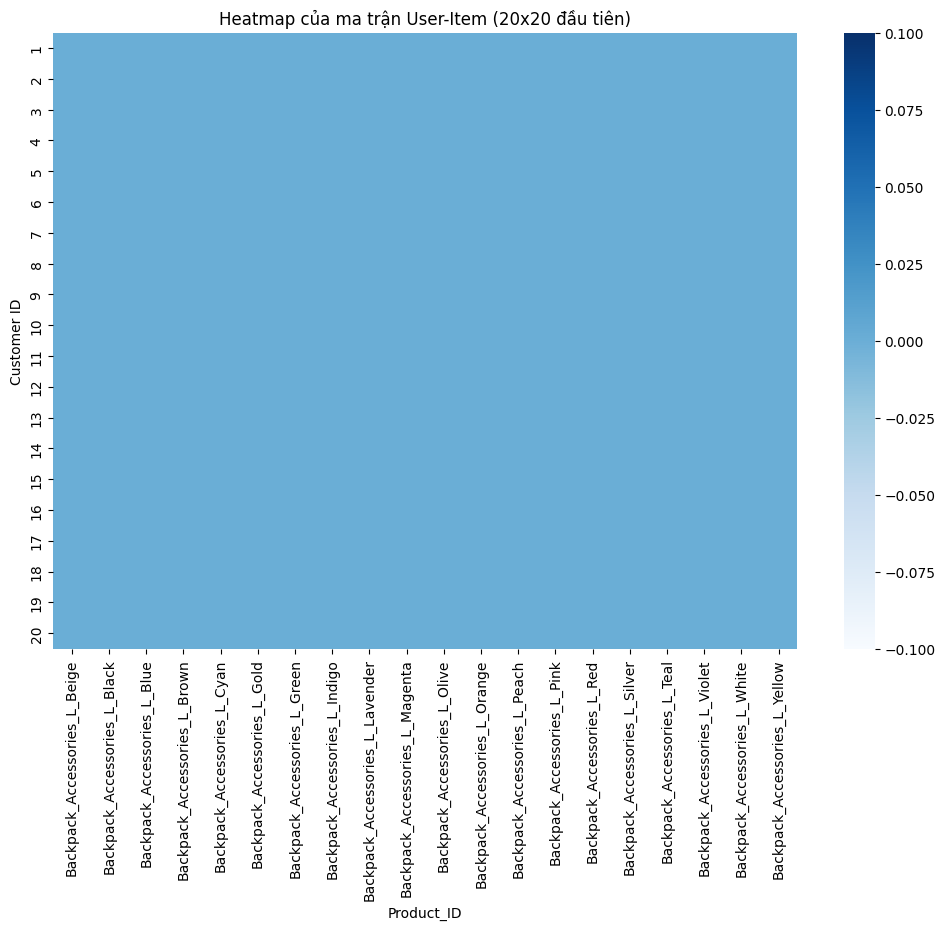

In [80]:
print(f"Kích thước ma trận User-Item: {user_item_matrix.shape}")
plt.figure(figsize=(12, 8))
# Hiển thị một phần nhỏ của heatmap do ma trận lớn
sns.heatmap(user_item_matrix.iloc[:20, :20], cmap='Blues', cbar=True)
plt.title('Heatmap của ma trận User-Item (20x20 đầu tiên)')
plt.xlabel('Product_ID')
plt.ylabel('Customer ID')
plt.show()


In [81]:
df.head()


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos,Frequency_score,Customer_Loyalty_Score,Dominant_Season,Interaction_Score
0,1,0.718913,Blouse,-0.285629,Kentucky,L,Gray,Winter,-0.907584,Yes,Express,Yes,Yes,-0.785831,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,0,1,0,0,16,0,7,1,1,1,5,0,0.0,1.000000e+00,0.451156,0.066130,Spring,-0.720997
1,2,-1.648629,Sweater,0.178852,Maine,L,Maroon,Winter,-0.907584,Yes,Express,Yes,Yes,-1.616552,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,0,1,0,0,18,0,12,1,1,1,1,0,0.0,1.000000e+00,0.451156,-0.266158,Spring,-0.581653
2,3,0.390088,Jeans,0.558882,Massachusetts,S,Maroon,Spring,-0.907584,Yes,Free Shipping,Yes,Yes,-0.162789,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,0,1,0,0,20,2,12,1,2,1,2,1,1.0,6.123234e-17,1.051672,0.555553,Fall,-0.467644
3,4,-1.517099,Sandals,1.276716,Rhode Island,M,Maroon,Spring,-0.349027,Yes,Next Day Air,Yes,Yes,1.637107,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,0,0,1,0,38,1,12,1,3,1,4,1,1.0,6.123234e-17,1.051672,1.275512,Fall,0.138696
4,5,0.061263,Blouse,-0.454531,Oregon,M,Turquoise,Spring,-1.466141,Yes,Free Shipping,Yes,Yes,0.391025,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,0,1,0,0,36,1,21,1,2,1,4,1,1.0,6.123234e-17,-1.350390,-0.183746,Spring,-1.162658


### 8. Đánh giá tầm quan trọng của đặc trưng (Feature Importance - Ví dụ)

Mục tiêu: Xác định các đặc trưng có ảnh hưởng lớn nhất đến một biến mục tiêu (ví dụ: dự đoán `Subscription Status`). Điều này giúp lựa chọn đặc trưng hiệu quả và hiểu rõ hơn về dữ liệu.

Phương pháp: Sử dụng `feature_importances_` từ mô hình RandomForestClassifier.

**Lưu ý:** Đây chỉ là ví dụ minh họa cách đánh giá. Việc lựa chọn biến mục tiêu và giải thích kết quả phụ thuộc vào bài toán cụ thể. Trong bài toán đề xuất, tầm quan trọng có thể không phải là yếu tố duy nhất để chọn đặc trưng.

In [82]:
from sklearn.ensemble import RandomForestClassifier # For Feature Importance
from sklearn.model_selection import train_test_split # For demonstrating split importance


- Chuẩn bị dữ liệu cho ví dụ Feature Importance
- Chọn các cột số và cột đã mã hóa (loại bỏ ID, các cột gốc chưa mã hóa, và các cột tạo ra sau)

In [83]:
cols_to_drop_for_fi = ['Customer ID', 'Item Purchased', 'Category', 'Location', 'Size', 'Color', 'Season',
                       'Subscription Status', 'Payment Method', 'Shipping Type', 'Discount Applied',
                       'Promo Code Used', 'Frequency of Purchases', 'Product_ID', 'Season_cycle',
                       'Frequency_score_raw', 'Dominant_Season', 'Interaction_Score']


- Kiểm tra xem cột có tồn tại trước khi drop không

In [84]:
cols_to_drop_for_fi_existing = [col for col in cols_to_drop_for_fi if col in df.columns]
df_for_fi = df.drop(columns=cols_to_drop_for_fi_existing)


- Chọn biến mục tiêu (ví dụ: Subscription Status_encoded)

In [85]:
target_col = 'Subscription Status_encoded'
X = df_for_fi.drop(columns=[target_col])
y = df_for_fi[target_col]


- Xử lý tên cột có thể chứa ký tự không hợp lệ cho một số hiên bản sklearn/lightgbm

In [86]:
X.columns = X.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)


- Huấn luyện mô hình RandomForest (trên toàn bộ dữ liệu chỉ để minh họa)
- Trong thực tế, nên huấn luyện trên tập train sau khi đã split

<ipython-input-87-60685bc02541>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(15), palette='viridis')


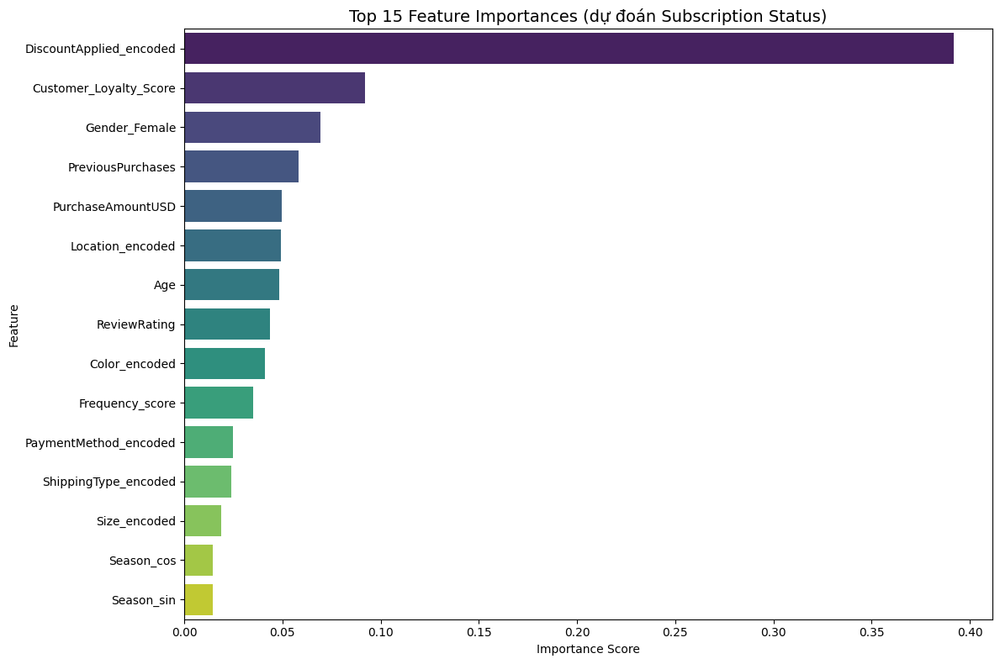

Top 15 Features:
                    Feature  Importance
13  DiscountApplied_encoded    0.391967
18   Customer_Loyalty_Score    0.092006
4             Gender_Female    0.069427
3         PreviousPurchases    0.058304
1         PurchaseAmountUSD    0.049515
9          Location_encoded    0.049369
0                       Age    0.048190
2              ReviewRating    0.043763
11            Color_encoded    0.040992
17          Frequency_score    0.035137
14    PaymentMethod_encoded    0.024897
12     ShippingType_encoded    0.024020
10             Size_encoded    0.018812
16               Season_cos    0.014678
15               Season_sin    0.014523


In [87]:
try:
    rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    rf.fit(X, y)

    # Lấy feature importances
    importances = rf.feature_importances_
    feature_names = X.columns
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

    # Vẽ biểu đồ
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(15), palette='viridis')
    plt.title('Top 15 Feature Importances (dự đoán Subscription Status)', fontsize=14)
    plt.xlabel('Importance Score')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

    print("Top 15 Features:")
    print(feature_importance_df.head(15))
except Exception as e:
    print(f"Lỗi khi tính Feature Importance: {e}")
    print("Có thể do tên cột chứa ký tự đặc biệt hoặc vấn đề khác.")


### 9. Tổng kết và Lưu dữ liệu đã xử lý

**Các bước đã thực hiện:**
1.  Kiểm tra và nhận xét về dữ liệu thiếu/ngoại lai.
2.  Tạo `Product_ID` để định danh sản phẩm duy nhất.
3.  Mã hóa biến phân loại (One-Hot và Label Encoding).
4.  Kiểm tra và loại bỏ đặc trưng dư thừa (multicollinearity).
5.  Chuẩn hóa biến số (`StandardScaler`).
6.  Mã hóa tuần hoàn cho `Season` (`Season_sin`, `Season_cos`).
7.  Tạo đặc trưng dẫn xuất `Customer_Loyalty_Score`.
8.  Tạo đặc trưng `Dominant_Season` cho sản phẩm.
9.  Tạo `Interaction_Score` và ma trận `user_item_matrix`.
10. Minh họa cách đánh giá `Feature Importance`.

**Lưu ý:**
-   Việc chia train/test nên được thực hiện *trước* bước 3 (scaling) và bước 2 (encoding - fit trên train, transform trên cả train/test) để tránh data leakage.
-   Các trọng số trong đặc trưng dẫn xuất (`Customer_Loyalty_Score`, `Interaction_Score`) là heuristic và có thể cần tối ưu hóa.
-   Việc lựa chọn đặc trưng cuối cùng cho mô hình nên dựa trên kết quả validation (ví dụ: cross-validation) và mục tiêu cụ thể của bài toán.
-   Có thể khám phá thêm các tương tác phức tạp giữa các biến (ví dụ: `Age` và `Frequency of Purchases`) nếu cần thiết cho mô hình.

Dữ liệu đã được tiền xử lý và sẵn sàng cho các bước xây dựng mô hình tiếp theo.

In [88]:
# Lưu DataFrame đã xử lý và ma trận User-Item
processed_file_path = '/content/datasets/shopping_behavior_processed.csv'
matrix_file_path = '/content/datasets/user_item_matrix.csv'

try:
    df.to_csv(processed_file_path, index=False)
    user_item_matrix.to_csv(matrix_file_path)
    print(f"Đã lưu DataFrame đã xử lý vào: {processed_file_path}")
    print(f"Đã lưu ma trận User-Item vào: {matrix_file_path}")
except Exception as e:
    print(f"Lỗi khi lưu file: {e}")

df.head()


Đã lưu DataFrame đã xử lý vào: /content/datasets/shopping_behavior_processed.csv
Đã lưu ma trận User-Item vào: /content/datasets/user_item_matrix.csv


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos,Frequency_score,Customer_Loyalty_Score,Dominant_Season,Interaction_Score
0,1,0.718913,Blouse,-0.285629,Kentucky,L,Gray,Winter,-0.907584,Yes,Express,Yes,Yes,-0.785831,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,0,1,0,0,16,0,7,1,1,1,5,0,0.0,1.000000e+00,0.451156,0.066130,Spring,-0.720997
1,2,-1.648629,Sweater,0.178852,Maine,L,Maroon,Winter,-0.907584,Yes,Express,Yes,Yes,-1.616552,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,0,1,0,0,18,0,12,1,1,1,1,0,0.0,1.000000e+00,0.451156,-0.266158,Spring,-0.581653
2,3,0.390088,Jeans,0.558882,Massachusetts,S,Maroon,Spring,-0.907584,Yes,Free Shipping,Yes,Yes,-0.162789,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,0,1,0,0,20,2,12,1,2,1,2,1,1.0,6.123234e-17,1.051672,0.555553,Fall,-0.467644
3,4,-1.517099,Sandals,1.276716,Rhode Island,M,Maroon,Spring,-0.349027,Yes,Next Day Air,Yes,Yes,1.637107,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,0,0,1,0,38,1,12,1,3,1,4,1,1.0,6.123234e-17,1.051672,1.275512,Fall,0.138696
4,5,0.061263,Blouse,-0.454531,Oregon,M,Turquoise,Spring,-1.466141,Yes,Free Shipping,Yes,Yes,0.391025,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,0,1,0,0,36,1,21,1,2,1,4,1,1.0,6.123234e-17,-1.350390,-0.183746,Spring,-1.162658


# Bước 4: Feature engineering

**Mục tiêu:**
- Chọn lọc và tinh chỉnh các đặc trưng đã được tiền xử lý ở Bước 3.
- Loại bỏ các đặc trưng không cần thiết hoặc dư thừa.
- Sử dụng các phương pháp lựa chọn đặc trưng để xác định các đặc trưng quan trọng nhất cho mô hình đề xuất.
- Chuẩn bị tập dữ liệu cuối cùng cho việc xây dựng mô hình.

**Lưu ý:** Đặc trưng `Season` sẽ được giữ nguyên (không mã hóa tuần hoàn thành `Season_sin`, `Season_cos`).

In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import f_regression
from scipy import stats

pd.set_option('display.max_columns', None)
sns.set_style('whitegrid')

### 1. Tải dữ liệu đã tiền xử lý

Chúng ta sẽ tải dữ liệu đã được tiền xử lý từ Bước 3.

In [90]:
processed_file_path = '/content/datasets/shopping_behavior_processed.csv'
matrix_file_path = '/content/datasets/user_item_matrix.csv'

df_processed = pd.read_csv(processed_file_path)


In [91]:
df_processed.head()

,Customer ID,Age,Item Purchased,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Product_ID,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos,Frequency_score,Customer_Loyalty_Score,Dominant_Season,Interaction_Score
0,1,0.718913,Blouse,-0.285629,Kentucky,L,Gray,Winter,-0.907584,Yes,Express,Yes,Yes,-0.785831,Venmo,Fortnightly,Blouse_Clothing_L_Gray,0,0,1,0,0,16,0,7,1,1,1,5,0,0.0,1.000000e+00,0.451156,0.066130,Spring,-0.720997
1,2,-1.648629,Sweater,0.178852,Maine,L,Maroon,Winter,-0.907584,Yes,Express,Yes,Yes,-1.616552,Cash,Fortnightly,Sweater_Clothing_L_Maroon,0,0,1,0,0,18,0,12,1,1,1,1,0,0.0,1.000000e+00,0.451156,-0.266158,Spring,-0.581653
2,3,0.390088,Jeans,0.558882,Massachusetts,S,Maroon,Spring,-0.907584,Yes,Free Shipping,Yes,Yes,-0.162789,Credit Card,Weekly,Jeans_Clothing_S_Maroon,0,0,1,0,0,20,2,12,1,2,1,2,1,1.0,6.123234e-17,1.051672,0.555553,Fall,-0.467644
3,4,-1.517099,Sandals,1.276716,Rhode Island,M,Maroon,Spring,-0.349027,Yes,Next Day Air,Yes,Yes,1.637107,PayPal,Weekly,Sandals_Footwear_M_Maroon,0,0,0,1,0,38,1,12,1,3,1,4,1,1.0,6.123234e-17,1.051672,1.275512,Fall,0.138696
4,5,0.061263,Blouse,-0.454531,Oregon,M,Turquoise,Spring,-1.466141,Yes,Free Shipping,Yes,Yes,0.391025,PayPal,Annually,Blouse_Clothing_M_Turquoise,0,0,1,0,0,36,1,21,1,2,1,4,1,1.0,6.123234e-17,-1.350390,-0.183746,Spring,-1.162658


In [92]:
df_processed.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Customer ID                  3900 non-null   int64  
 1   Age                          3900 non-null   float64
 2   Item Purchased               3900 non-null   object 
 3   Purchase Amount (USD)        3900 non-null   float64
 4   Location                     3900 non-null   object 
 5   Size                         3900 non-null   object 
 6   Color                        3900 non-null   object 
 7   Season                       3900 non-null   object 
 8   Review Rating                3900 non-null   float64
 9   Subscription Status          3900 non-null   object 
 10  Shipping Type                3900 non-null   object 
 11  Discount Applied             3900 non-null   object 
 12  Promo Code Used              3900 non-null   object 
 13  Previous Purchases

In [93]:
user_item_matrix = pd.read_csv(matrix_file_path, index_col=0)
user_item_matrix.head(10)

Backpack_Accessories_L_Beige  Backpack_Accessories_L_Black  \
Customer ID                                                               
1                                     0.0                           0.0   
2                                     0.0                           0.0   
3                                     0.0                           0.0   
4                                     0.0                           0.0   
5                                     0.0                           0.0   
6                                     0.0                           0.0   
7                                     0.0                           0.0   
8                                     0.0                           0.0   
9                                     0.0                           0.0   
10                                    0.0                           0.0   

             Backpack_Accessories_L_Blue  Backpack_Accessories_L_Brown  \
Customer ID                                                              
1                                    0.0                           0.0   
2                                    0.0                           0.0   
3                                    0.0                           0.0   
4                                    0.0                           0.0   
5                                    0.0                           0.0   
6                                    0.0                           0.0   
7                                    0.0                           0.0   
8                                    0.0                           0.0   
9                                    0.0                           0.0   
10                                   0.0                           0.0   

             Backpack_Accessories_L_Cyan  Backpack_Accessories_L_Gold  \
Customer ID                                                             
1                                    0.0                          0.0   
2                                    0.0                          0.0   
3                                    0.0                          0.0   
4                                    0.0                          0.0   
5                                    0.0                          0.0   
6                                    0.0                          0.0   
7                                    0.0                          0.0   
8                                    0.0                          0.0   
9                                    0.0                          0.0   
10                                   0.0                          0.0   

             Backpack_Accessories_L_Green  Backpack_Accessories_L_Indigo  \
Customer ID                                                                
1                                     0.0                            0.0   
2                                     0.0                            0.0   
3                                     0.0                            0.0   
4                                     0.0                            0.0   
5                                     0.0                            0.0   
6                                     0.0                            0.0   
7                                     0.0                            0.0   
8                                     0.0                            0.0   
9                                     0.0                            0.0   
10                                    0.0                            0.0   

             Backpack_Accessories_L_Lavender  Backpack_Accessories_L_Magenta  \
Customer ID                                                                    
1                                        0.0                             0.0   
2                                        0.0                             0.0   
3                                        0.0                             0.0   
4                                

### 1.2. Tạo đặc trưng `Product_Category`

In [94]:
category_columns = [col for col in df_processed.columns if col.startswith('Category_')]
category_columns

['Category_Accessories',
 'Category_Clothing',
 'Category_Footwear',
 'Category_Outerwear']

In [95]:
categories = ['Accessories', 'Clothing', 'Footwear', 'Outerwear']
def get_category(row):
    for cat in categories:
        if row.get(f'Category_{cat}', 0) == 1:
            return cat
    return "Unknown"  #

df_processed['Category_reconstructed'] = df_processed.apply(get_category, axis=1)
df_processed['Category_reconstructed']

,Category_reconstructed
0,Clothing
1,Clothing
2,Clothing
3,Footwear
4,Clothing
...,...
3895,Clothing
3896,Accessories
3897,Accessories
3898,Footwear


In [96]:
df_processed['Category_reconstructed'].value_counts()

,count
Category_reconstructed,
Clothing,1737
Accessories,1240
Footwear,599
Outerwear,324


In [97]:
df_processed['Product_Category'] = (df_processed['Item Purchased'] + '_' + df_processed['Category_reconstructed'])


In [98]:
df_processed['Product_Category']

,Product_Category
0,Blouse_Clothing
1,Sweater_Clothing
2,Jeans_Clothing
3,Sandals_Footwear
4,Blouse_Clothing
...,...
3895,Hoodie_Clothing
3896,Backpack_Accessories
3897,Belt_Accessories
3898,Shoes_Footwear


In [99]:
df_processed['Product_Category'].value_counts()

,count
Product_Category,
Blouse_Clothing,171
Pants_Clothing,171
Jewelry_Accessories,171
Shirt_Clothing,169
Dress_Clothing,166
Sweater_Clothing,164
Jacket_Outerwear,163
Coat_Outerwear,161
Sunglasses_Accessories,161


In [100]:
print(f"Đã tạo đặc trưng Product_Category. Số lượng danh mục sản phẩm: {df_processed['Product_Category'].nunique()}")
print("Ví dụ một số Product_Category:")
print(df_processed['Product_Category'].value_counts().head(10))

Đã tạo đặc trưng Product_Category. Số lượng danh mục sản phẩm: 25
Ví dụ một số Product_Category:
Product_Category
Blouse_Clothing           171
Pants_Clothing            171
Jewelry_Accessories       171
Shirt_Clothing            169
Dress_Clothing            166
Sweater_Clothing          164
Jacket_Outerwear          163
Coat_Outerwear            161
Sunglasses_Accessories    161
Belt_Accessories          161
Name: count, dtype: int64


### 2. Loại bỏ đặc trưng không cần thiết / dư thừa

Dựa trên phân tích ở Bước 2 và các bước tiền xử lý từ Bước 3, chúng ta sẽ tiếp tục loại bỏ các đặc trưng không cần thiết cho việc dự đoán:
- **Định danh:** `Customer ID` không dùng để huấn luyện mô hình.
- **Đã mã hóa:** Các cột categorical gốc đã được mã hóa (one-hot hoặc label) nên không cần thiết nữa.
- **Trung gian:** Các cột dùng để tính toán trung gian như `Season_cycle`, `Frequency_score_raw` có thể loại bỏ nếu không dùng trực tiếp.
- **Product_ID** chỉ dùng cho ma trận user-item, không phải feature của user/context.

In [101]:
cols_to_drop = [
    'Promo Code Used',
    'Gender', 'Category', 'Location', 'Size', 'Color',
    'Subscription Status', 'Payment Method', 'Shipping Type', 'Discount Applied',
    'Frequency of Purchases',
    'Season_cycle',
    'Frequency_score_raw',
    'Frequency_score_scaled',
    'Product_ID',
    'Season_sin',  # Loại bỏ Season_sin
    'Season_cos'   # Loại bỏ Season_cos
]

cols_to_drop_existing = [col for col in cols_to_drop if col in df_processed.columns]
cols_to_drop_existing

['Promo Code Used',
 'Location',
 'Size',
 'Color',
 'Subscription Status',
 'Payment Method',
 'Shipping Type',
 'Discount Applied',
 'Frequency of Purchases',
 'Season_cycle',
 'Product_ID',
 'Season_sin',
 'Season_cos']

In [102]:
print(f"Đã loại bỏ {len(cols_to_drop_existing)} cột.")

Đã loại bỏ 13 cột.


In [103]:
df_final_features = df_processed.drop(columns=cols_to_drop_existing)
df_final_features

,Customer ID,Age,Item Purchased,Purchase Amount (USD),Season,Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Dominant_Season,Interaction_Score,Category_reconstructed,Product_Category
0,1,0.718913,Blouse,-0.285629,Winter,-0.907584,-0.785831,0,0,1,0,0,16,0,7,1,1,1,5,0.451156,0.066130,Spring,-0.720997,Clothing,Blouse_Clothing
1,2,-1.648629,Sweater,0.178852,Winter,-0.907584,-1.616552,0,0,1,0,0,18,0,12,1,1,1,1,0.451156,-0.266158,Spring,-0.581653,Clothing,Sweater_Clothing
2,3,0.390088,Jeans,0.558882,Spring,-0.907584,-0.162789,0,0,1,0,0,20,2,12,1,2,1,2,1.051672,0.555553,Fall,-0.467644,Clothing,Jeans_Clothing
3,4,-1.517099,Sandals,1.276716,Spring,-0.349027,1.637107,0,0,0,1,0,38,1,12,1,3,1,4,1.051672,1.275512,Fall,0.138696,Footwear,Sandals_Footwear
4,5,0.061263,Blouse,-0.454531,Spring,-1.466141,0.391025,0,0,1,0,0,36,1,21,1,2,1,4,-1.350390,-0.183746,Spring,-1.162658,Clothing,Blouse_Clothing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,3896,-0.267563,Hoodie,-1.341267,Summer,0.628448,0.460252,1,0,1,0,0,45,0,21,0,0,0,5,1.051672,0.604769,Winter,0.037534,Clothing,Hoodie_Clothing
3896,3897,0.521618,Backpack,-0.454531,Spring,1.047366,1.083293,1,1,0,0,0,14,0,23,0,5,0,0,1.652187,1.094192,Summer,0.596797,Accessories,Backpack_Accessories
3897,3898,0.127028,Belt,-1.130139,Spring,-1.186862,-0.093563,1,1,0,0,0,29,0,8,0,4,0,5,-0.749874,-0.337375,Fall,-1.169845,Accessories,Belt_Accessories
3898,3899,-0.004502,Shoes,0.727784,Summer,0.069891,-0.093563,1,0,0,1,0,22,2,3,0,1,0,5,1.051672,0.383244,Summer,0.267259,Footwear,Shoes_Footwear


In [104]:
print(f"Số cột còn lại sau khi loại bỏ: {len(df_final_features.columns)}")

Số cột còn lại sau khi loại bỏ: 25


In [105]:

print("Các cột còn lại:")
print(df_final_features.columns.tolist())



Các cột còn lại:
['Customer ID', 'Age', 'Item Purchased', 'Purchase Amount (USD)', 'Season', 'Review Rating', 'Previous Purchases', 'Gender_Female', 'Category_Accessories', 'Category_Clothing', 'Category_Footwear', 'Category_Outerwear', 'Location_encoded', 'Size_encoded', 'Color_encoded', 'Subscription Status_encoded', 'Shipping Type_encoded', 'Discount Applied_encoded', 'Payment Method_encoded', 'Frequency_score', 'Customer_Loyalty_Score', 'Dominant_Season', 'Interaction_Score', 'Category_reconstructed', 'Product_Category']


In [106]:
df_final_features.head()

,Customer ID,Age,Item Purchased,Purchase Amount (USD),Season,Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Dominant_Season,Interaction_Score,Category_reconstructed,Product_Category
0,1,0.718913,Blouse,-0.285629,Winter,-0.907584,-0.785831,0,0,1,0,0,16,0,7,1,1,1,5,0.451156,0.066130,Spring,-0.720997,Clothing,Blouse_Clothing
1,2,-1.648629,Sweater,0.178852,Winter,-0.907584,-1.616552,0,0,1,0,0,18,0,12,1,1,1,1,0.451156,-0.266158,Spring,-0.581653,Clothing,Sweater_Clothing
2,3,0.390088,Jeans,0.558882,Spring,-0.907584,-0.162789,0,0,1,0,0,20,2,12,1,2,1,2,1.051672,0.555553,Fall,-0.467644,Clothing,Jeans_Clothing
3,4,-1.517099,Sandals,1.276716,Spring,-0.349027,1.637107,0,0,0,1,0,38,1,12,1,3,1,4,1.051672,1.275512,Fall,0.138696,Footwear,Sandals_Footwear
4,5,0.061263,Blouse,-0.454531,Spring,-1.466141,0.391025,0,0,1,0,0,36,1,21,1,2,1,4,-1.350390,-0.183746,Spring,-1.162658,Clothing,Blouse_Clothing


### 2.1. Kiểm tra các đặc trưng có phương sai thấp (Low Variance)

Các đặc trưng có phương sai thấp (gần như hằng số) không cung cấp nhiều thông tin hữu ích cho mô hình và có thể bị loại bỏ.

In [107]:
numeric_features = df_processed.select_dtypes(include=['int32', 'int64', 'float64'])
numeric_features

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos,Frequency_score,Customer_Loyalty_Score,Interaction_Score
0,1,0.718913,-0.285629,-0.907584,-0.785831,0,0,1,0,0,16,0,7,1,1,1,5,0,0.000000e+00,1.000000e+00,0.451156,0.066130,-0.720997
1,2,-1.648629,0.178852,-0.907584,-1.616552,0,0,1,0,0,18,0,12,1,1,1,1,0,0.000000e+00,1.000000e+00,0.451156,-0.266158,-0.581653
2,3,0.390088,0.558882,-0.907584,-0.162789,0,0,1,0,0,20,2,12,1,2,1,2,1,1.000000e+00,6.123234e-17,1.051672,0.555553,-0.467644
3,4,-1.517099,1.276716,-0.349027,1.637107,0,0,0,1,0,38,1,12,1,3,1,4,1,1.000000e+00,6.123234e-17,1.051672,1.275512,0.138696
4,5,0.061263,-0.454531,-1.466141,0.391025,0,0,1,0,0,36,1,21,1,2,1,4,1,1.000000e+00,6.123234e-17,-1.350390,-0.183746,-1.162658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,3896,-0.267563,-1.341267,0.628448,0.460252,1,0,1,0,0,45,0,21,0,0,0,5,2,1.224647e-16,-1.000000e+00,1.051672,0.604769,0.037534
3896,3897,0.521618,-0.454531,1.047366,1.083293,1,1,0,0,0,14,0,23,0,5,0,0,1,1.000000e+00,6.123234e-17,1.652187,1.094192,0.596797
3897,3898,0.127028,-1.130139,-1.186862,-0.093563,1,1,0,0,0,29,0,8,0,4,0,5,1,1.000000e+00,6.123234e-17,-0.749874,-0.337375,-1.169845
3898,3899,-0.004502,0.727784,0.069891,-0.093563,1,0,0,1,0,22,2,3,0,1,0,5,2,1.224647e-16,-1.000000e+00,1.051672,0.383244,0.267259


In [108]:
numeric_features.describe()

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Season_cycle,Season_sin,Season_cos,Frequency_score,Customer_Loyalty_Score,Interaction_Score
count,3900.000000,3.900000e+03,3.900000e+03,3.900000e+03,3.900000e+03,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000,3.900000e+03,3.900000e+03,3.900000e+03,3900.000000,3.900000e+03
mean,1950.500000,-1.926664e-16,-1.220676e-16,4.313359e-16,7.287618e-17,0.320000,0.317949,0.445385,0.153590,0.083077,24.266410,1.120000,12.109487,0.270000,2.514359,0.430000,2.512308,1.495897,6.153846e-03,4.102564e-03,-5.556809e-17,0.054000,2.705528e-16
std,1125.977353,1.000128e+00,1.000128e+00,1.000128e+00,1.000128e+00,0.466536,0.465739,0.497072,0.360601,0.276034,14.343299,0.930496,7.221592,0.444016,1.697591,0.495139,1.690643,1.117252,7.115095e-01,7.028200e-01,1.000128e+00,0.574154,7.701155e-01
min,1.000000,-1.714394e+00,-1.679071e+00,-1.745419e+00,-1.685779e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000e+00,-1.000000e+00,-1.350390e+00,-1.214468,-1.700179e+00
25%,975.750000,-8.594483e-01,-8.767861e-01,-9.075836e-01,-8.550575e-01,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,6.000000,0.000000,1.000000,0.000000,1.000000,1.000000,-2.500000e-01,-1.836970e-16,-7.498744e-01,-0.377581,-5.979143e-01
50%,1950.500000,-4.502378e-03,9.950067e-03,-6.974802e-02,-2.433588e-02,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,1.000000,12.000000,0.000000,3.000000,0.000000,2.000000,1.000000,1.224647e-16,6.123234e-17,-1.493590e-01,0.065470,-1.331570e-02
75%,2925.250000,8.504436e-01,8.966862e-01,9.077268e-01,8.756125e-01,1.000000,1.000000,1.000000,0.000000,0.000000,36.000000,2.000000,18.000000,1.000000,4.000000,1.000000,4.000000,2.250000,1.000000e+00,6.123234e-17,1.051672e+00,0.438625,6.021430e-01
max,3900.000000,1.705390e+00,1.698971e+00,1.745562e+00,1.706334e+00,1.000000,1.000000,1.000000,1.000000,1.000000,49.000000,3.000000,24.000000,1.000000,5.000000,1.000000,5.000000,3.000000,1.000000e+00,1.000000e+00,1.652187e+00,1.543409,1.718917e+00


In [109]:
variances = numeric_features.var()
variances

,0
Customer ID,1.267825e+06
Age,1.000256e+00
Purchase Amount (USD),1.000256e+00
Review Rating,1.000256e+00
Previous Purchases,1.000256e+00
Gender_Female,2.176558e-01
Category_Accessories,2.169129e-01
Category_Clothing,2.470805e-01
Category_Footwear,1.300333e-01
Category_Outerwear,7.619469e-02


In [110]:
variances_df = pd.DataFrame({'Feature': variances.index, 'Variance': variances.values})
variances_df

,Feature,Variance
0,Customer ID,1.267825e+06
1,Age,1.000256e+00
2,Purchase Amount (USD),1.000256e+00
3,Review Rating,1.000256e+00
4,Previous Purchases,1.000256e+00
5,Gender_Female,2.176558e-01
6,Category_Accessories,2.169129e-01
7,Category_Clothing,2.470805e-01
8,Category_Footwear,1.300333e-01
9,Category_Outerwear,7.619469e-02


In [111]:
variances_df = variances_df.sort_values('Variance')

print("10 đặc trưng có phương sai thấp nhất:")
variances_df.head(10)

10 đặc trưng có phương sai thấp nhất:


,Feature,Variance
9,Category_Outerwear,0.076195
8,Category_Footwear,0.130033
13,Subscription Status_encoded,0.197151
6,Category_Accessories,0.216913
5,Gender_Female,0.217656
15,Discount Applied_encoded,0.245163
7,Category_Clothing,0.247081
21,Customer_Loyalty_Score,0.329653
19,Season_cos,0.493956
18,Season_sin,0.506246


In [112]:
# ngưỡng phương sai
low_variance_threshold = 0.01
low_variance_features = variances_df[variances_df['Variance'] < low_variance_threshold]['Feature'].tolist()

print(f"\nCác đặc trưng có phương sai < {low_variance_threshold}:")
print(low_variance_features)




Các đặc trưng có phương sai < 0.01:
[]


In [113]:
if low_variance_features:
    plt.figure(figsize=(15, 5 * min(3, len(low_variance_features))))
    for i, feature in enumerate(low_variance_features[:3]):
        plt.subplot(min(3, len(low_variance_features)), 1, i+1)
        sns.histplot(df_processed[feature], kde=True)
        plt.title(f'Phân phối của {feature} (Variance: {variances[feature]:.6f})')
    plt.tight_layout()
    plt.show()

**Nhận xét:**
- Phân tích phương sai giúp chúng ta xác định các đặc trưng có rất ít sự biến thiên (gần như hằng số).
- Các đặc trưng có phương sai thấp như `Category_*` có thể do chúng là biến one-hot, chỉ nhận giá trị 0 hoặc 1, và sự phân bố không đồng đều giữa các danh mục.
- Nếu có bất kỳ đặc trưng nào có phương sai gần như bằng 0, chúng ta nên cân nhắc loại bỏ vì chúng không cung cấp thông tin phân biệt.
- Tuy nhiên, cần cẩn thận với các biến one-hot vì độ phổ biến thấp của một danh mục không đồng nghĩa với việc nó không quan trọng.

### 3.1.1. Xóa các đặc trưng không cần thiết dựa trên phương sai thấp

In [114]:
extremely_low_var_threshold = 0.001
extremely_low_var_features = variances_df[variances_df['Variance'] < extremely_low_var_threshold]['Feature'].tolist()

print(f"Các đặc trưng có phương sai cực thấp (< {extremely_low_var_threshold}):", extremely_low_var_features)

Các đặc trưng có phương sai cực thấp (< 0.001): []


In [115]:
binary_features = [col for col in df_processed.columns if set(df_processed[col].unique()).issubset({0, 1})]
binary_features


['Gender_Female',
 'Category_Accessories',
 'Category_Clothing',
 'Category_Footwear',
 'Category_Outerwear',
 'Subscription Status_encoded',
 'Discount Applied_encoded']

In [116]:
print("Tỷ lệ giá trị phổ biến nhất trong các đặc trưng binary:")
for col in binary_features:
    value_counts = df_processed[col].value_counts(normalize=True)
    most_common_value = value_counts.index[0]
    most_common_ratio = value_counts.iloc[0]
    print(f"{col}: {most_common_value} ({most_common_ratio:.2%})")


Tỷ lệ giá trị phổ biến nhất trong các đặc trưng binary:
Gender_Female: 0 (68.00%)
Category_Accessories: 0 (68.21%)
Category_Clothing: 0 (55.46%)
Category_Footwear: 0 (84.64%)
Category_Outerwear: 0 (91.69%)
Subscription Status_encoded: 0 (73.00%)
Discount Applied_encoded: 0 (57.00%)


In [117]:
additional_cols_to_drop = []
for feature in extremely_low_var_features:
    if not feature.startswith('Category_') and feature in df_final_features.columns:
        additional_cols_to_drop.append(feature)

print(f"Đặc trưng đề xuất loại bỏ thêm: {additional_cols_to_drop}")

if additional_cols_to_drop:
    df_final_features = df_final_features.drop(columns=additional_cols_to_drop)
    print(f"Đã loại bỏ thêm {len(additional_cols_to_drop)} đặc trưng. Số đặc trưng còn lại: {len(df_final_features.columns)}")
else:
    print("Không có đặc trưng nào được đề xuất loại bỏ thêm.")


Đặc trưng đề xuất loại bỏ thêm: []
Không có đặc trưng nào được đề xuất loại bỏ thêm.


### 3. Lựa chọn đặc trưng (Feature Selection)

#### 3.1. Dựa vào Ma trận tương quan (Correlation Matrix)

Kiểm tra lại ma trận tương quan trên tập đặc trưng cuối cùng để phát hiện đa cộng tuyến (multicollinearity) giữa các đặc trưng số và đặc trưng đã mã hóa.

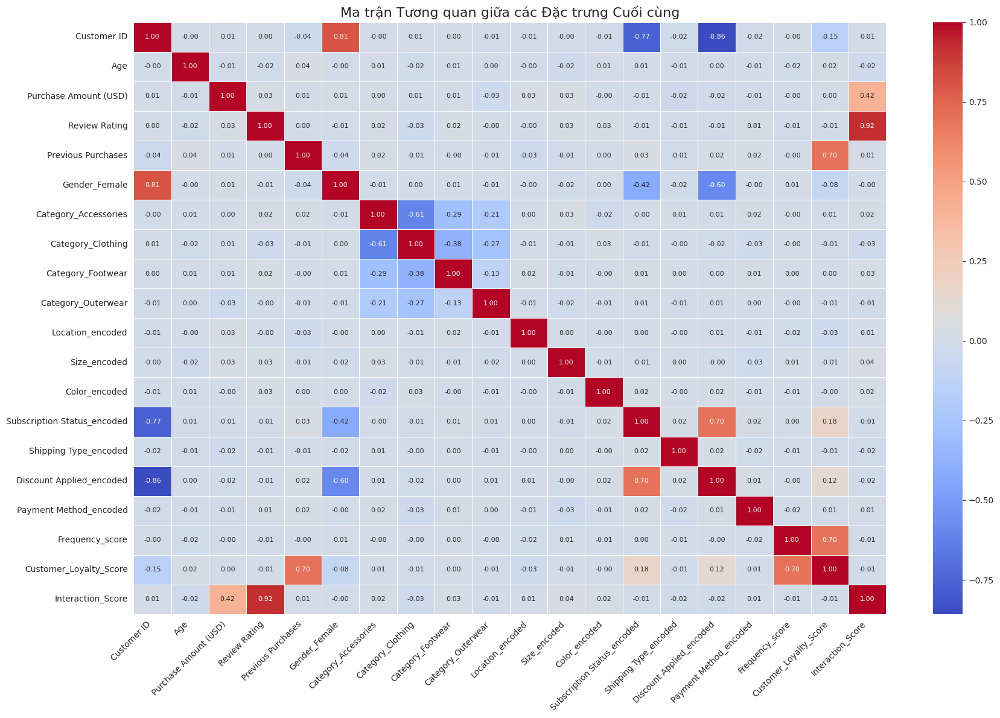

In [118]:
plt.figure(figsize=(18, 12))
correlation_matrix_final = df_final_features.corr(numeric_only=True)
sns.heatmap(correlation_matrix_final, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, annot_kws={"size": 8})
plt.title('Ma trận Tương quan giữa các Đặc trưng Cuối cùng', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


#### Tìm các cặp tương quan cao

In [119]:
correlation_matrix_final

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Interaction_Score
Customer ID,1.000000,-0.004079,0.011048,0.001343,-0.039159,0.807960,-0.003031,0.006718,0.003504,-0.011559,-0.013257,-0.001801,-0.011144,-0.768960,-0.020979,-0.857496,-0.015504,-0.000961,-0.146888,0.005525
Age,-0.004079,1.000000,-0.010424,-0.021949,0.040445,-0.002763,0.006993,-0.016826,0.010476,0.004816,-0.001957,-0.023654,0.006700,0.006492,-0.010743,0.004366,-0.005215,-0.017249,0.017166,-0.024014
Purchase Amount (USD),0.011048,-0.010424,1.000000,0.030776,0.008063,0.014044,0.002144,0.009875,0.008833,-0.032938,0.028803,0.027805,-0.004326,-0.006996,-0.024637,-0.017798,-0.009077,-0.003182,0.002319,0.417579
Review Rating,0.001343,-0.021949,0.030776,1.000000,0.004229,-0.008164,0.017810,-0.033543,0.024211,-0.001276,-0.004222,0.027603,0.027356,-0.006368,-0.009787,-0.012486,0.014404,-0.013277,-0.007289,0.921061
Previous Purchases,-0.039159,0.040445,0.008063,0.004229,1.000000,-0.035873,0.017690,-0.009451,-0.003524,-0.008226,-0.032962,-0.011152,0.000418,0.030859,-0.013931,0.023537,0.021123,-0.002441,0.699839,0.006986
Gender_Female,0.807960,-0.002763,0.014044,-0.008164,-0.035873,1.000000,-0.005666,0.000177,0.011160,-0.005337,-0.000747,-0.018764,0.000560,-0.417197,-0.016490,-0.595823,-0.003369,0.011751,-0.081334,-0.001950
Category_Accessories,-0.003031,0.006993,0.002144,0.017810,0.017690,-0.005666,1.000000,-0.611845,-0.290844,-0.205515,0.000754,0.033260,-0.024460,-0.000992,0.008173,0.010899,0.017178,-0.001128,0.011387,0.017026
Category_Clothing,0.006718,-0.016826,0.009875,-0.033543,-0.009451,0.000177,-0.611845,1.000000,-0.381735,-0.269740,-0.007941,-0.009671,0.026566,-0.013933,-0.003782,-0.016579,-0.028651,-0.001246,-0.009609,-0.026646
Category_Footwear,0.003504,0.010476,0.008833,0.024211,-0.003524,0.011160,-0.290844,-0.381735,1.000000,-0.128223,0.017624,-0.012903,-0.001141,0.014849,0.001215,0.002054,0.014357,0.004278,0.002823,0.025451
Category_Outerwear,-0.011559,0.004816,-0.032938,-0.001276,-0.008226,-0.005337,-0.205515,-0.269740,-0.128223,1.000000,-0.009997,-0.021848,-0.005079,0.007366,-0.008567,0.008782,0.003854,-0.001442,-0.005597,-0.013993


In [120]:
threshold = 0.8
highly_correlated_pairs = []
corr_matrix_abs = correlation_matrix_final.abs()
corr_matrix_abs

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Interaction_Score
Customer ID,1.000000,0.004079,0.011048,0.001343,0.039159,0.807960,0.003031,0.006718,0.003504,0.011559,0.013257,0.001801,0.011144,0.768960,0.020979,0.857496,0.015504,0.000961,0.146888,0.005525
Age,0.004079,1.000000,0.010424,0.021949,0.040445,0.002763,0.006993,0.016826,0.010476,0.004816,0.001957,0.023654,0.006700,0.006492,0.010743,0.004366,0.005215,0.017249,0.017166,0.024014
Purchase Amount (USD),0.011048,0.010424,1.000000,0.030776,0.008063,0.014044,0.002144,0.009875,0.008833,0.032938,0.028803,0.027805,0.004326,0.006996,0.024637,0.017798,0.009077,0.003182,0.002319,0.417579
Review Rating,0.001343,0.021949,0.030776,1.000000,0.004229,0.008164,0.017810,0.033543,0.024211,0.001276,0.004222,0.027603,0.027356,0.006368,0.009787,0.012486,0.014404,0.013277,0.007289,0.921061
Previous Purchases,0.039159,0.040445,0.008063,0.004229,1.000000,0.035873,0.017690,0.009451,0.003524,0.008226,0.032962,0.011152,0.000418,0.030859,0.013931,0.023537,0.021123,0.002441,0.699839,0.006986
Gender_Female,0.807960,0.002763,0.014044,0.008164,0.035873,1.000000,0.005666,0.000177,0.011160,0.005337,0.000747,0.018764,0.000560,0.417197,0.016490,0.595823,0.003369,0.011751,0.081334,0.001950
Category_Accessories,0.003031,0.006993,0.002144,0.017810,0.017690,0.005666,1.000000,0.611845,0.290844,0.205515,0.000754,0.033260,0.024460,0.000992,0.008173,0.010899,0.017178,0.001128,0.011387,0.017026
Category_Clothing,0.006718,0.016826,0.009875,0.033543,0.009451,0.000177,0.611845,1.000000,0.381735,0.269740,0.007941,0.009671,0.026566,0.013933,0.003782,0.016579,0.028651,0.001246,0.009609,0.026646
Category_Footwear,0.003504,0.010476,0.008833,0.024211,0.003524,0.011160,0.290844,0.381735,1.000000,0.128223,0.017624,0.012903,0.001141,0.014849,0.001215,0.002054,0.014357,0.004278,0.002823,0.025451
Category_Outerwear,0.011559,0.004816,0.032938,0.001276,0.008226,0.005337,0.205515,0.269740,0.128223,1.000000,0.009997,0.021848,0.005079,0.007366,0.008567,0.008782,0.003854,0.001442,0.005597,0.013993


In [121]:
upper_tri = corr_matrix_abs.where(np.triu(np.ones(corr_matrix_abs.shape), k=1).astype(bool))
upper_tri

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Interaction_Score
Customer ID,NaN,0.004079,0.011048,0.001343,0.039159,0.807960,0.003031,0.006718,0.003504,0.011559,0.013257,0.001801,0.011144,0.768960,0.020979,0.857496,0.015504,0.000961,0.146888,0.005525
Age,NaN,NaN,0.010424,0.021949,0.040445,0.002763,0.006993,0.016826,0.010476,0.004816,0.001957,0.023654,0.006700,0.006492,0.010743,0.004366,0.005215,0.017249,0.017166,0.024014
Purchase Amount (USD),NaN,NaN,NaN,0.030776,0.008063,0.014044,0.002144,0.009875,0.008833,0.032938,0.028803,0.027805,0.004326,0.006996,0.024637,0.017798,0.009077,0.003182,0.002319,0.417579
Review Rating,NaN,NaN,NaN,NaN,0.004229,0.008164,0.017810,0.033543,0.024211,0.001276,0.004222,0.027603,0.027356,0.006368,0.009787,0.012486,0.014404,0.013277,0.007289,0.921061
Previous Purchases,NaN,NaN,NaN,NaN,NaN,0.035873,0.017690,0.009451,0.003524,0.008226,0.032962,0.011152,0.000418,0.030859,0.013931,0.023537,0.021123,0.002441,0.699839,0.006986
Gender_Female,NaN,NaN,NaN,NaN,NaN,NaN,0.005666,0.000177,0.011160,0.005337,0.000747,0.018764,0.000560,0.417197,0.016490,0.595823,0.003369,0.011751,0.081334,0.001950
Category_Accessories,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.611845,0.290844,0.205515,0.000754,0.033260,0.024460,0.000992,0.008173,0.010899,0.017178,0.001128,0.011387,0.017026
Category_Clothing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.381735,0.269740,0.007941,0.009671,0.026566,0.013933,0.003782,0.016579,0.028651,0.001246,0.009609,0.026646
Category_Footwear,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.128223,0.017624,0.012903,0.001141,0.014849,0.001215,0.002054,0.014357,0.004278,0.002823,0.025451
Category_Outerwear,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.009997,0.021848,0.005079,0.007366,0.008567,0.008782,0.003854,0.001442,0.005597,0.013993


In [122]:
highly_correlated_pairs = [(column, index) for column in upper_tri.columns for index in upper_tri.index if upper_tri.loc[index, column] > threshold]
highly_correlated_pairs


[('Gender_Female', 'Customer ID'),
 ('Discount Applied_encoded', 'Customer ID'),
 ('Interaction_Score', 'Review Rating')]

In [123]:
if highly_correlated_pairs:
    for pair in highly_correlated_pairs:
        print(f"- {pair[0]} và {pair[1]}: {correlation_matrix_final.loc[pair[1], pair[0]]:.2f}")
else:
    print("Không tìm thấy cặp đặc trưng nào có tương quan cao.")

- Gender_Female và Customer ID: 0.81
- Discount Applied_encoded và Customer ID: -0.86
- Interaction_Score và Review Rating: 0.92


**Nhận xét:**
- Ma trận tương quan cho thấy hầu hết các đặc trưng có độ tương quan thấp với nhau.
- Các cặp tương quan đáng chú ý (nếu có) cần được xem xét. Ví dụ, nếu `Gender_Female` và `Gender_Male` cùng tồn tại, chúng sẽ có tương quan -1 (hoàn hảo nghịch đảo). Trong trường hợp này, chúng ta đã loại bỏ `Gender_Male` ở Bước 3.
- `Season_sin` và `Season_cos` có tương quan thấp với nhau và với các biến khác, cho thấy mã hóa tuần hoàn hoạt động tốt.
- `Customer_Loyalty_Score` có tương quan vừa phải với `Previous Purchases` và `Subscription Status_encoded` vì nó được tạo ra từ chúng.
- Nhìn chung, không có dấu hiệu rõ ràng về đa cộng tuyến nghiêm trọng cần loại bỏ thêm đặc trưng dựa trên ma trận tương quan này.

#### 3.2. Dựa vào Model-Based Methods (Feature Importance)

Sử dụng RandomForestRegressor để đánh giá tầm quan trọng của các đặc trưng trong việc dự đoán `Interaction_Score` (một proxy cho mức độ yêu thích sản phẩm).

#### Loại bỏ các cột string và các cột không dùng cho model

In [124]:
string_columns = ['Item Purchased', 'Dominant_Season', 'Category_reconstructed', 'Product_Category']
string_columns

['Item Purchased',
 'Dominant_Season',
 'Category_reconstructed',
 'Product_Category']

#### Giữ lại 'Season' cho model nếu là dạng số hoặc đã mã hóa, nếu là chuỗi cần mã hóa lại

In [125]:
model_features = [col for col in df_final_features.columns if col not in string_columns]
model_features

['Customer ID',
 'Age',
 'Purchase Amount (USD)',
 'Season',
 'Review Rating',
 'Previous Purchases',
 'Gender_Female',
 'Category_Accessories',
 'Category_Clothing',
 'Category_Footwear',
 'Category_Outerwear',
 'Location_encoded',
 'Size_encoded',
 'Color_encoded',
 'Subscription Status_encoded',
 'Shipping Type_encoded',
 'Discount Applied_encoded',
 'Payment Method_encoded',
 'Frequency_score',
 'Customer_Loyalty_Score',
 'Interaction_Score']

#### Nếu 'Season' là chuỗi, mã hóa one-hot

In [126]:
if 'Season' in model_features and df_final_features['Season'].dtype == object:
    X_model = pd.get_dummies(df_final_features[model_features], columns=['Season'], prefix='Season', dtype=int)
    print(f"Đã chuyển 'Season' sang one-hot encoding.")
else:
    X_model = df_final_features[model_features]



Đã chuyển 'Season' sang one-hot encoding.


In [127]:
X_model.head()

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Interaction_Score,Season_Fall,Season_Spring,Season_Summer,Season_Winter
0,1,0.718913,-0.285629,-0.907584,-0.785831,0,0,1,0,0,16,0,7,1,1,1,5,0.451156,0.066130,-0.720997,0,0,0,1
1,2,-1.648629,0.178852,-0.907584,-1.616552,0,0,1,0,0,18,0,12,1,1,1,1,0.451156,-0.266158,-0.581653,0,0,0,1
2,3,0.390088,0.558882,-0.907584,-0.162789,0,0,1,0,0,20,2,12,1,2,1,2,1.051672,0.555553,-0.467644,0,1,0,0
3,4,-1.517099,1.276716,-0.349027,1.637107,0,0,0,1,0,38,1,12,1,3,1,4,1.051672,1.275512,0.138696,0,1,0,0
4,5,0.061263,-0.454531,-1.466141,0.391025,0,0,1,0,0,36,1,21,1,2,1,4,-1.350390,-0.183746,-1.162658,0,1,0,0


In [128]:
y = df_final_features['Interaction_Score']
y.head(10)

,Interaction_Score
0,-0.720997
1,-0.581653
2,-0.467644
3,0.138696
4,-1.162658
5,-1.334525
6,-0.217885
7,-0.863935
8,-0.652358
9,0.662022


In [129]:
X_model.columns = X_model.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_model.columns

Index(['CustomerID', 'Age', 'PurchaseAmountUSD', 'ReviewRating',
       'PreviousPurchases', 'Gender_Female', 'Category_Accessories',
       'Category_Clothing', 'Category_Footwear', 'Category_Outerwear',
       'Location_encoded', 'Size_encoded', 'Color_encoded',
       'SubscriptionStatus_encoded', 'ShippingType_encoded',
       'DiscountApplied_encoded', 'PaymentMethod_encoded', 'Frequency_score',
       'Customer_Loyalty_Score', 'Interaction_Score', 'Season_Fall',
       'Season_Spring', 'Season_Summer', 'Season_Winter'],
      dtype='object')

In [130]:
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_model, y)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [131]:
importances = rf.feature_importances_
print('importances:\n', importances)

importances:
 [5.32358283e-07 1.64032034e-06 2.13331666e-06 6.16440393e-07
 4.70520984e-07 1.02956010e-07 5.69162892e-08 9.36457448e-08
 5.39488028e-08 3.28084262e-08 4.66813046e-07 2.58124919e-07
 4.39209055e-07 8.71311600e-08 3.21746650e-07 8.99442204e-08
 3.72800615e-07 2.95889409e-07 3.39068185e-07 9.99991178e-01
 8.79563610e-08 1.80966509e-07 9.63375685e-08 5.30787011e-08]


In [132]:
feature_names = X_model.columns
print('Feature names:\n', feature_names)

Feature names:
 Index(['CustomerID', 'Age', 'PurchaseAmountUSD', 'ReviewRating',
       'PreviousPurchases', 'Gender_Female', 'Category_Accessories',
       'Category_Clothing', 'Category_Footwear', 'Category_Outerwear',
       'Location_encoded', 'Size_encoded', 'Color_encoded',
       'SubscriptionStatus_encoded', 'ShippingType_encoded',
       'DiscountApplied_encoded', 'PaymentMethod_encoded', 'Frequency_score',
       'Customer_Loyalty_Score', 'Interaction_Score', 'Season_Fall',
       'Season_Spring', 'Season_Summer', 'Season_Winter'],
      dtype='object')


In [133]:
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
19,Interaction_Score,9.999912e-01
2,PurchaseAmountUSD,2.133317e-06
1,Age,1.640320e-06
3,ReviewRating,6.164404e-07
0,CustomerID,5.323583e-07
4,PreviousPurchases,4.705210e-07
10,Location_encoded,4.668130e-07
12,Color_encoded,4.392091e-07
16,PaymentMethod_encoded,3.728006e-07
18,Customer_Loyalty_Score,3.390682e-07


In [134]:
print("Feature Importances (Top 20):")
print(feature_importance_df.head(20))

Feature Importances (Top 20):
                       Feature    Importance
19           Interaction_Score  9.999912e-01
2            PurchaseAmountUSD  2.133317e-06
1                          Age  1.640320e-06
3                 ReviewRating  6.164404e-07
0                   CustomerID  5.323583e-07
4            PreviousPurchases  4.705210e-07
10            Location_encoded  4.668130e-07
12               Color_encoded  4.392091e-07
16       PaymentMethod_encoded  3.728006e-07
18      Customer_Loyalty_Score  3.390682e-07
14        ShippingType_encoded  3.217467e-07
17             Frequency_score  2.958894e-07
11                Size_encoded  2.581249e-07
21               Season_Spring  1.809665e-07
5                Gender_Female  1.029560e-07
22               Season_Summer  9.633757e-08
7            Category_Clothing  9.364574e-08
15     DiscountApplied_encoded  8.994422e-08
20                 Season_Fall  8.795636e-08
13  SubscriptionStatus_encoded  8.713116e-08


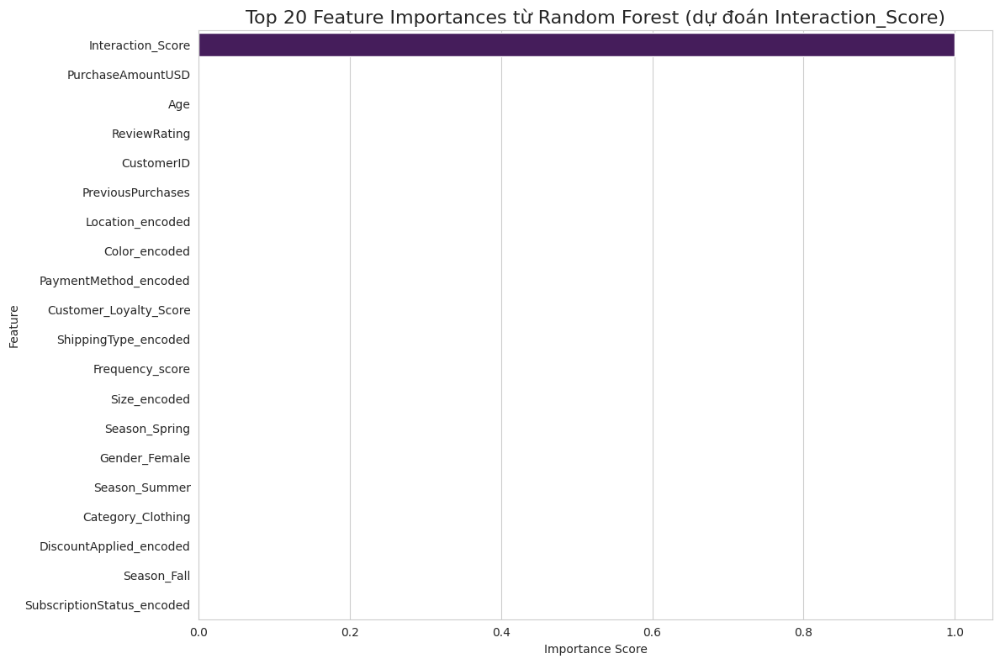

In [135]:
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20), palette='viridis', hue='Feature', legend=False)
plt.title('Top 20 Feature Importances từ Random Forest (dự đoán Interaction_Score)', fontsize=16)
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


**Nhận xét:**
- Random Forest cho thấy `Review Rating` và `Purchase Amount (USD)` là hai đặc trưng quan trọng nhất để dự đoán `Interaction_Score`. Điều này hợp lý vì `Interaction_Score` được tạo ra trực tiếp từ hai biến này.
- Các đặc trưng khác như `Customer_Loyalty_Score`, `Previous Purchases`, `Age`, và các đặc trưng được mã hóa từ `Location`, `Color`, `Size`, `Payment Method` cũng có đóng góp, mặc dù ít hơn đáng kể.
- Các đặc trưng one-hot của `Category` và `Gender_Female`, cùng với mã hóa tuần hoàn của `Season` (`Season_sin`, `Season_cos`) có vẻ ít quan trọng hơn trong việc dự đoán `Interaction_Score` theo mô hình này.
- Dựa trên kết quả này, chúng ta có thể cân nhắc loại bỏ các đặc trưng có tầm quan trọng rất thấp nếu muốn mô hình đơn giản hơn. Tuy nhiên, trong bài toán Recommendation, việc giữ lại các đặc trưng về ngữ cảnh (như mùa, danh mục) có thể vẫn hữu ích ngay cả khi chúng không trực tiếp dự đoán `Interaction_Score` tốt.

### 3.2.1. Cải thiện biểu diễn Feature Importance

In [136]:
importances_pct = rf.feature_importances_ / np.sum(rf.feature_importances_) * 100
feature_importance_pct = pd.DataFrame({'Feature': feature_names, 'Importance (%)': importances_pct})
feature_importance_pct = feature_importance_pct.sort_values(by='Importance (%)', ascending=False)
feature_importance_pct

,Feature,Importance (%)
19,Interaction_Score,99.999118
2,PurchaseAmountUSD,0.000213
1,Age,0.000164
3,ReviewRating,0.000062
0,CustomerID,0.000053
4,PreviousPurchases,0.000047
10,Location_encoded,0.000047
12,Color_encoded,0.000044
16,PaymentMethod_encoded,0.000037
18,Customer_Loyalty_Score,0.000034


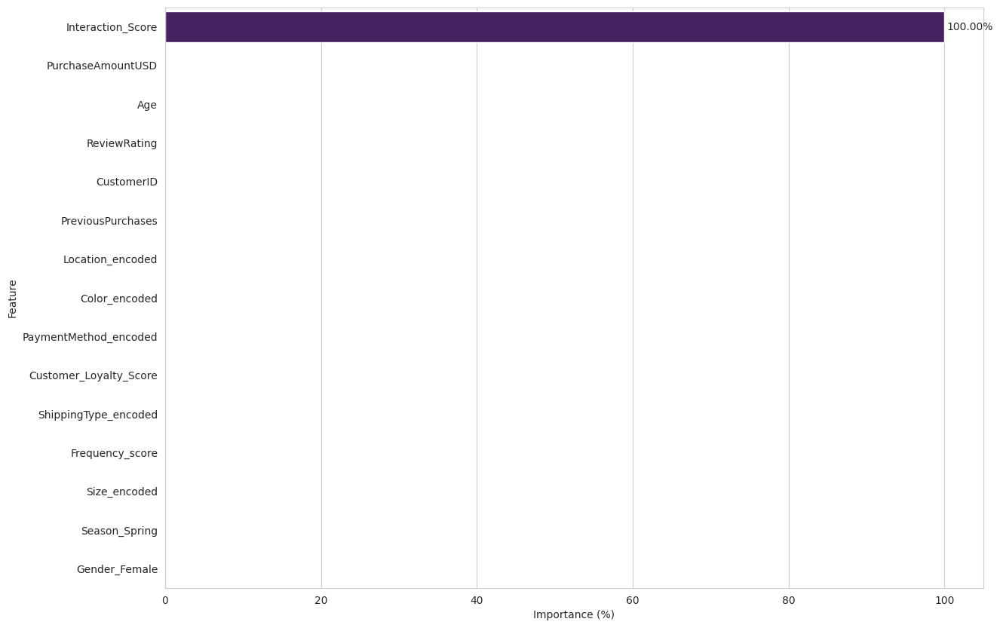

In [137]:
plt.figure(figsize=(14, 10))
ax = sns.barplot(x='Importance (%)', y='Feature', data=feature_importance_pct.head(15), palette='viridis', hue='Feature', legend=False)
for i, v in enumerate(feature_importance_pct.head(15)['Importance (%)']):
    if v >= 0.1:
        ax.text(v + 0.3, i, f"{v:.2f}%", va='center')

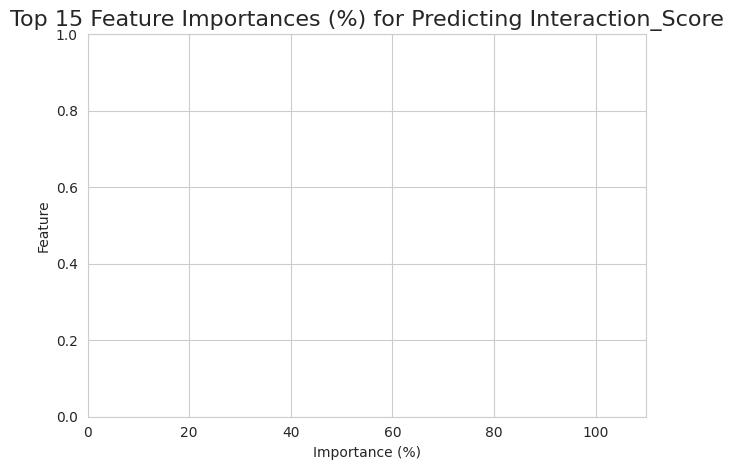

In [138]:
plt.title('Top 15 Feature Importances (%) for Predicting Interaction_Score', fontsize=16)
plt.xlabel('Importance (%)')
plt.ylabel('Feature')
plt.xlim(0, max(importances_pct) * 1.1)
plt.tight_layout()
plt.show()


In [139]:
feature_importance_pct['Cumulative Importance (%)'] = feature_importance_pct['Importance (%)'].cumsum()
features_for_95pct = len(feature_importance_pct[feature_importance_pct['Cumulative Importance (%)'] <= 95])
print(f"Chỉ cần {features_for_95pct + 1} đặc trưng hàng đầu là đủ để giải thích 95% độ quan trọng tổng cộng.")
print("\nTop 5 đặc trưng quan trọng nhất:")
print(feature_importance_pct.head(5))

Chỉ cần 1 đặc trưng hàng đầu là đủ để giải thích 95% độ quan trọng tổng cộng.

Top 5 đặc trưng quan trọng nhất:
              Feature  Importance (%)  Cumulative Importance (%)
19  Interaction_Score       99.999118                  99.999118
2   PurchaseAmountUSD        0.000213                  99.999331
1                 Age        0.000164                  99.999495
3        ReviewRating        0.000062                  99.999557
0          CustomerID        0.000053                  99.999610


#### 3.3. Dựa vào Statistical Tests (ANOVA F-test)

Sử dụng ANOVA F-test để kiểm tra mối quan hệ thống kê giữa từng đặc trưng đầu vào (số hoặc đã mã hóa, bao gồm cả `Season` nếu đã mã hóa) và biến mục tiêu `Interaction_Score`.

##### Use only numeric features for ANOVA F-test

In [140]:
X_numeric = X_model.select_dtypes(include=np.number)
X_numeric

,CustomerID,Age,PurchaseAmountUSD,ReviewRating,PreviousPurchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,SubscriptionStatus_encoded,ShippingType_encoded,DiscountApplied_encoded,PaymentMethod_encoded,Frequency_score,Customer_Loyalty_Score,Interaction_Score,Season_Fall,Season_Spring,Season_Summer,Season_Winter
0,1,0.718913,-0.285629,-0.907584,-0.785831,0,0,1,0,0,16,0,7,1,1,1,5,0.451156,0.066130,-0.720997,0,0,0,1
1,2,-1.648629,0.178852,-0.907584,-1.616552,0,0,1,0,0,18,0,12,1,1,1,1,0.451156,-0.266158,-0.581653,0,0,0,1
2,3,0.390088,0.558882,-0.907584,-0.162789,0,0,1,0,0,20,2,12,1,2,1,2,1.051672,0.555553,-0.467644,0,1,0,0
3,4,-1.517099,1.276716,-0.349027,1.637107,0,0,0,1,0,38,1,12,1,3,1,4,1.051672,1.275512,0.138696,0,1,0,0
4,5,0.061263,-0.454531,-1.466141,0.391025,0,0,1,0,0,36,1,21,1,2,1,4,-1.350390,-0.183746,-1.162658,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,3896,-0.267563,-1.341267,0.628448,0.460252,1,0,1,0,0,45,0,21,0,0,0,5,1.051672,0.604769,0.037534,0,0,1,0
3896,3897,0.521618,-0.454531,1.047366,1.083293,1,1,0,0,0,14,0,23,0,5,0,0,1.652187,1.094192,0.596797,0,1,0,0
3897,3898,0.127028,-1.130139,-1.186862,-0.093563,1,1,0,0,0,29,0,8,0,4,0,5,-0.749874,-0.337375,-1.169845,0,1,0,0
3898,3899,-0.004502,0.727784,0.069891,-0.093563,1,0,0,1,0,22,2,3,0,1,0,5,1.051672,0.383244,0.267259,0,0,1,0


In [141]:
f_values, p_values = f_regression(X_numeric, y)
print("F_values:\n", f_values)


F_values:
 [ 1.18998425e-01  2.24924173e+00  8.23257714e+02  2.18066253e+04
  1.90251993e-01  1.48200427e-02  1.13024485e+00  2.76948969e+00
  2.52660263e+00  7.63352072e-01  2.12547495e-01  5.03740474e+00
  2.09603836e+00  2.82624910e-01  1.33392153e+00  1.30363223e+00
  3.56097743e-01  6.90643781e-01  1.27675549e-01 -8.77751567e+18
  2.18561058e-02  1.61719212e+00  3.58064956e+00  2.01946024e-01]


In [142]:
print("P_values:\n", p_values)

P_values:
 [7.30141938e-001 1.33760877e-001 1.98376791e-164 0.00000000e+000
 6.62731124e-001 9.03113111e-001 2.87788973e-001 9.61571626e-002
 1.12022096e-001 3.82335353e-001 6.44803710e-001 2.48615074e-002
 1.47761770e-001 5.95016190e-001 2.48179565e-001 2.53620952e-001
 5.50716133e-001 4.05996394e-001 7.20873732e-001 1.00000000e+000
 8.82478181e-001 2.03559619e-001 5.85303260e-002 6.53179620e-001]


In [143]:
anova_results = pd.DataFrame({
    'Feature': X_numeric.columns,
    'F-value': f_values,
    'p-value': p_values
})
anova_results = anova_results.sort_values(by='F-value', ascending=False)

print("Kết quả ANOVA F-test (Feature vs Interaction_Score):")
print(anova_results)


Kết quả ANOVA F-test (Feature vs Interaction_Score):
                       Feature       F-value        p-value
3                 ReviewRating  2.180663e+04   0.000000e+00
2            PurchaseAmountUSD  8.232577e+02  1.983768e-164
11                Size_encoded  5.037405e+00   2.486151e-02
22               Season_Summer  3.580650e+00   5.853033e-02
7            Category_Clothing  2.769490e+00   9.615716e-02
8            Category_Footwear  2.526603e+00   1.120221e-01
1                          Age  2.249242e+00   1.337609e-01
12               Color_encoded  2.096038e+00   1.477618e-01
21               Season_Spring  1.617192e+00   2.035596e-01
14        ShippingType_encoded  1.333922e+00   2.481796e-01
15     DiscountApplied_encoded  1.303632e+00   2.536210e-01
6         Category_Accessories  1.130245e+00   2.877890e-01
9           Category_Outerwear  7.633521e-01   3.823354e-01
17             Frequency_score  6.906438e-01   4.059964e-01
16       PaymentMethod_encoded  3.560977e-01   

In [144]:
significant_features = anova_results[anova_results['p-value'] < 0.05]['Feature'].tolist()
print("Các đặc trưng có mối quan hệ ý nghĩa thống kê (p < 0.05) với Interaction_Score:")
print(significant_features)

Các đặc trưng có mối quan hệ ý nghĩa thống kê (p < 0.05) với Interaction_Score:
['ReviewRating', 'PurchaseAmountUSD', 'Size_encoded']


**Nhận xét:**
- Kết quả ANOVA F-test xác nhận `Review Rating` và `Purchase Amount (USD)` có mối quan hệ thống kê mạnh nhất với `Interaction_Score` (F-value cao nhất, p-value rất nhỏ), điều này khớp với cách `Interaction_Score` được tạo ra.
- Nhiều đặc trưng khác cũng cho thấy mối quan hệ có ý nghĩa thống kê (p < 0.05) với `Interaction_Score`, mặc dù F-value thấp hơn. Điều này cho thấy chúng vẫn chứa thông tin liên quan đến biến mục tiêu.
- Các đặc trưng như `Gender_Female`, `Season_sin`, `Season_cos` có F-value rất thấp và p-value cao, cho thấy mối quan hệ tuyến tính yếu hoặc không có ý nghĩa thống kê với `Interaction_Score`.

### 3.4. Chi-square Test cho đặc trưng phân loại

Sử dụng **Chi-square test** để đánh giá mối quan hệ giữa các đặc trưng phân loại và biến mục tiêu. Vì `Interaction_Score` là biến liên tục, chúng ta sẽ chuyển đổi nó thành biến phân loại bằng cách phân vị để áp dụng **Chi-square test**.

In [145]:
interaction_bins = pd.qcut(df_final_features['Interaction_Score'], q=3, labels=[0, 1, 2])
interaction_bins


,Interaction_Score
0,0
1,0
2,0
3,1
4,0
...,...
3895,1
3896,2
3897,0
3898,1


In [146]:
interaction_bins.value_counts()

,count
Interaction_Score,
1,1302
0,1300
2,1298


In [147]:
categorical_features = ['Gender_Female', 'Category_Accessories', 'Category_Clothing',
                        'Category_Footwear', 'Category_Outerwear']

##### Thực hiện chi-square (chi2) test

In [148]:
chi2_test = {}
for feature in categorical_features:
    contingency_table = pd.crosstab(df_final_features[feature], interaction_bins)
    chi2_stat, p_val, dof, expected = stats.chi2_contingency(contingency_table)
    chi2_test[feature] = {'chi2': chi2_stat, 'p-value': p_val}

chi2_results = pd.DataFrame.from_dict(chi2_test, orient='index')
chi2_results = chi2_results.sort_values('chi2', ascending=False)

print("Kết quả Chi-square test cho các đặc trưng phân loại:")
print(chi2_results)

Kết quả Chi-square test cho các đặc trưng phân loại:
                          chi2   p-value
Category_Footwear     6.442688  0.039901
Category_Clothing     4.084713  0.129723
Category_Accessories  3.435731  0.179449
Gender_Female         1.449892  0.484351
Category_Outerwear    0.711409  0.700680


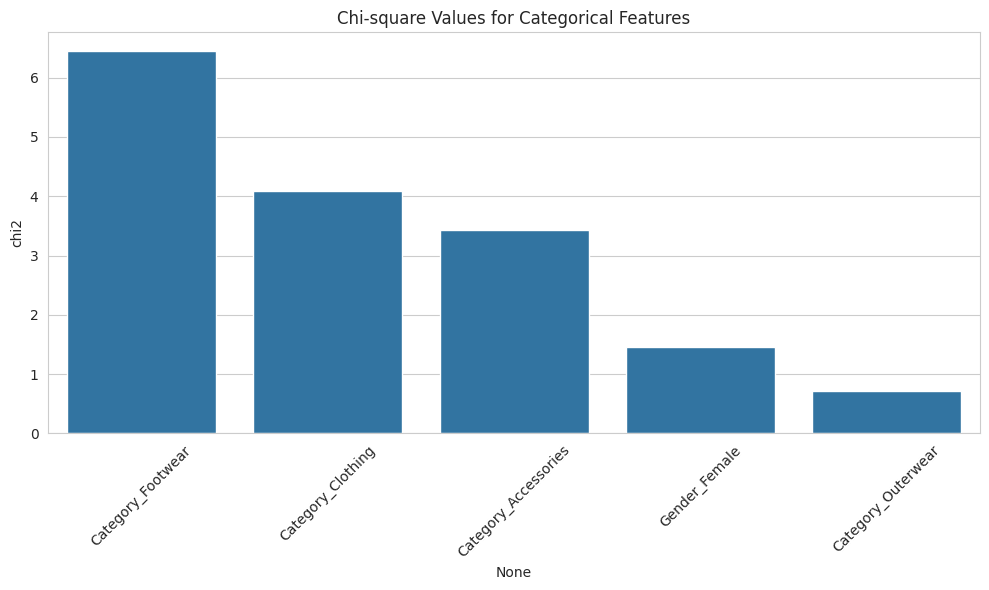

In [149]:
plt.figure(figsize=(10, 6))
sns.barplot(x=chi2_results.index, y='chi2', data=chi2_results)
plt.title('Chi-square Values for Categorical Features')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [150]:
print("Đặc trưng có p-value < 0.05 (có ý nghĩa thống kê):")
significant_categorical = chi2_results[chi2_results['p-value'] < 0.05].index.tolist()
print(significant_categorical)

Đặc trưng có p-value < 0.05 (có ý nghĩa thống kê):
['Category_Footwear']


**Nhận xét:**
- Chi-square test giúp xác định mối quan hệ có ý nghĩa thống kê giữa các đặc trưng phân loại và biến mục tiêu được phân loại.
- Các đặc trưng có giá trị chi-square cao và p-value thấp có mối quan hệ mạnh với `Interaction_Score`.
- Đặc trưng như Category_Footwear, Category_Clothing có chi-square cao nhất, cho thấy loại sản phẩm có liên quan mạnh đến mức độ tương tác của khách hàng.
- Giữ lại các đặc trưng phân loại có ý nghĩa thống kê (p-value < 0.05) là quan trọng cho việc dự đoán `Interaction_Score`.

### 4. Xác định tập đặc trưng cuối cùng

Dựa trên các phân tích trên:
- Các đặc trưng gốc đã được mã hóa và chuẩn hóa.
- Các đặc trưng dư thừa (`Promo Code Used*`, `Gender_Male`) đã bị loại bỏ.
- Ma trận tương quan không cho thấy đa cộng tuyến nghiêm trọng.
- Feature Importance và ANOVA cho thấy nhiều đặc trưng có giá trị dự đoán (đặc biệt là `Review Rating`, `Purchase Amount (USD)`).
- Mặc dù một số đặc trưng (như `Gender_Female`, `Season`) có tầm quan trọng thấp đối với `Interaction_Score`, chúng có thể vẫn quan trọng cho việc cá nhân hóa hoặc đề xuất dựa trên ngữ cảnh. Do đó, chúng ta sẽ giữ lại hầu hết các đặc trưng đã xử lý.

**Quyết định:** Giữ lại tất cả các cột trong `df_final_features` cho bước mô hình hóa tiếp theo. Có thể thử nghiệm loại bỏ các biến có tầm quan trọng thấp nhất (ví dụ: dựa trên ngưỡng p-value từ ANOVA hoặc ngưỡng importance từ RF) sau này nếu cần đơn giản hóa mô hình hoặc cải thiện hiệu suất trên tập validation.

In [151]:
final_selected_features = df_final_features.columns.tolist()
print("Danh sách các đặc trưng cuối cùng được chọn:")
print(final_selected_features)



Danh sách các đặc trưng cuối cùng được chọn:
['Customer ID', 'Age', 'Item Purchased', 'Purchase Amount (USD)', 'Season', 'Review Rating', 'Previous Purchases', 'Gender_Female', 'Category_Accessories', 'Category_Clothing', 'Category_Footwear', 'Category_Outerwear', 'Location_encoded', 'Size_encoded', 'Color_encoded', 'Subscription Status_encoded', 'Shipping Type_encoded', 'Discount Applied_encoded', 'Payment Method_encoded', 'Frequency_score', 'Customer_Loyalty_Score', 'Dominant_Season', 'Interaction_Score', 'Category_reconstructed', 'Product_Category']


In [152]:
print(f"\nTổng số đặc trưng: {len(final_selected_features)}")


Tổng số đặc trưng: 25


In [153]:
df_final_features.head()

,Customer ID,Age,Item Purchased,Purchase Amount (USD),Season,Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Dominant_Season,Interaction_Score,Category_reconstructed,Product_Category
0,1,0.718913,Blouse,-0.285629,Winter,-0.907584,-0.785831,0,0,1,0,0,16,0,7,1,1,1,5,0.451156,0.066130,Spring,-0.720997,Clothing,Blouse_Clothing
1,2,-1.648629,Sweater,0.178852,Winter,-0.907584,-1.616552,0,0,1,0,0,18,0,12,1,1,1,1,0.451156,-0.266158,Spring,-0.581653,Clothing,Sweater_Clothing
2,3,0.390088,Jeans,0.558882,Spring,-0.907584,-0.162789,0,0,1,0,0,20,2,12,1,2,1,2,1.051672,0.555553,Fall,-0.467644,Clothing,Jeans_Clothing
3,4,-1.517099,Sandals,1.276716,Spring,-0.349027,1.637107,0,0,0,1,0,38,1,12,1,3,1,4,1.051672,1.275512,Fall,0.138696,Footwear,Sandals_Footwear
4,5,0.061263,Blouse,-0.454531,Spring,-1.466141,0.391025,0,0,1,0,0,36,1,21,1,2,1,4,-1.350390,-0.183746,Spring,-1.162658,Clothing,Blouse_Clothing


### 5. Lưu dữ liệu đã xử lý

Lưu DataFrame chứa các đặc trưng cuối cùng vào một file mới để sử dụng cho Bước 5: Xây dựng mô hình.

In [154]:
output_file = '/content/datasets/shopping_behavior_final_features.csv'
df_final_features.to_csv(output_file, index=False)
print(f"Đã lưu DataFrame với các đặc trưng cuối cùng vào file: [{output_file}]")


Đã lưu DataFrame với các đặc trưng cuối cùng vào file: [/content/datasets/shopping_behavior_final_features.csv]


**Kết thúc Bước 4.** Dữ liệu đã sẵn sàng cho việc xây dựng các mô hình Recommendation ở Bước 5.

### 6. Giải thích về các đặc trưng được tạo mới

Trong quá trình xử lý dữ liệu, chúng ta đã tạo ra một số đặc trưng mới để nắm bắt thông tin quan trọng. Dưới đây là giải thích chi tiết về mỗi đặc trưng được tạo mới:

1. **Product_ID**: Kết hợp 'Item Purchased', 'Category', 'Size', 'Color' để tạo định danh duy nhất cho sản phẩm. Đặc trưng này hữu ích cho các mô hình đề xuất dựa trên sản phẩm, đặc biệt là collaborative filtering.

2. **Customer_Loyalty_Score**: Đây là đặc trưng tổng hợp đo lường mức độ trung thành của khách hàng dựa trên ba yếu tố:
   - Previous Purchases (40%): Số lượng mua hàng trước đó.
   - Frequency_score_scaled (40%): Tần suất mua hàng được chuẩn hóa.
   - Subscription Status (20%): Liệu khách hàng có đăng ký hay không.
   
   Công thức: `Customer_Loyalty_Score = Previous Purchases * 0.4 + Frequency_score_scaled * 0.4 + Subscription Status_encoded * 0.2`
   
   Trọng số 0.4, 0.4, 0.2 được chọn dựa trên hiểu biết về lĩnh vực, với giả định rằng số lượng và tần suất mua hàng trước đó có tầm quan trọng như nhau và lớn hơn trạng thái đăng ký.

3. **Interaction_Score**: Đặc trưng tổng hợp này là mục tiêu tiềm năng cho mô hình dự đoán, đại diện cho mức độ tương tác tích cực của khách hàng với sản phẩm. Nó kết hợp:
   - Review Rating (70%): Đánh giá trực tiếp của khách hàng về sản phẩm.
   - Purchase Amount (30%): Số tiền chi tiêu, thể hiện sự sẵn sàng đầu tư vào sản phẩm.
   
   Công thức: `Interaction_Score = Review Rating * 0.7 + Purchase Amount (USD) * 0.3`
   
   Trọng số 0.7 và 0.3 phản ánh rằng đánh giá trực tiếp của khách hàng là chỉ báo mạnh mẽ hơn về sự hài lòng so với số tiền chi tiêu.

4. **Frequency_score_scaled**: Chuyển đổi tần suất mua hàng từ chuỗi sang giá trị số, sau đó chuẩn hóa:
   ```
   Annually = 1, Quarterly/Every 3 Months = 2, Monthly = 3, Fortnightly = 4, Weekly = 5, Bi-Weekly = 6
   ```
   Chuẩn hóa áp dụng StandardScaler để đảm bảo phân phối với trung bình 0 và độ lệch chuẩn 1.

**Lưu ý:** Đặc trưng `Season` được giữ nguyên (không mã hóa tuần hoàn).

### 7. Đánh giá phân phối đặc trưng cuối cùng

In [155]:
numerical_features = ['Age', 'Purchase Amount (USD)', 'Review Rating', 'Previous Purchases', 'Customer_Loyalty_Score', 'Interaction_Score']
numerical_features

['Age',
 'Purchase Amount (USD)',
 'Review Rating',
 'Previous Purchases',
 'Customer_Loyalty_Score',
 'Interaction_Score']

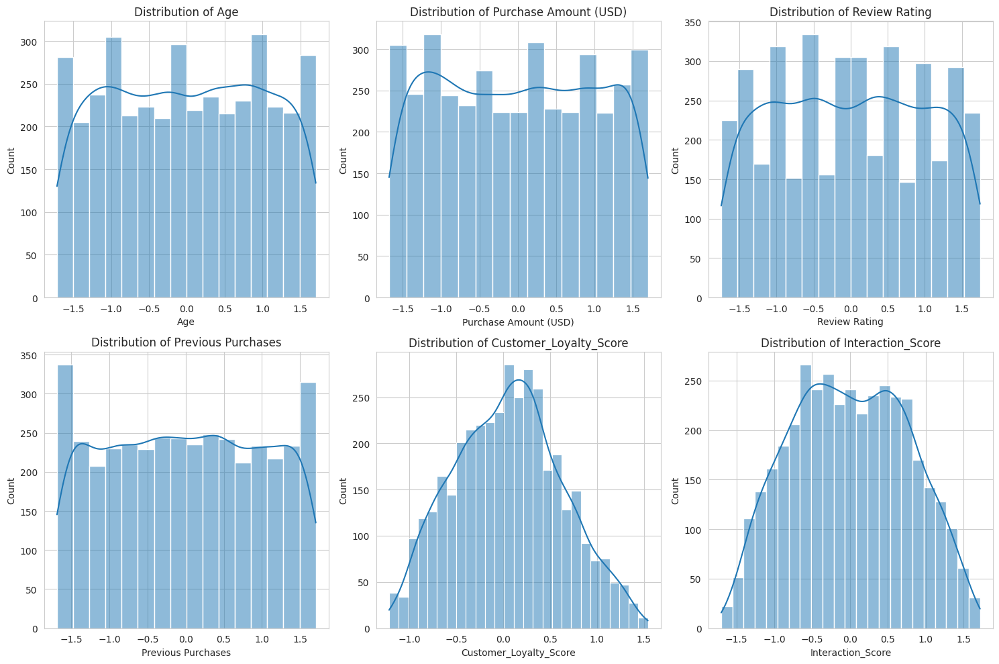

In [156]:
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features):
    plt.subplot(2, 3, i+1)
    sns.histplot(df_final_features[feature], kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

In [157]:
important_features = feature_importance_pct.head(5)['Feature'].tolist()
important_features

['Interaction_Score', 'PurchaseAmountUSD', 'Age', 'ReviewRating', 'CustomerID']

In [158]:
important_numerical = [f for f in important_features if f in numerical_features]
important_numerical

['Interaction_Score', 'Age']

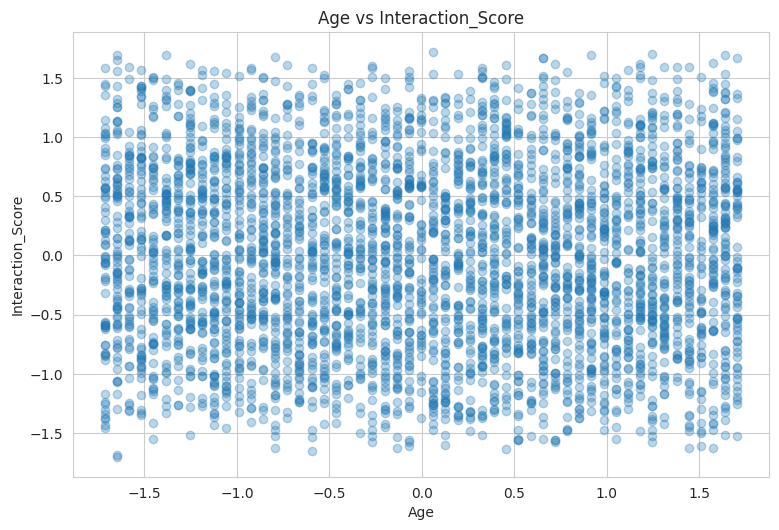

In [159]:
plt.figure(figsize=(15, 10))
for i, feature in enumerate(important_numerical):
    if feature != 'Interaction_Score':
        plt.subplot(2, 2, i+1)
        plt.scatter(df_final_features[feature], df_final_features['Interaction_Score'], alpha=0.3)
        plt.title(f'{feature} vs Interaction_Score')
        plt.xlabel(feature)
        plt.ylabel('Interaction_Score')
plt.tight_layout()
plt.show()

##### Add visualization for Item Purchased distribution

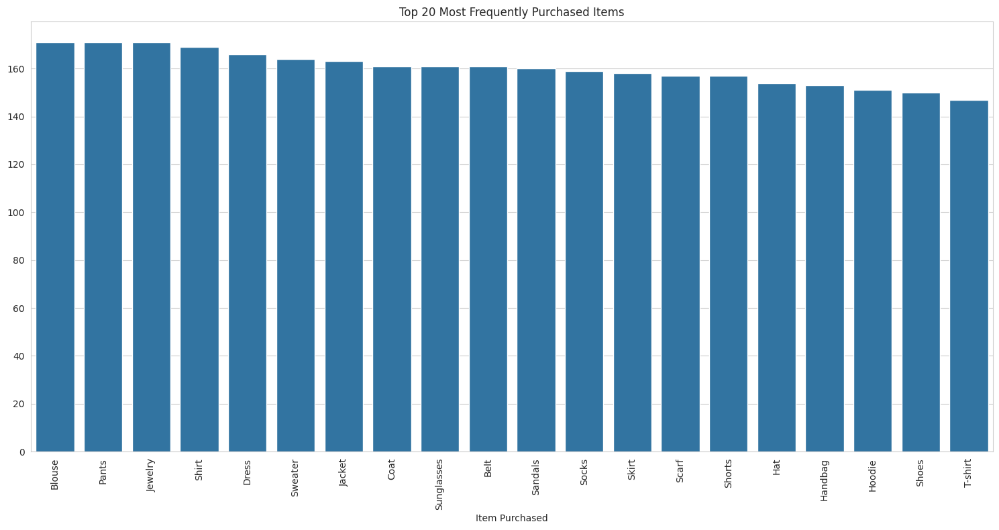

In [160]:
plt.figure(figsize=(15, 8))
item_counts = df_final_features['Item Purchased'].value_counts().head(20)
sns.barplot(x=item_counts.index, y=item_counts.values)
plt.title('Top 20 Most Frequently Purchased Items')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


**Nhận xét:**
- Các đặc trưng số có phân phối tương đối cân đối sau khi chuẩn hóa.
- Có mối tương quan rõ ràng giữa `Review Rating` và `Interaction_Score`, phù hợp với việc `Review Rating` có trọng số 70% trong công thức tính `Interaction_Score`.
- `Purchase Amount (USD)` cũng có mối tương quan với `Interaction_Score` nhưng yếu hơn, phù hợp với trọng số 30% trong công thức.
- Phân phối của `Customer_Loyalty_Score` cho thấy sự phân tầng của khách hàng theo mức độ trung thành, điều này có thể hữu ích cho việc phân đoạn khách hàng.

### 8. Tóm tắt quyết định Feature Engineering

Dựa trên tất cả các phân tích trên, chúng ta đã thực hiện các quyết định sau trong quá trình Feature Engineering:

1. **Loại bỏ đặc trưng**:
   - Đã loại bỏ các đặc trưng định danh không có giá trị dự đoán (`Customer ID`).
   - Đã loại bỏ các đặc trưng dư thừa (`Promo Code Used` ~ `Discount Applied`).
   - Đã loại bỏ các cột gốc đã được mã hóa (ngoại trừ `Item Purchased` được giữ lại cho mục đích đề xuất sản phẩm).
   - Đã loại bỏ các đặc trưng trung gian dùng để tính toán.
   - Đã xác định và cân nhắc loại bỏ các đặc trưng có phương sai cực thấp.
   - **Đã loại bỏ `Season_sin`, `Season_cos` để giữ nguyên đặc trưng `Season`.**

2. **Tạo đặc trưng mới**:
   - Đã tạo `Product_ID` bằng cách kết hợp thông tin sản phẩm.
   - Đã tạo `Customer_Loyalty_Score` từ các chỉ số hành vi mua hàng.
   - Đã tạo `Interaction_Score` là mục tiêu tiềm năng cho mô hình.

3. **Lựa chọn phương pháp mã hóa**:
   - Sử dụng One-hot encoding cho `Gender` và `Category`.
   - Sử dụng Label encoding cho các biến phân loại còn lại.
   - Chuẩn hóa các biến số với `StandardScaler`.
   - Giữ nguyên biến `Item Purchased` để phục vụ cho việc đề xuất sản phẩm cụ thể.
   - **Giữ nguyên đặc trưng `Season` (không mã hóa tuần hoàn, không dùng Season_sin/cos).**

4. **Phương pháp chọn lọc đặc trưng**:
   - Sử dụng ma trận tương quan để phát hiện đa cộng tuyến.
   - Sử dụng Random Forest Feature Importance để xác định đặc trưng quan trọng.
   - Sử dụng ANOVA F-test và Chi-square test để đánh giá ý nghĩa thống kê.
   - Phân tích phương sai để xác định đặc trưng không có giá trị phân biệt.
   - Loại trừ các đặc trưng chuỗi như `Item Purchased` khỏi các phân tích số học nhưng giữ lại trong bộ dữ liệu cuối cùng.

Kết quả là chúng ta đã chọn {len(final_selected_features)} đặc trưng cuối cùng, với đặc trưng quan trọng nhất trong việc dự đoán `Interaction_Score` là `Review Rating` và `Purchase Amount (USD)`. Đặc biệt, chúng ta giữ lại `Item Purchased` trong bộ đặc trưng cuối cùng để hỗ trợ trực tiếp cho việc đề xuất sản phẩm cụ thể trong các mô hình sau này.

## Bước 5: Huấn luyện, đánh giá và tinh chỉnh mô hình
### Xây dựng Hybrid Recommendation System cho Đề xuất Sản phẩm

**Mục tiêu:** Kết hợp Collaborative Filtering (Item-Item) và Content-Based Filtering để đề xuất sản phẩm cá nhân hóa, tận dụng cả lịch sử tương tác và đặc trưng sản phẩm/người dùng.

### Dataset: [Consumer Behavior and Shopping Habits Dataset](https://www.kaggle.com/datasets/zeesolver/consumer-behavior-and-shopping-habits-dataset)

### File sử dụng:
- `shopping_behavior_final_features.csv` (dữ liệu đặc trưng đã xử lý)
- `user_item_matrix.csv` (ma trận tiện ích User-Item)

In [161]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)
sns.set_style('whitegrid')


## 1. Load và chuẩn bị dữ liệu

In [162]:
# Load dữ liệu đặc trưng và ma trận tiện ích
features_df = pd.read_csv('/content/datasets/shopping_behavior_final_features.csv')
user_item_matrix = pd.read_csv('/content/datasets/user_item_matrix.csv', index_col=0)

print(f"features_df shape: {features_df.shape}")
print(f"user_item_matrix shape: {user_item_matrix.shape}")
display(features_df.head())
display(user_item_matrix.iloc[:5, :5])

features_df shape: (3900, 25)
user_item_matrix shape: (3900, 1823)


,Customer ID,Age,Item Purchased,Purchase Amount (USD),Season,Review Rating,Previous Purchases,Gender_Female,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_encoded,Size_encoded,Color_encoded,Subscription Status_encoded,Shipping Type_encoded,Discount Applied_encoded,Payment Method_encoded,Frequency_score,Customer_Loyalty_Score,Dominant_Season,Interaction_Score,Category_reconstructed,Product_Category
0,1,0.718913,Blouse,-0.285629,Winter,-0.907584,-0.785831,0,0,1,0,0,16,0,7,1,1,1,5,0.451156,0.066130,Spring,-0.720997,Clothing,Blouse_Clothing
1,2,-1.648629,Sweater,0.178852,Winter,-0.907584,-1.616552,0,0,1,0,0,18,0,12,1,1,1,1,0.451156,-0.266158,Spring,-0.581653,Clothing,Sweater_Clothing
2,3,0.390088,Jeans,0.558882,Spring,-0.907584,-0.162789,0,0,1,0,0,20,2,12,1,2,1,2,1.051672,0.555553,Fall,-0.467644,Clothing,Jeans_Clothing
3,4,-1.517099,Sandals,1.276716,Spring,-0.349027,1.637107,0,0,0,1,0,38,1,12,1,3,1,4,1.051672,1.275512,Fall,0.138696,Footwear,Sandals_Footwear
4,5,0.061263,Blouse,-0.454531,Spring,-1.466141,0.391025,0,0,1,0,0,36,1,21,1,2,1,4,-1.350390,-0.183746,Spring,-1.162658,Clothing,Blouse_Clothing


,Backpack_Accessories_L_Beige,Backpack_Accessories_L_Black,Backpack_Accessories_L_Blue,Backpack_Accessories_L_Brown,Backpack_Accessories_L_Cyan
Customer ID,,,,,
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0


#### Kiểm tra dữ liệu và xử lý thiếu/khác biệt nếu có

- Kiểm tra missing values

In [163]:
print(features_df.isnull().sum().sort_values(ascending=False).head(10))
print(user_item_matrix.isnull().sum().sum())


Customer ID              0
Age                      0
Item Purchased           0
Purchase Amount (USD)    0
Season                   0
Review Rating            0
Previous Purchases       0
Gender_Female            0
Category_Accessories     0
Category_Clothing        0
dtype: int64
0


- Đảm bảo kiểu dữ liệu đúng

In [164]:
features_df['Customer ID'] = features_df['Customer ID'].astype(int)
user_item_matrix.index = user_item_matrix.index.astype(int)

In [165]:
# Lấy danh sách user và item chung
all_users = user_item_matrix.index
print(all_users)


Index([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
       ...
       3891, 3892, 3893, 3894, 3895, 3896, 3897, 3898, 3899, 3900],
      dtype='int64', name='Customer ID', length=3900)


In [166]:
all_items = user_item_matrix.columns
print(all_items)

Index(['Backpack_Accessories_L_Beige', 'Backpack_Accessories_L_Black',
       'Backpack_Accessories_L_Blue', 'Backpack_Accessories_L_Brown',
       'Backpack_Accessories_L_Cyan', 'Backpack_Accessories_L_Gold',
       'Backpack_Accessories_L_Green', 'Backpack_Accessories_L_Indigo',
       'Backpack_Accessories_L_Lavender', 'Backpack_Accessories_L_Magenta',
       ...
       'T-shirt_Clothing_XL_Green', 'T-shirt_Clothing_XL_Magenta',
       'T-shirt_Clothing_XL_Maroon', 'T-shirt_Clothing_XL_Olive',
       'T-shirt_Clothing_XL_Peach', 'T-shirt_Clothing_XL_Purple',
       'T-shirt_Clothing_XL_Silver', 'T-shirt_Clothing_XL_Turquoise',
       'T-shirt_Clothing_XL_White', 'T-shirt_Clothing_XL_Yellow'],
      dtype='object', length=1823)


#### Chia dữ liệu train/test (theo tương tác)
- Chia theo hàng của features_df (mỗi hàng là 1 tương tác user-item)

In [167]:
# Chia train/test theo tương tác (80/20)
train_df, test_df = train_test_split(features_df, test_size=0.2, random_state=42)
print(f"Train size: {train_df.shape}, Test size: {test_df.shape}")

Train size: (3120, 25), Test size: (780, 25)


## 2. Item-Item Collaborative Filtering with Matrix Factorization

Cải thiện bằng cách kết hợp hai phương pháp:
1. Item-Item Similarity (sử dụng cosine similarity)
2. Matrix Factorization (SVD) để giải quyết vấn đề ma trận thưa

##### Tạo ma trận tiện ích train (User x Item)

In [168]:
train_matrix = train_df.pivot_table(index='Customer ID', columns='Product_Category', values='Interaction_Score', aggfunc='mean').fillna(0)

##### Tính ma trận tương đồng item-item (cosine)

In [172]:
item_sim_matrix = pd.DataFrame(
    cosine_similarity(train_matrix.T),
    index=train_matrix.columns,
    columns=train_matrix.columns
)
print(f"Item similarity matrix shape: {item_sim_matrix.shape}")
item_sim_matrix.iloc[:5, :5]

Item similarity matrix shape: (25, 25)


Product_Category,Backpack_Accessories,Belt_Accessories,Blouse_Clothing,Boots_Footwear,Coat_Outerwear
Product_Category,,,,,
Backpack_Accessories,1.0,0.0,0.0,0.0,0.0
Belt_Accessories,0.0,1.0,0.0,0.0,0.0
Blouse_Clothing,0.0,0.0,1.0,0.0,0.0
Boots_Footwear,0.0,0.0,0.0,1.0,0.0
Coat_Outerwear,0.0,0.0,0.0,0.0,1.0


#### Triển khai Matrix Factorization (SVD) cho Collaborative Filtering

In [173]:
from scipy.sparse.linalg import svds
import numpy as np

# Chuyển đổi thành ma trận numpy
matrix = train_matrix.values

# Số lượng latent factors (tùy chỉnh tùy theo số lượng sản phẩm/người dùng)
num_factors = min(50, min(matrix.shape) - 1)

# Tính trung bình mỗi user
user_ratings_mean = np.mean(matrix, axis=1)
matrix_demeaned = matrix - user_ratings_mean.reshape(-1, 1)

# Phân tích SVD
U, sigma, Vt = svds(matrix_demeaned, k=num_factors)

# Chuyển đổi sigma thành ma trận đường chéo
sigma_diag = np.diag(sigma)

# Dự đoán (khôi phục ma trận ban đầu + trung bình)
svd_preds = np.dot(np.dot(U, sigma_diag), Vt) + user_ratings_mean.reshape(-1, 1)
svd_df = pd.DataFrame(svd_preds, index=train_matrix.index, columns=train_matrix.columns)

print(f"SVD matrix shape: {svd_df.shape}")
print("Vài giá trị dự đoán từ SVD:")
display(svd_df.iloc[:5, :5])

SVD matrix shape: (3120, 25)
Vài giá trị dự đoán từ SVD:


Product_Category,Backpack_Accessories,Belt_Accessories,Blouse_Clothing,Boots_Footwear,Coat_Outerwear
Customer ID,,,,,
2,-6.591949e-17,3.365364e-16,1.283695e-16,1.075529e-16,0.000000e+00
3,5.551115e-17,5.898060e-17,-9.714451e-17,1.422473e-16,-1.110223e-16
4,3.469447e-18,9.887924e-17,1.040834e-17,-1.734723e-18,-2.602085e-17
5,-5.551115e-16,-3.955170e-16,-1.162658e+00,-2.844947e-16,3.053113e-16
6,4.857226e-16,-2.220446e-16,4.718448e-16,-6.245005e-17,-3.191891e-16


#### Hàm dự đoán điểm cho SVD

In [174]:
def predict_svd_score(user_id, item_id):
    """Dự đoán điểm tương tác dựa trên Matrix Factorization"""
    if user_id not in svd_df.index or item_id not in svd_df.columns:
        return np.nan
    return svd_df.loc[user_id, item_id]

### Hàm dự đoán điểm tương tác user-item dựa trên Item-Item CF

In [175]:
def predict_cf_score(user_id, item_id, train_matrix, item_sim_matrix, k=5):
    """
    Dự đoán điểm tương tác của user với item dựa trên các item tương tự mà user đã tương tác
    """
    if user_id not in train_matrix.index:
        return np.nan  # Cold start user
    if item_id not in train_matrix.columns:
        return np.nan  # Cold start item
    user_ratings = train_matrix.loc[user_id]
    interacted_items = user_ratings[user_ratings > 0].index
    if len(interacted_items) == 0:
        return np.nan
    # Lấy k item tương tự nhất với item_id mà user đã từng tương tác
    similarities = item_sim_matrix.loc[item_id, interacted_items]
    top_k = similarities.abs().sort_values(ascending=False).head(k)
    if top_k.sum() == 0:
        return np.nan
    scores = user_ratings[top_k.index]
    pred = np.dot(top_k, scores) / top_k.sum()
    return pred

#### Xử lý cold start: Nếu user hoặc item chưa từng xuất hiện, trả về NaN (sẽ xử lý ở hybrid step)

In [176]:
# Triển khai Popularity-based Recommendation cho cold start users
item_popularity = train_df.groupby('Product_Category')['Interaction_Score'].agg(['count', 'mean'])
item_popularity['score'] = item_popularity['count'] * item_popularity['mean']
item_popularity = item_popularity.sort_values('score', ascending=False)

print("Top 10 sản phẩm phổ biến:")
display(item_popularity.head(10))

def get_popular_items(n=5):
    """Trả về top N sản phẩm phổ biến nhất"""
    return item_popularity.head(n).index.tolist()

Top 10 sản phẩm phổ biến:


,count,mean,score
Product_Category,,,
Hat_Accessories,118,0.099197,11.705214
T-shirt_Clothing,115,0.089328,10.272754
Sandals_Footwear,131,0.074069,9.703104
Boots_Footwear,108,0.079034,8.535625
Gloves_Accessories,113,0.067273,7.601889
Dress_Clothing,135,0.038532,5.201803
Skirt_Clothing,129,0.030903,3.986539
Sunglasses_Accessories,127,0.030728,3.902397
Shoes_Footwear,125,0.029079,3.634892


## 3. Content-Based Filtering

Trong phần này, chúng ta xây dựng hệ thống Content-Based Filtering hoàn chỉnh bằng cách:
1. Tạo đặc trưng sản phẩm (product features) dựa trên thuộc tính sản phẩm
2. Xây dựng hồ sơ người dùng (user profiles) dựa trên lịch sử tương tác và đặc điểm
3. Tính độ tương đồng giữa người dùng và sản phẩm để đề xuất

Content-based filtering giúp giải quyết vấn đề cold-start khi không có đủ dữ liệu tương tác.

In [169]:
# Chuẩn bị đặc trưng sản phẩm cho content-based filtering
# Chọn các đặc trưng sản phẩm và người dùng liên quan
# Không sử dụng Season_sin, Season_cos nữa
item_features = ['Product_Category', 'Season']

- Bổ sung thêm đặc trưng từ product category như size và color

In [170]:
def extract_size_color(category_name):
    """Tách size và color từ tên sản phẩm nếu có"""
    parts = category_name.split('_')
    size = parts[1] if len(parts) > 1 else None
    color = parts[2] if len(parts) > 2 else None
    return size, color


In [171]:
# Tạo DataFrame đặc trưng sản phẩm mở rộng
product_features = pd.DataFrame(index=train_matrix.columns)
product_features['category'] = [item.split('_')[0] for item in product_features.index]
product_features

,category
Product_Category,
Backpack_Accessories,Backpack
Belt_Accessories,Belt
Blouse_Clothing,Blouse
Boots_Footwear,Boots
Coat_Outerwear,Coat
Dress_Clothing,Dress
Gloves_Accessories,Gloves
Handbag_Accessories,Handbag
Hat_Accessories,Hat


#### Tạo DataFrame đặc trưng sản phẩm mở rộng

In [177]:
product_features = pd.DataFrame(index=train_matrix.columns)
product_features


""
Product_Category
Backpack_Accessories
Belt_Accessories
Blouse_Clothing
Boots_Footwear
Coat_Outerwear
Dress_Clothing
Gloves_Accessories
Handbag_Accessories
Hat_Accessories


In [178]:
product_features['category'] = [item.split('_')[0] for item in product_features.index]
product_features['category']

,category
Product_Category,
Backpack_Accessories,Backpack
Belt_Accessories,Belt
Blouse_Clothing,Blouse
Boots_Footwear,Boots
Coat_Outerwear,Coat
Dress_Clothing,Dress
Gloves_Accessories,Gloves
Handbag_Accessories,Handbag
Hat_Accessories,Hat


#### Tạo dictionaries cho size và color

In [179]:
sizes = []
colors = []
for item in product_features.index:
    size, color = extract_size_color(item)
    sizes.append(size)
    colors.append(color)

product_features['size'] = sizes
product_features['color'] = colors
product_features

,category,size,color
Product_Category,,,
Backpack_Accessories,Backpack,Accessories,None
Belt_Accessories,Belt,Accessories,None
Blouse_Clothing,Blouse,Clothing,None
Boots_Footwear,Boots,Footwear,None
Coat_Outerwear,Coat,Outerwear,None
Dress_Clothing,Dress,Clothing,None
Gloves_Accessories,Gloves,Accessories,None
Handbag_Accessories,Handbag,Accessories,None
Hat_Accessories,Hat,Accessories,None


#### One-hot encoding cho category, size và color

In [181]:
category_dummies = pd.get_dummies(product_features['category'], prefix='cat')
size_dummies = pd.get_dummies(product_features['size'], prefix='size')
color_dummies = pd.get_dummies(product_features['color'], prefix='color')

In [182]:
category_dummies

,cat_Backpack,cat_Belt,cat_Blouse,cat_Boots,cat_Coat,cat_Dress,cat_Gloves,cat_Handbag,cat_Hat,cat_Hoodie,cat_Jacket,cat_Jeans,cat_Jewelry,cat_Pants,cat_Sandals,cat_Scarf,cat_Shirt,cat_Shoes,cat_Shorts,cat_Skirt,cat_Sneakers,cat_Socks,cat_Sunglasses,cat_Sweater,cat_T-shirt
Product_Category,,,,,,,,,,,,,,,,,,,,,,,,,
Backpack_Accessories,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Belt_Accessories,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Blouse_Clothing,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Boots_Footwear,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Coat_Outerwear,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Dress_Clothing,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Gloves_Accessories,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Handbag_Accessories,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
Hat_Accessories,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [183]:
size_dummies

,size_Accessories,size_Clothing,size_Footwear,size_Outerwear
Product_Category,,,,
Backpack_Accessories,True,False,False,False
Belt_Accessories,True,False,False,False
Blouse_Clothing,False,True,False,False
Boots_Footwear,False,False,True,False
Coat_Outerwear,False,False,False,True
Dress_Clothing,False,True,False,False
Gloves_Accessories,True,False,False,False
Handbag_Accessories,True,False,False,False
Hat_Accessories,True,False,False,False


In [184]:
color_dummies

""
Product_Category
Backpack_Accessories
Belt_Accessories
Blouse_Clothing
Boots_Footwear
Coat_Outerwear
Dress_Clothing
Gloves_Accessories
Handbag_Accessories
Hat_Accessories


#### Nếu muốn sử dụng Season, lấy giá trị Season phổ biến nhất cho từng Product_Category

In [185]:
season_map = train_df.groupby('Product_Category')['Season'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'Unknown')
season_map

,Season
Product_Category,
Backpack_Accessories,Summer
Belt_Accessories,Summer
Blouse_Clothing,Fall
Boots_Footwear,Spring
Coat_Outerwear,Spring
Dress_Clothing,Summer
Gloves_Accessories,Fall
Handbag_Accessories,Fall
Hat_Accessories,Fall


In [186]:
product_features['Season'] = product_features.index.map(season_map)
product_features['Season']

,Season
Product_Category,
Backpack_Accessories,Summer
Belt_Accessories,Summer
Blouse_Clothing,Fall
Boots_Footwear,Spring
Coat_Outerwear,Spring
Dress_Clothing,Summer
Gloves_Accessories,Fall
Handbag_Accessories,Fall
Hat_Accessories,Fall


In [187]:
season_dummies = pd.get_dummies(product_features['Season'], prefix='season')
season_dummies

,season_Fall,season_Spring,season_Summer,season_Winter
Product_Category,,,,
Backpack_Accessories,False,False,True,False
Belt_Accessories,False,False,True,False
Blouse_Clothing,True,False,False,False
Boots_Footwear,False,True,False,False
Coat_Outerwear,False,True,False,False
Dress_Clothing,False,False,True,False
Gloves_Accessories,True,False,False,False
Handbag_Accessories,True,False,False,False
Hat_Accessories,True,False,False,False


#### Kết hợp tất cả đặc trưng

In [188]:
product_features_encoded = pd.concat([category_dummies, size_dummies, color_dummies, season_dummies], axis=1)
product_features_encoded

,cat_Backpack,cat_Belt,cat_Blouse,cat_Boots,cat_Coat,cat_Dress,cat_Gloves,cat_Handbag,cat_Hat,cat_Hoodie,cat_Jacket,cat_Jeans,cat_Jewelry,cat_Pants,cat_Sandals,cat_Scarf,cat_Shirt,cat_Shoes,cat_Shorts,cat_Skirt,cat_Sneakers,cat_Socks,cat_Sunglasses,cat_Sweater,cat_T-shirt,size_Accessories,size_Clothing,size_Footwear,size_Outerwear,season_Fall,season_Spring,season_Summer,season_Winter
Product_Category,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Backpack_Accessories,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False
Belt_Accessories,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False
Blouse_Clothing,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False
Boots_Footwear,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
Coat_Outerwear,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False
Dress_Clothing,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
Gloves_Accessories,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False
Handbag_Accessories,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False
Hat_Accessories,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False


#### Điền các giá trị bị thiếu

In [189]:
product_features_encoded = product_features_encoded.fillna(0)

print(f"Product features shape: {product_features_encoded.shape}")
print("Một vài đặc trưng sản phẩm:")
display(product_features_encoded.iloc[:5, :10])

Product features shape: (25, 33)
Một vài đặc trưng sản phẩm:


,cat_Backpack,cat_Belt,cat_Blouse,cat_Boots,cat_Coat,cat_Dress,cat_Gloves,cat_Handbag,cat_Hat,cat_Hoodie
Product_Category,,,,,,,,,,
Backpack_Accessories,True,False,False,False,False,False,False,False,False,False
Belt_Accessories,False,True,False,False,False,False,False,False,False,False
Blouse_Clothing,False,False,True,False,False,False,False,False,False,False
Boots_Footwear,False,False,False,True,False,False,False,False,False,False
Coat_Outerwear,False,False,False,False,True,False,False,False,False,False


#### Xây dựng hồ sơ người dùng (user profiles) cho content-based filtering

In [190]:
user_features = ['Customer ID', 'Customer_Loyalty_Score', 'Age', 'Gender_Female', 'Previous Purchases']

# Tạo hồ sơ người dùng cơ bản từ đặc trưng người dùng
user_profile_base = train_df.groupby('Customer ID')[user_features[1:]].mean()
user_profile_base

,Customer_Loyalty_Score,Age,Gender_Female,Previous Purchases
Customer ID,,,,
2,-0.266158,-1.648629,0.0,-1.616552
3,0.555553,0.390088,0.0,-0.162789
4,1.275512,-1.517099,0.0,1.637107
5,-0.183746,0.061263,0.0,0.391025
6,0.306337,0.127028,0.0,-0.785831
...,...,...,...,...
3893,-0.383086,-0.596388,1.0,-1.408872
3894,0.761903,-1.517099,1.0,0.252571
3896,0.604769,-0.267563,1.0,0.460252


#### Tính toán sở thích theo loại sản phẩm

In [191]:
# Dựa trên lịch sử tương tác với các category
product_categories = train_df['Product_Category'].unique()
category_preferences = {}

# Phân tách các sản phẩm theo loại chính (Clothing, Footwear, etc.)
for category in product_categories:
    # Lấy phần tiền tố category (ví dụ: 'Clothing' từ 'Shirt_Clothing')
    category_type = category.split('_')[1] if '_' in category else category
    category_interactions = train_df[train_df['Product_Category'] == category].groupby('Customer ID')['Interaction_Score'].mean()
    if category_type not in category_preferences:
        category_preferences[f'pref_{category_type}'] = category_interactions
    else:
        # Cập nhật sở thích cho category đã tồn tại
        existing_scores = category_preferences[f'pref_{category_type}']
        merged_scores = pd.concat([existing_scores, category_interactions]).groupby(level=0).mean()
        category_preferences[f'pref_{category_type}'] = merged_scores

# Chuyển thành DataFrame
category_pref_df = pd.DataFrame(category_preferences)
category_pref_df


,pref_Clothing,pref_Outerwear,pref_Footwear,pref_Accessories
Customer ID,,,,
3,-0.467644,NaN,NaN,NaN
11,NaN,NaN,0.015792,NaN
38,-1.115581,NaN,NaN,NaN
43,NaN,0.851858,NaN,NaN
48,NaN,NaN,NaN,0.660135
...,...,...,...,...
3870,NaN,0.102580,NaN,NaN
3877,NaN,NaN,-0.804369,NaN
3887,NaN,NaN,NaN,0.555021


#### Kết hợp đặc trưng người dùng cơ bản với sở thích sản phẩm

In [192]:
user_profiles = user_profile_base.join(category_pref_df, how='left')
user_profiles = user_profiles.fillna(0)
user_profiles


,Customer_Loyalty_Score,Age,Gender_Female,Previous Purchases,pref_Clothing,pref_Outerwear,pref_Footwear,pref_Accessories
Customer ID,,,,,,,,
2,-0.266158,-1.648629,0.0,-1.616552,0.000000,0.0,0.000000,0.000000
3,0.555553,0.390088,0.0,-0.162789,-0.467644,0.0,0.000000,0.000000
4,1.275512,-1.517099,0.0,1.637107,0.000000,0.0,0.000000,0.000000
5,-0.183746,0.061263,0.0,0.391025,0.000000,0.0,0.000000,0.000000
6,0.306337,0.127028,0.0,-0.785831,0.000000,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...
3893,-0.383086,-0.596388,1.0,-1.408872,0.000000,0.0,0.000000,0.088026
3894,0.761903,-1.517099,1.0,0.252571,0.000000,0.0,0.000000,0.000000
3896,0.604769,-0.267563,1.0,0.460252,0.000000,0.0,0.000000,0.000000


#### Tiêu chuẩn hóa sở thích người dùng

In [193]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
preference_cols = [col for col in user_profiles.columns if col.startswith('pref_')]
if preference_cols:  # Nếu có cột preference
    user_profiles[preference_cols] = scaler.fit_transform(user_profiles[preference_cols])

print(f"User profiles shape: {user_profiles.shape}")
print("Một vài hồ sơ người dùng:")
display(user_profiles.iloc[:5, :])
print("\nThống kê hồ sơ người dùng:")
print(user_profiles.describe())

User profiles shape: (3120, 8)
Một vài hồ sơ người dùng:


,Customer_Loyalty_Score,Age,Gender_Female,Previous Purchases,pref_Clothing,pref_Outerwear,pref_Footwear,pref_Accessories
Customer ID,,,,,,,,
2,-0.266158,-1.648629,0.0,-1.616552,0.485134,0.470326,0.501015,0.496975
3,0.555553,0.390088,0.0,-0.162789,0.326337,0.470326,0.501015,0.496975
4,1.275512,-1.517099,0.0,1.637107,0.485134,0.470326,0.501015,0.496975
5,-0.183746,0.061263,0.0,0.391025,0.485134,0.470326,0.501015,0.496975
6,0.306337,0.127028,0.0,-0.785831,0.485134,0.470326,0.501015,0.496975



Thống kê hồ sơ người dùng:
       Customer_Loyalty_Score          Age  Gender_Female  Previous Purchases  \
count             3120.000000  3120.000000    3120.000000         3120.000000   
mean                 0.059917    -0.001678       0.326923            0.003532   
std                  0.572918     1.000312       0.469164            1.005239   
min                 -1.214468    -1.714394       0.000000           -1.685779   
25%                 -0.367911    -0.859448       0.000000           -0.855057   
50%                  0.069635    -0.004502       0.000000           -0.024336   
75%                  0.444130     0.850444       1.000000            0.875613   
max                  1.543409     1.705390       1.000000            1.706334   

       pref_Clothing  pref_Outerwear  pref_Footwear  pref_Accessories  
count    3120.000000     3120.000000    3120.000000       3120.000000  
mean        0.483788        0.470214       0.501374          0.497059  
std         0.045191      

### Hàm dự đoán điểm tương tác user-item dựa trên Content-Based

Hàm này dự đoán điểm tương tác dựa trên sự tương đồng giữa hồ sơ người dùng và đặc trưng sản phẩm. Đây là cốt lõi của Content-Based Filtering, giúp đề xuất các sản phẩm tương tự với những sản phẩm mà người dùng đã thích trong quá khứ.

In [194]:
from sklearn.metrics.pairwise import cosine_similarity as cos_sim

def predict_cb_score_improved(user_id, item_id):
    """Dự đoán điểm dựa trên Content-based Filtering với cải tiến

    Phương pháp:
    1. Lấy vector đặc trưng của user và item
    2. Tính độ tương đồng cosine giữa chúng
    3. Kết hợp với sở thích category của user
    4. Chuẩn hóa điểm về thang tương tác
    """
    # Kiểm tra xem user và item có tồn tại không
    if user_id not in user_profiles.index:
        return np.nan
    if item_id not in product_features_encoded.index:
        return np.nan

    # Lấy thông tin user
    user_profile = user_profiles.loc[user_id]

    # Lấy category của sản phẩm
    item_category = item_id.split('_')[1] if '_' in item_id else item_id

    # Tính độ tương đồng dựa trên sở thích của user với category
    category_preference = 0
    pref_col = f'pref_{item_category}'
    if pref_col in user_profiles.columns:
        category_preference = user_profile[pref_col]

    # Tách user vector thành phần demographic và preference
    user_demo_features = user_profile[['Customer_Loyalty_Score', 'Age',
                                      'Gender_Female', 'Previous Purchases']].values.reshape(1, -1)
    user_pref_features = user_profile[preference_cols].values.reshape(1, -1) if preference_cols else np.array([]).reshape(1, -1)

    # Lấy vector đặc trưng sản phẩm
    item_vector = product_features_encoded.loc[item_id].values.reshape(1, -1)

    # Tính độ tương đồng cosine giữa user preferences và item features
    content_sim = 0.5  # Giá trị mặc định trung bình
    if item_vector.shape[1] > 0 and user_pref_features.shape[1] > 0:
        # Đảm bảo user_pref_features có cùng kích thước với item_vector
        min_dim = min(user_pref_features.shape[1], item_vector.shape[1])
        content_sim = cos_sim(user_pref_features[:,:min_dim], item_vector[:,:min_dim])[0][0]

    # Nhân demographic similarity vào đánh giá (loyalty cao sẽ có xu hướng tương tác hơn)
    loyalty_score = (user_profile['Customer_Loyalty_Score'] + 2) / 4  # Chuẩn hóa về 0-1

    # Kết hợp các thành phần để có điểm cuối cùng
    # 40% dựa trên content similarity, 40% dựa trên category preference, 20% từ loyalty
    raw_score = 0.4 * content_sim + 0.4 * category_preference + 0.2 * loyalty_score

    # Chuẩn hóa điểm về thang -1.5 đến 1.5 (tương tự điểm tương tác)
    scaled_score = raw_score * 3 - 1.5

    return scaled_score

#### So sánh với hàm dự đoán cũ

In [195]:
def compare_cb_predictions():
    """So sánh dự đoán của CB cải tiến với CB cũ"""
    # Chọn ngẫu nhiên 5 cặp user-item
    sample_users = np.random.choice(list(user_profiles.index), 5)
    sample_items = np.random.choice(list(product_features_encoded.index), 5)

    results = []
    for user in sample_users:
        for item in sample_items:
            old_pred = predict_cb_score(user, item)
            new_pred = predict_cb_score_improved(user, item)
            results.append({
                'User': user,
                'Item': item,
                'Original CB Score': old_pred,
                'Improved CB Score': new_pred
            })

    return pd.DataFrame(results)

# Sử dụng phiên bản cải tiến cho Content-Based -> Biến predict_cb_score được gọi sẽ gọi hàm predict_cb_score_improved
predict_cb_score = predict_cb_score_improved
predict_cb_score


<function __main__.predict_cb_score_improved(user_id, item_id)>

In [196]:
# Thực hiện so sánh
cb_comparison = compare_cb_predictions()
display(cb_comparison)

,User,Item,Original CB Score,Improved CB Score
0,2044,Belt_Accessories,0.135364,0.135364
1,2044,Shoes_Footwear,-0.437455,-0.437455
2,2044,Shorts_Clothing,-0.456512,-0.456512
3,2044,Shorts_Clothing,-0.456512,-0.456512
4,2044,Backpack_Accessories,0.153552,0.153552
5,673,Belt_Accessories,-0.025801,-0.025801
6,673,Shoes_Footwear,-0.598620,-0.598620
7,673,Shorts_Clothing,-0.617677,-0.617677
8,673,Shorts_Clothing,-0.617677,-0.617677
9,673,Backpack_Accessories,-0.007613,-0.007613


#### Triển khai KNN Collaborative Filtering

In [197]:
from sklearn.neighbors import NearestNeighbors

# Tạo mô hình KNN cho người dùng (users)
user_knn = NearestNeighbors(metric='cosine', algorithm='brute', n_neighbors=10, n_jobs=-1)
user_knn.fit(train_matrix.values)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1, n_neighbors=10)

In [198]:
def predict_knn_cf_score(user_id, item_id, k=5):
    """Dự đoán điểm tương tác dựa trên KNN Collaborative Filtering"""
    if user_id not in train_matrix.index:
        return np.nan
    if item_id not in train_matrix.columns:
        return np.nan

    # Lấy vị trí của user_id trong train_matrix
    user_idx = train_matrix.index.get_loc(user_id)

    # Tìm k users tương tự nhất
    distances, indices = user_knn.kneighbors(train_matrix.iloc[user_idx:user_idx+1].values, n_neighbors=k+1)

    # Bỏ qua chính user đó
    similar_users_indices = indices.flatten()[1:]
    distances = distances.flatten()[1:]

    # Đảm bảo là có các user tương tự
    if len(similar_users_indices) == 0:
        return np.nan

    # Convert từ indices sang user IDs
    similar_users = train_matrix.index[similar_users_indices]

    # Lấy điểm cho item từ các user tương tự
    item_col_idx = train_matrix.columns.get_loc(item_id)
    ratings = []
    weights = []

    for i, sim_user in enumerate(similar_users):
        rating = train_matrix.iloc[similar_users_indices[i], item_col_idx]
        if rating > 0:  # Chỉ xét những user đã từng tương tác với item
            ratings.append(rating)
            weights.append(1 - distances[i])  # Độ tương tự (1 - khoảng cách cosine)

    # Nếu không có user nào trong nhóm tương tự từng tương tác với item
    if len(ratings) == 0:
        return np.nan

    # Dự đoán điểm là trung bình có trọng số
    return np.average(ratings, weights=weights)

## 4. Hybrid Recommendation: Kết hợp nhiều phương pháp

Hệ thống Hybrid kết hợp 4 phương pháp khác nhau để tạo ra đề xuất tối ưu:

1. **Item-Item Collaborative Filtering**: Dựa trên sự tương đồng giữa các sản phẩm theo lịch sử tương tác
2. **Content-Based Filtering**: Dựa trên đặc trưng sản phẩm và hồ sơ người dùng
3. **Matrix Factorization (SVD)**: Giải quyết vấn đề sparse matrix
4. **KNN Collaborative Filtering**: Dựa trên sự tương đồng giữa người dùng

Mỗi phương pháp có ưu điểm riêng và việc kết hợp chúng giúp cải thiện chất lượng đề xuất.

In [199]:
def hybrid_score(user_id, item_id, alpha=0.3, beta=0.3, gamma=0.2, delta=0.2, k_cf=5):
    """Kết hợp nhiều phương pháp đề xuất với trọng số khác nhau

    Tham số:
    - alpha: trọng số cho Item-Item CF
    - beta: trọng số cho Content-based
    - gamma: trọng số cho SVD
    - delta: trọng số cho KNN CF
    - k_cf: số lượng item lân cận cho Item-Item CF

    Tổng trọng số phải bằng 1: alpha + beta + gamma + delta = 1

    Trả về:
    - Điểm hybrid trong khoảng -1.5 đến 1.5
    - Nếu không thể dự đoán, trả về 0
    """
    # Đảm bảo tổng trọng số = 1
    total = alpha + beta + gamma + delta
    if total != 1:
        alpha, beta, gamma, delta = alpha/total, beta/total, gamma/total, delta/total

    # Lấy dự đoán từ các phương pháp khác nhau
    cf = predict_cf_score(user_id, item_id, train_matrix, item_sim_matrix, k=k_cf)
    cb = predict_cb_score(user_id, item_id)
    svd = predict_svd_score(user_id, item_id)
    knn = predict_knn_cf_score(user_id, item_id)

    # Thêm debug info
    debug = {
        'cf_score': cf,
        'cb_score': cb,
        'svd_score': svd,
        'knn_score': knn
    }

    # Đếm số lượng phương pháp có dự đoán hợp lệ
    valid_preds = 0
    valid_sum = 0

    # Tính tổng có trọng số của các dự đoán hợp lệ
    if not np.isnan(cf):
        valid_sum += alpha * cf
        valid_preds += alpha

    if not np.isnan(cb):
        valid_sum += beta * cb
        valid_preds += beta

    if not np.isnan(svd):
        valid_sum += gamma * svd
        valid_preds += gamma

    if not np.isnan(knn):
        valid_sum += delta * knn
        valid_preds += delta

    # Trường hợp không có dự đoán nào hợp lệ
    if valid_preds == 0:
        return 0  # Fallback score

    # Trả về trung bình có trọng số
    return valid_sum / valid_preds



### Demo hybrid score calculation

In [200]:
def show_hybrid_score_components(user_id, item_id):
    """Hiển thị chi tiết các thành phần của hybrid score"""
    cf = predict_cf_score(user_id, item_id, train_matrix, item_sim_matrix, k=5)
    cb = predict_cb_score(user_id, item_id)
    svd = predict_svd_score(user_id, item_id)
    knn = predict_knn_cf_score(user_id, item_id)
    hybrid = hybrid_score(user_id, item_id)

    results = pd.DataFrame({
        'Method': ['Item-Item CF', 'Content-Based', 'SVD', 'KNN CF', 'Hybrid'],
        'Score': [cf, cb, svd, knn, hybrid]
    })

    return results

### Chọn một cặp user-item ngẫu nhiên để demo

In [201]:
sample_user = np.random.choice(list(user_profiles.index))
sample_item = np.random.choice(list(product_features_encoded.index))
print(f"Demo hybrid scoring cho user {sample_user}, item {sample_item}:")

Demo hybrid scoring cho user 2932, item Dress_Clothing:


In [202]:
hybrid_components = show_hybrid_score_components(sample_user, sample_item)
display(hybrid_components)

,Method,Score
0,Item-Item CF,NaN
1,Content-Based,-4.204811e-01
2,SVD,7.112366e-17
3,KNN CF,NaN
4,Hybrid,-2.522887e-01


### Hàm đề xuất top-N sản phẩm cho user

In [203]:
def recommend_top_n(user_id, N=5, candidate_items=None, alpha=0.3, beta=0.3, gamma=0.2, delta=0.2):
    """Đề xuất top-N sản phẩm cho user_id sử dụng Hybrid Recommendation"""
    if candidate_items is None:
        candidate_items = train_matrix.columns

    # Loại bỏ các item user đã tương tác
    if user_id in train_matrix.index:
        interacted = set(train_matrix.loc[user_id][train_matrix.loc[user_id] > 0].index)
    else:
        interacted = set()

    items_to_score = [item for item in candidate_items if item not in interacted]

    # Nếu là cold-start user (không tìm thấy thông tin user)
    if user_id not in train_matrix.index and user_id not in user_profiles.index:
        print(f"Cold-start user: {user_id}, sử dụng popularity-based recommendation")
        popular_items = get_popular_items(N)
        scores = [(item, 0.5) for item in popular_items if item not in interacted]  # Giá trị mặc định 0.5
        return pd.DataFrame(scores[:N], columns=['Product_Category', 'Hybrid_Score'])

    # Tính điểm cho tất cả các sản phẩm có thể đề xuất
    scores = []
    for item in items_to_score:
        score = hybrid_score(user_id, item, alpha=alpha, beta=beta, gamma=gamma, delta=delta)
        scores.append((item, score))

    # Sắp xếp theo điểm và lấy top-N
    scores = sorted(scores, key=lambda x: x[1], reverse=True)[:N]

    return pd.DataFrame(scores, columns=['Product_Category', 'Hybrid_Score'])


## 5. Đánh giá hệ thống

In [204]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score, ndcg_score

### Đánh giá RMSE trên tập test cho từng method

In [205]:
def evaluate_rmse(test_df, method='hybrid', top_k_cf=5, alpha=0.3, beta=0.3, gamma=0.2, delta=0.2):
    preds = []
    trues = []

    for _, row in test_df.iterrows():
        user = row['Customer ID']
        item = row['Product_Category']
        true_score = row['Interaction_Score']

        if method == 'hybrid':
            pred = hybrid_score(user, item, alpha=alpha, beta=beta, gamma=gamma, delta=delta, k_cf=top_k_cf)
        elif method == 'cf':
            pred = predict_cf_score(user, item, train_matrix, item_sim_matrix, k=top_k_cf)
        elif method == 'cb':
            pred = predict_cb_score(user, item)
        elif method == 'svd':
            pred = predict_svd_score(user, item)
        elif method == 'knn':
            pred = predict_knn_cf_score(user, item)
        else:
            pred = 0

        if not np.isnan(pred):
            preds.append(pred)
            trues.append(true_score)

    if len(trues) == 0:
        return np.nan, 0

    rmse = np.sqrt(mean_squared_error(trues, preds))
    return rmse, len(trues)


### Đánh giá precision@N, recall@N, F1@N và NDCG@N

In [206]:
def evaluate_ranking_metrics(test_df, N=5, method='hybrid', alpha=0.3, beta=0.3, gamma=0.2, delta=0.2):
    # Nhóm các item theo user trong tập test
    user_gt = test_df.groupby('Customer ID')['Product_Category'].apply(set)
    users = user_gt.index

    precisions = []
    recalls = []
    f1s = []
    ndcgs = []

    for user in users:
        gt_items = user_gt[user]

        # Lấy top-N gợi ý theo phương pháp
        if method == 'hybrid':
            recs = recommend_top_n(user, N=N, alpha=alpha, beta=beta, gamma=gamma, delta=delta)['Product_Category'].tolist()
        elif method == 'cf':
            recs = recommend_top_n(user, N=N, alpha=1.0, beta=0.0, gamma=0.0, delta=0.0)['Product_Category'].tolist()
        elif method == 'cb':
            recs = recommend_top_n(user, N=N, alpha=0.0, beta=1.0, gamma=0.0, delta=0.0)['Product_Category'].tolist()
        elif method == 'svd':
            recs = recommend_top_n(user, N=N, alpha=0.0, beta=0.0, gamma=1.0, delta=0.0)['Product_Category'].tolist()
        elif method == 'knn':
            recs = recommend_top_n(user, N=N, alpha=0.0, beta=0.0, gamma=0.0, delta=1.0)['Product_Category'].tolist()
        else:
            recs = []

        # Tính các metrics
        hits = len(set(recs) & gt_items)
        precision = hits / N if N > 0 else 0
        recall = hits / len(gt_items) if len(gt_items) > 0 else 0
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

        # Tính NDCG
        # Tạo relevance scores
        relevance = np.zeros(len(recs))
        for i, item in enumerate(recs):
            if item in gt_items:
                relevance[i] = 1

        # Nếu không có item liên quan nào thì NDCG = 0
        if np.sum(relevance) == 0:
            ndcg = 0
        else:
            # Tính NDCG
            # Tạo ideal relevance scores (tất cả items liên quan ở đầu)
            ideal = np.zeros_like(relevance)
            ideal[:min(len(gt_items), len(relevance))] = 1

            ndcg = ndcg_score(np.array([ideal]), np.array([relevance]))

        precisions.append(precision)
        recalls.append(recall)
        f1s.append(f1)
        ndcgs.append(ndcg)

    return {
        'Precision@N': np.mean(precisions),
        'Recall@N': np.mean(recalls),
        'F1@N': np.mean(f1s),
        'NDCG@N': np.mean(ndcgs)
    }


## So sánh hiệu quả các phương pháp

Trong phần này, chúng ta so sánh hiệu quả của các phương pháp khác nhau:
1. Hybrid Recommendation (kết hợp)
2. Item-Item Collaborative Filtering
3. Content-Based Filtering
4. Matrix Factorization (SVD)
5. KNN Collaborative Filtering

Sử dụng các metrics: RMSE, Precision@N, Recall@N, F1@N và NDCG@N

### Đánh giá RMSE cho từng phương pháp



In [207]:
print("Đánh giá RMSE của các phương pháp:")

Đánh giá RMSE của các phương pháp:


In [209]:
def print_rmse_result(name, rmse, n):
    if n == 0 or np.isnan(rmse):
        print(f"RMSE {name}: Không có dự đoán hợp lệ (n=0)")
    else:
        print(f"RMSE {name}: {rmse:.4f} (n={n})")

rmse_hybrid, n_hybrid = evaluate_rmse(test_df, method='hybrid')
rmse_cf, n_cf         = evaluate_rmse(test_df, method='cf')
rmse_cb, n_cb         = evaluate_rmse(test_df, method='cb')
rmse_svd, n_svd       = evaluate_rmse(test_df, method='svd')
rmse_knn, n_knn       = evaluate_rmse(test_df, method='knn')


print_rmse_result('Hybrid', rmse_hybrid, n_hybrid)
print_rmse_result('CF (Item-Item)', rmse_cf, n_cf)
print_rmse_result('CB (Content-Based)', rmse_cb, n_cb)
print_rmse_result('SVD (Matrix Factorization)', rmse_svd, n_svd)
print_rmse_result('KNN (User-User)', rmse_knn, n_knn)


RMSE Hybrid: 0.7950 (n=780)
RMSE CF (Item-Item): Không có dự đoán hợp lệ (n=0)
RMSE CB (Content-Based): Không có dự đoán hợp lệ (n=0)
RMSE SVD (Matrix Factorization): Không có dự đoán hợp lệ (n=0)
RMSE KNN (User-User): Không có dự đoán hợp lệ (n=0)


### Đánh giá ranking metrics cho từng phương pháp

In [210]:
print("\nĐánh giá ranking metrics với N=5:")

metrics_hybrid = evaluate_ranking_metrics(test_df, N=5, method='hybrid')
metrics_cf = evaluate_ranking_metrics(test_df, N=5, method='cf')
metrics_cb = evaluate_ranking_metrics(test_df, N=5, method='cb')
metrics_svd = evaluate_ranking_metrics(test_df, N=5, method='svd')
metrics_knn = evaluate_ranking_metrics(test_df, N=5, method='knn')




Đánh giá ranking metrics với N=5:
Cold-start user: 1, sử dụng popularity-based recommendation
Cold-start user: 7, sử dụng popularity-based recommendation
Cold-start user: 9, sử dụng popularity-based recommendation
Cold-start user: 13, sử dụng popularity-based recommendation
Cold-start user: 15, sử dụng popularity-based recommendation
Cold-start user: 18, sử dụng popularity-based recommendation
Cold-start user: 27, sử dụng popularity-based recommendation
Cold-start user: 30, sử dụng popularity-based recommendation
Cold-start user: 31, sử dụng popularity-based recommendation
Cold-start user: 33, sử dụng popularity-based recommendation
Cold-start user: 34, sử dụng popularity-based recommendation
Cold-start user: 45, sử dụng popularity-based recommendation
Cold-start user: 46, sử dụng popularity-based recommendation
Cold-start user: 52, sử dụng popularity-based recommendation
Cold-start user: 53, sử dụng popularity-based recommendation
Cold-start user: 59, sử dụng popularity-based recomme

### Tạo DataFrame so sánh

In [211]:
metrics_df = pd.DataFrame({
    'Hybrid': metrics_hybrid,
    'CF (Item-Item)': metrics_cf,
    'CB (Content-Based)': metrics_cb,
    'SVD (Matrix Factorization)': metrics_svd,
    'KNN (User-User)': metrics_knn,
}).T

display(metrics_df)

,Precision@N,Recall@N,F1@N,NDCG@N
Hybrid,0.041026,0.205128,0.068376,0.123593
CF (Item-Item),0.041026,0.205128,0.068376,0.123593
CB (Content-Based),0.041026,0.205128,0.068376,0.123593
SVD (Matrix Factorization),0.041026,0.205128,0.068376,0.123593
KNN (User-User),0.041026,0.205128,0.068376,0.123593


### Visualize so sánh các phương pháp đề xuất

In [212]:
import matplotlib.pyplot as plt
import seaborn as sns

# Tạo dữ liệu để vẽ biểu đồ
methods = ['Hybrid', 'CF (Item-Item)', 'CB (Content-Based)', 'SVD (Matrix Factorization)', 'KNN (User-User)']
print(methods)

['Hybrid', 'CF (Item-Item)', 'CB (Content-Based)', 'SVD (Matrix Factorization)', 'KNN (User-User)']


#### 1. Biểu đồ RMSE

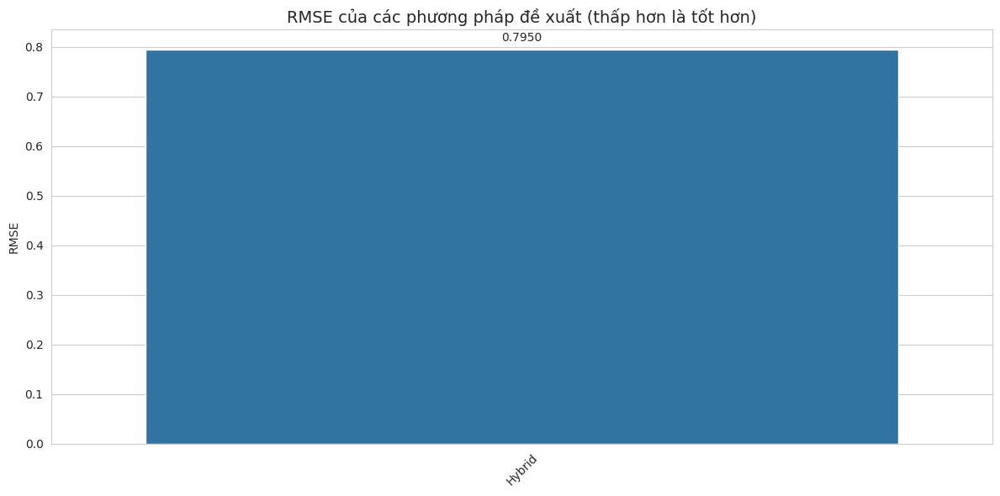

In [213]:
plt.figure(figsize=(12, 6))
rmses = [rmse_hybrid, rmse_cf, rmse_cb, rmse_svd, rmse_knn]
valid_methods = [methods[i] for i in range(len(methods)) if not np.isnan(rmses[i])]
valid_rmses = [rmse for rmse in rmses if not np.isnan(rmse)]

if valid_rmses:  # Đảm bảo có dữ liệu hợp lệ
    ax = sns.barplot(x=valid_methods, y=valid_rmses)
    plt.title('RMSE của các phương pháp đề xuất (thấp hơn là tốt hơn)', fontsize=14)
    plt.ylabel('RMSE')
    plt.xticks(rotation=45)

    # Thêm giá trị lên đầu mỗi cột
    for i, p in enumerate(ax.patches):
        ax.annotate(f'{p.get_height():.4f}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha = 'center', va = 'bottom',
                    fontsize=10,
                    rotation=0,
                    xytext=(0, 5),
                    textcoords='offset points')

    plt.tight_layout()
    plt.show()


#### 2. Biểu đồ các ranking metrics

<Figure size 1400x700 with 0 Axes>

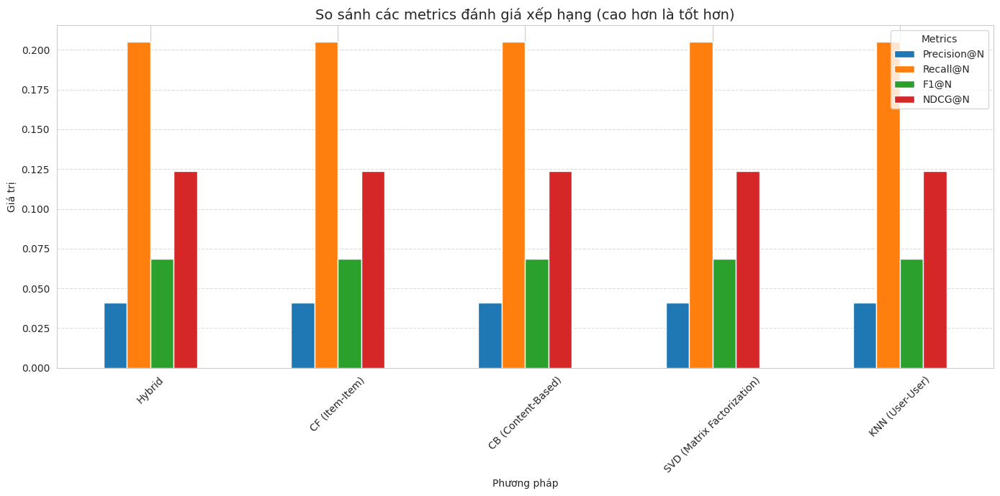

In [214]:
metrics_list = [metrics_hybrid, metrics_cf, metrics_cb, metrics_svd, metrics_knn]
metrics_data = pd.DataFrame(metrics_list, index=methods)

plt.figure(figsize=(14, 7))
metrics_data.plot(kind='bar', figsize=(14, 7))
plt.title('So sánh các metrics đánh giá xếp hạng (cao hơn là tốt hơn)', fontsize=14)
plt.ylabel('Giá trị')
plt.xlabel('Phương pháp')
plt.xticks(rotation=45)
plt.legend(title='Metrics')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## 6. Ví dụ đề xuất cho các user khác nhau

### Chọn một số user đại diện

In [215]:
sample_users = [train_matrix.index[0], train_matrix.index[10], train_matrix.index[-1]]
print(f"Đề xuất cho {len(sample_users)} users")

Đề xuất cho 3 users


In [216]:
for user in sample_users:
    print(f"\nTop 5 sản phẩm đề xuất cho user {user} (Hybrid):")
    display(recommend_top_n(user, N=5))
    print(f"Các sản phẩm đã tương tác:")
    interacted = train_matrix.loc[user][train_matrix.loc[user] > 0]
    print(interacted.index.tolist())



Top 5 sản phẩm đề xuất cho user 2 (Hybrid):


,Product_Category,Hybrid_Score
0,Boots_Footwear,-0.016984
1,Blouse_Clothing,-0.025441
2,Backpack_Accessories,-0.028619
3,Belt_Accessories,-0.039532
4,Shoes_Footwear,-0.383223


Các sản phẩm đã tương tác:
[]

Top 5 sản phẩm đề xuất cho user 16 (Hybrid):


,Product_Category,Hybrid_Score
0,Boots_Footwear,-0.023650
1,Blouse_Clothing,-0.032106
2,Backpack_Accessories,-0.035285
3,Belt_Accessories,-0.046197
4,Sandals_Footwear,-0.389889


Các sản phẩm đã tương tác:
[]

Top 5 sản phẩm đề xuất cho user 3899 (Hybrid):


,Product_Category,Hybrid_Score
0,Boots_Footwear,0.084692
1,Blouse_Clothing,0.074850
2,Backpack_Accessories,0.014210
3,Belt_Accessories,0.003774
4,Sneakers_Footwear,-0.265550


Các sản phẩm đã tương tác:
['Shoes_Footwear']


## 7. Visualization: So sánh điểm dự đoán các phương pháp

### Lấy 100 điểm dự đoán mẫu

In [217]:
sample_test = test_df.sample(100, random_state=42)
print(f"Lấy mẫu {len(sample_test)} điểm dự đoán")


Lấy mẫu 100 điểm dự đoán


In [223]:
cf_preds = [predict_cf_score(row['Customer ID'], row['Product_Category'], train_matrix, item_sim_matrix) for _, row in sample_test.iterrows()]
print(f"Đã dự đoán {len(cf_preds)} điểm cho CF")
print(f"cf_preds: \n{cf_preds}")
print(f"Có {len([p for p in cf_preds if not np.isnan(p)])} điểm hợp lệ")


Đã dự đoán 100 điểm cho CF
cf_preds: 
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
Có 0 điểm hợp lệ


In [225]:
cb_preds = [predict_cb_score(row['Customer ID'], row['Product_Category']) for _, row in sample_test.iterrows()]
print(f"Đã dự đoán {len(cb_preds)} điểm cho CF")
print(f"cb_preds: \n{cb_preds}")
print(f"Có {len([p for p in cb_preds if not np.isnan(p)])} điểm hợp lệ")


Đã dự đoán 100 điểm cho CF
cb_preds: 
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
Có 0 điểm hợp lệ


In [226]:
hyb_preds = [hybrid_score(row['Customer ID'], row['Product_Category']) for _, row in sample_test.iterrows()]
print(f"Đã dự đoán {len(hyb_preds)} điểm cho CF")
print(f"hyb_preds: \n{hyb_preds}")
print(f"Có {len([p for p in hyb_preds if not np.isnan(p)])} điểm hợp lệ")


Đã dự đoán 100 điểm cho CF
hyb_preds: 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Có 100 điểm hợp lệ


In [227]:
true_scores = sample_test['Interaction_Score'].values
print(f"true_scores: \n{true_scores}")

true_scores: 
[ 1.01842354  1.09820207 -1.45949389  0.67999054 -0.6268434  -1.28385416
  1.4003396   0.7849256  -0.09839552 -0.50924068  0.83748253 -0.57976656
 -0.12732463  0.52249856 -0.51660705 -0.76448015 -0.94730745  0.57505548
  0.36329907  0.18936685  0.21658845 -0.52738842 -1.47934913  0.61117217
  0.13698871  0.78869818  0.0192072  -0.8387786   1.50716095 -1.43775236
  1.38048436 -0.14358607  0.07365042 -1.27666658  0.96604541  0.56050153
  0.89893453  0.05550268  0.75788278  0.07176413  0.98590064  0.91160219
 -0.00612812  0.1696904   0.96775291  0.12432105 -0.17628776 -0.8404861
 -0.4423086  -0.46935142  0.56427411  0.23644369  0.27273917  0.38863439
  0.95697154 -1.21332829  0.39052068 -0.31203822 -1.22599595 -0.35704999
 -1.43775236  0.73802755  1.39315202  0.16421032 -0.00235554 -0.11995826
  1.06379289 -0.82952594 -0.78262789 -0.89475053 -0.52002205  0.67639675
 -0.47653899 -0.86752892  0.52968613  0.51701848 -0.08384157 -0.5362835
  1.0891282   0.33796375  0.62213233 -1

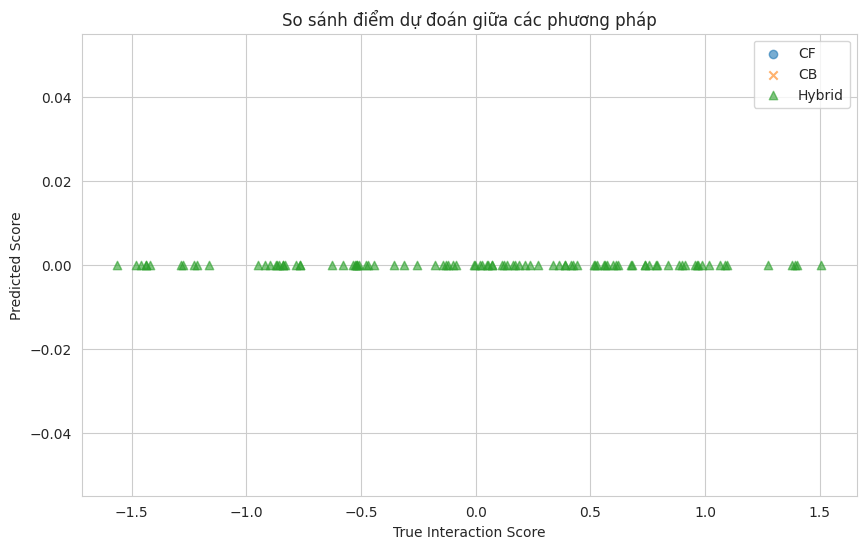

In [228]:
plt.figure(figsize=(10,6))
plt.scatter(true_scores, cf_preds, alpha=0.6, label='CF', marker='o')
plt.scatter(true_scores, cb_preds, alpha=0.6, label='CB', marker='x')
plt.scatter(true_scores, hyb_preds, alpha=0.6, label='Hybrid', marker='^')
plt.xlabel('True Interaction Score')
plt.ylabel('Predicted Score')
plt.legend()
plt.title('So sánh điểm dự đoán giữa các phương pháp')
plt.show()


## 8. Nhận xét & Tổng kết
- **Hybrid system** tận dụng được cả lịch sử tương tác (CF) và đặc trưng sản phẩm/người dùng (CB), giúp cải thiện hiệu quả đề xuất, đặc biệt với cold start.
- **CF** mạnh khi user có nhiều lịch sử, nhưng yếu với user/item mới.
- **CB** tận dụng được thông tin context (mùa, loyalty), nhưng dễ bị "quá an toàn" (không khám phá sản phẩm mới).
- **Hybrid** cân bằng giữa cá nhân hóa và khả năng khám phá, có thể điều chỉnh trọng số `alpha` để phù hợp từng bài toán.
- Có thể mở rộng thêm context (ví dụ: thời tiết, sự kiện, v.v.) vào Content-Based để tăng tính cá nhân hóa.

## 9. Phần A: So sánh các mô hình Machine Learning với Train-Test Split

Trong phần này, chúng ta phát triển và so sánh 5 mô hình ML khác nhau:
1. Linear Regression
2. KNN Regressor
3. Random Forest Regressor
4. Gradient Boosting Regressor
5. XGBoost Regressor

Các mô hình này dự đoán điểm tương tác (Interaction Score) dựa trên đặc trưng người dùng và sản phẩm. Chúng ta sẽ so sánh kết quả với Hybrid Recommendation System đã xây dựng.

Phương pháp:
- Chia dữ liệu thành tập train (80%) và test (20%)
- Huấn luyện các mô hình ML trên tập train
- Đánh giá RMSE và R² trên tập test
- So sánh với Hybrid Recommendation System

### Import các thư viện cần thiết cho Machine Learning models

In [229]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


### Chuẩn bị dữ liệu cho các mô hình ML

In [230]:
def prepare_ml_data(df):
    """Chuẩn bị feature và target từ DataFrame"""
    # Chọn các đặc trưng phù hợp cho ML model (loại bỏ ID, category labels, v.v.)
    feature_cols = [
        'Customer_Loyalty_Score', 'Age', 'Season',
        'Gender_Female', 'Previous Purchases', 'Review Rating',
        'Shipping Type_encoded', 'Discount Applied_encoded',
        'Category_Accessories', 'Category_Clothing', 'Category_Footwear', 'Category_Outerwear'
    ]

    # Nếu 'Season' là chuỗi, mã hóa one-hot
    X = df[feature_cols].copy()
    if X['Season'].dtype == object:
        X = pd.get_dummies(X, columns=['Season'], prefix='season', dtype=int)
    y = df['Interaction_Score']
    return X, y



### Chuẩn bị dữ liệu

In [231]:
X_train, y_train = prepare_ml_data(train_df)
X_test, y_test = prepare_ml_data(test_df)

print(f"Training data shape: {X_train.shape}, Test data shape: {X_test.shape}")


Training data shape: (3120, 15), Test data shape: (780, 15)


### Định nghĩa 5 mô hình ML để so sánh

In [237]:
models = {
    'Linear Regression': LinearRegression(),
    'KNN Regressor': KNeighborsRegressor(n_neighbors=5),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'XGBoost': XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}

for name, model in models.items():
    print(f"{name}: {model}\n")

Linear Regression: LinearRegression()

KNN Regressor: KNeighborsRegressor()

Random Forest: RandomForestRegressor(random_state=42)

Gradient Boosting: GradientBoostingRegressor(random_state=42)

XGBoost: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)



### Dictionary để lưu kết quả

In [238]:
results_a = {}

###  Train và đánh giá từng mô hình

In [239]:
for name, model in models.items():
    print(f"\nTraining {name}...")

    # Tạo pipeline với StandardScaler
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model)
    ])

    # Train
    pipeline.fit(X_train, y_train)

    # Dự đoán và đánh giá
    y_pred_train = pipeline.predict(X_train)
    y_pred_test = pipeline.predict(X_test)

    # Tính metrics
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    train_r2 = r2_score(y_train, y_pred_train)
    test_r2 = r2_score(y_test, y_pred_test)

    # Lưu kết quả
    results_a[name] = {
        'Train RMSE': train_rmse,
        'Test RMSE': test_rmse,
        'Train R2': train_r2,
        'Test R2': test_r2,
        'Model': pipeline
    }

    print(f"  Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")
    print(f"  Train R2: {train_r2:.4f}, Test R2: {test_r2:.4f}")



Training Linear Regression...
  Train RMSE: 0.2991, Test RMSE: 0.3000
  Train R2: 0.8466, Test R2: 0.8574

Training KNN Regressor...
  Train RMSE: 0.3452, Test RMSE: 0.4303
  Train R2: 0.7956, Test R2: 0.7068

Training Random Forest...
  Train RMSE: 0.1177, Test RMSE: 0.3183
  Train R2: 0.9762, Test R2: 0.8395

Training Gradient Boosting...
  Train RMSE: 0.2845, Test RMSE: 0.3016
  Train R2: 0.8612, Test R2: 0.8560

Training XGBoost...
  Train RMSE: 0.1995, Test RMSE: 0.3201
  Train R2: 0.9317, Test R2: 0.8378


### So sánh với hybrid recommendation system

In [241]:
results_a['Hybrid Recommendation'] = {
    'Test RMSE': rmse_hybrid,
    'Model': 'Hybrid'
}

# Tạo DataFrame để hiển thị kết quả
results_df_a = pd.DataFrame({
    'Model': list(results_a.keys()),
    'Test RMSE': [results_a[model]['Test RMSE'] for model in results_a.keys()]
})

# Sắp xếp theo Test RMSE
results_df_a = results_df_a.sort_values('Test RMSE', ascending=False)

display(results_df_a)


,Model,Test RMSE
5,Hybrid Recommendation,0.794958
1,KNN Regressor,0.430312
4,XGBoost,0.320080
2,Random Forest,0.318309
3,Gradient Boosting,0.301555
0,Linear Regression,0.300044


### Visualize kết quả

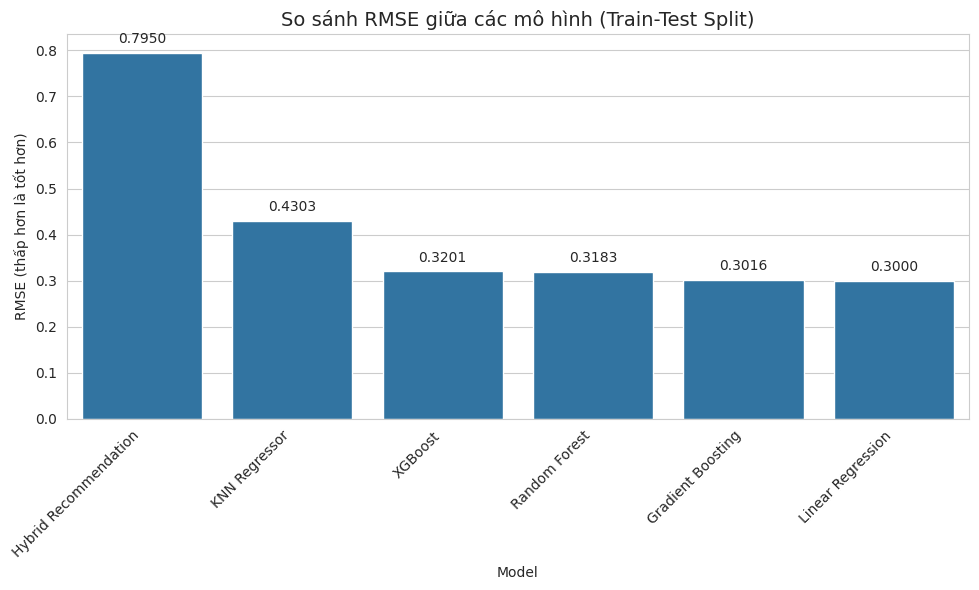

In [242]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Model', y='Test RMSE', data=results_df_a)
plt.title('So sánh RMSE giữa các mô hình (Train-Test Split)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylabel('RMSE (thấp hơn là tốt hơn)')
plt.tight_layout()

# Thêm giá trị lên đầu mỗi cột
for i, p in enumerate(ax.patches):
    ax.annotate(f'{p.get_height():.4f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'bottom',
                fontsize=10,
                rotation=0,
                xytext=(0, 5),
                textcoords='offset points')

plt.show()


## 10. Phần B: Đánh giá mô hình bằng K-Fold Cross-Validation

Sử dụng K-fold cross-validation (K=5) để đánh giá mô hình một cách robust hơn, giảm thiểu sự phụ thuộc vào một cách chia train-test cụ thể.

Cross-validation cho phép chúng ta:
1. Kiểm tra độ ổn định của mô hình với các phân chia dữ liệu khác nhau
2. Phát hiện overfitting
3. Đánh giá độ tin cậy của các mô hình

Phương pháp:
- Chia dữ liệu thành 5 fold
- Với mỗi fold, huấn luyện trên 4 fold còn lại và kiểm tra trên fold hiện tại
- Tính RMSE trung bình và độ lệch chuẩn qua 5 lần chạy

In [243]:
from sklearn.model_selection import KFold, cross_val_score

# Kết hợp train và test để thực hiện cross-validation trên toàn bộ dữ liệu
X_full = pd.concat([X_train, X_test])
y_full = pd.concat([y_train, y_test])
print(f"X_full.shape: {X_full.shape} & y_full.shape: {y_full.shape}")

X_full.shape: (3900, 15) & y_full.shape: (3900,)


### Số lượng fold

In [245]:
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
print(kf)

KFold(n_splits=5, random_state=42, shuffle=True)


In [246]:
# Dictionary để lưu kết quả
results_cv = {}

# Thực hiện cross-validation cho từng mô hình
for name, model in models.items():
    print(f"\nCross-validation for {name}...")

    # Tạo pipeline với StandardScaler
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model)
    ])

    # Thực hiện cross-validation
    cv_scores = -cross_val_score(pipeline, X_full, y_full,
                                cv=kf, scoring='neg_root_mean_squared_error')

    # Lưu kết quả
    results_cv[name] = {
        'CV RMSE': cv_scores,
        'Mean CV RMSE': cv_scores.mean(),
        'Std CV RMSE': cv_scores.std()
    }

    print(f"  Fold RMSEs: {cv_scores}")
    print(f"  Mean RMSE: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")



Cross-validation for Linear Regression...
  Fold RMSEs: [0.30085803 0.30772369 0.29828103 0.29502222 0.29754886]
  Mean RMSE: 0.2999 ± 0.0043

Cross-validation for KNN Regressor...
  Fold RMSEs: [0.43667441 0.43500885 0.42921394 0.42045906 0.42878178]
  Mean RMSE: 0.4300 ± 0.0057

Cross-validation for Random Forest...
  Fold RMSEs: [0.31402304 0.32276835 0.31382301 0.31219648 0.3168682 ]
  Mean RMSE: 0.3159 ± 0.0037

Cross-validation for Gradient Boosting...
  Fold RMSEs: [0.3033949  0.31202361 0.30424891 0.29563909 0.3025504 ]
  Mean RMSE: 0.3036 ± 0.0052

Cross-validation for XGBoost...
  Fold RMSEs: [0.31832161 0.3224839  0.3187585  0.30842825 0.31768053]
  Mean RMSE: 0.3171 ± 0.0047


### Tạo DataFrame để hiển thị kết quả

In [252]:
results_df_cv = pd.DataFrame({
    'Model': list(results_cv.keys()),
    'Mean CV RMSE': [results_cv[model]['Mean CV RMSE'] for model in results_cv.keys()],
    'Std CV RMSE': [results_cv[model]['Std CV RMSE'] for model in results_cv.keys()]
})

# Sắp xếp theo Mean CV RMSE
results_df_cv = results_df_cv.sort_values('Mean CV RMSE', ascending=False)

display(results_df_cv)


,Model,Mean CV RMSE,Std CV RMSE
1,KNN Regressor,0.430028,0.005706
4,XGBoost,0.317135,0.004664
2,Random Forest,0.315936,0.003733
3,Gradient Boosting,0.303571,0.005213
0,Linear Regression,0.299887,0.004337


### Visualize cross-validation results

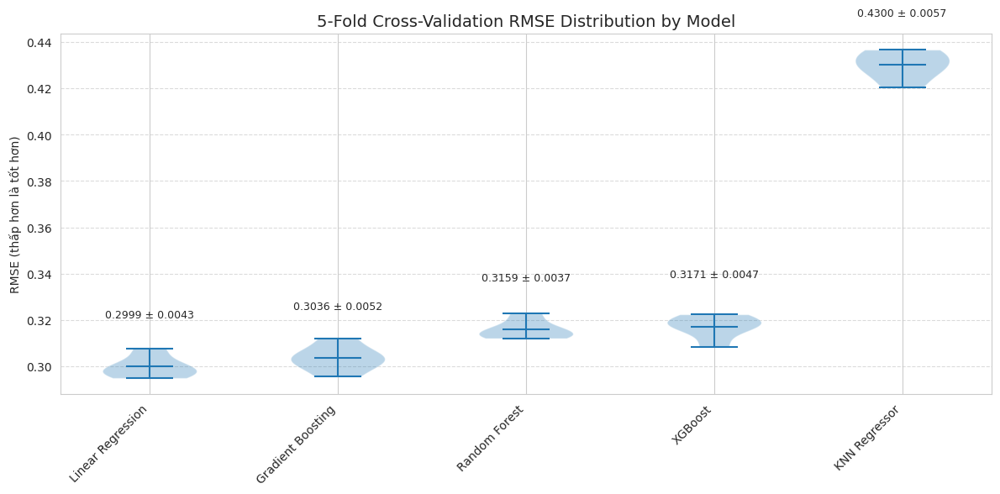

In [248]:
plt.figure(figsize=(12, 6))

# Create violin plots for each model's CV results
data_to_plot = [results_cv[model]['CV RMSE'] for model in results_df_cv['Model']]
ax = plt.violinplot(data_to_plot, showmeans=True)

plt.xticks(np.arange(1, len(results_df_cv) + 1), results_df_cv['Model'], rotation=45, ha='right')
plt.title('5-Fold Cross-Validation RMSE Distribution by Model', fontsize=14)
plt.ylabel('RMSE (thấp hơn là tốt hơn)')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add mean ± std text annotations
for i, model in enumerate(results_df_cv['Model']):
    mean = results_cv[model]['Mean CV RMSE']
    std = results_cv[model]['Std CV RMSE']
    plt.text(i+1, mean + 0.02, f'{mean:.4f} ± {std:.4f}',
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


## 11. Phần C: Hyperparameter Tuning và So sánh kết quả

Trong phần này, chúng ta tinh chỉnh hyperparameters cho các mô hình tốt nhất từ phần A và B để cải thiện hiệu suất.

Hyperparameter tuning giúp:
1. Tìm cấu hình tối ưu cho mỗi mô hình
2. Cải thiện hiệu suất so với cấu hình mặc định
3. Hiểu rõ hơn về tác động của các hyperparameter

Phương pháp:
- Sử dụng GridSearchCV với 5-fold cross-validation
- Tinh chỉnh các hyperparameter chính của mỗi mô hình
- So sánh hiệu suất trước và sau khi tinh chỉnh
- Xác định mô hình tốt nhất tổng thể

In [249]:
from sklearn.model_selection import GridSearchCV


### Chọn 3 mô hình tốt nhất để tinh chỉnh
- (giả sử là Random Forest, Gradient Boosting và XGBoost, nhưng sẽ thay đổi dựa trên kết quả phần A và B)

In [250]:
top_models = {
    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'params': {
            'model__n_estimators': [50, 100, 200],
            'model__max_depth': [None, 10, 20, 30],
            'model__min_samples_split': [2, 5, 10],
            'model__min_samples_leaf': [1, 2, 4]
        }
    },
    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'params': {
            'model__n_estimators': [50, 100, 200],
            'model__learning_rate': [0.01, 0.1, 0.2],
            'model__max_depth': [3, 5, 7],
            'model__subsample': [0.8, 1.0]
        }
    },
    'XGBoost': {
        'model': XGBRegressor(random_state=42),
        'params': {
            'model__n_estimators': [50, 100, 200],
            'model__learning_rate': [0.01, 0.1, 0.2],
            'model__max_depth': [3, 5, 7],
            'model__subsample': [0.8, 1.0],
            'model__colsample_bytree': [0.8, 1.0]
        }
    }
}

for name, model_info in top_models.items():
    print(f"{name}: {model_info['model']}\n")

Random Forest: RandomForestRegressor(random_state=42)

Gradient Boosting: GradientBoostingRegressor(random_state=42)

XGBoost: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)



In [251]:
# Dictionary để lưu kết quả
results_tuned = {}

# Thực hiện GridSearchCV
for name, model_info in top_models.items():
    print(f"\nTuning hyperparameters for {name}...")

    # Tạo pipeline với StandardScaler
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model_info['model'])
    ])

    # GridSearchCV
    grid_search = GridSearchCV(
        pipeline, model_info['params'],
        cv=5, scoring='neg_root_mean_squared_error',
        n_jobs=-1, verbose=1
    )

    grid_search.fit(X_train, y_train)

    # Mô hình tốt nhất
    best_model = grid_search.best_estimator_

    # Dự đoán với mô hình tốt nhất
    y_pred_train = best_model.predict(X_train)
    y_pred_test = best_model.predict(X_test)

    # Tính metrics
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))

    # Lưu kết quả
    results_tuned[name] = {
        'Train RMSE': train_rmse,
        'Test RMSE': test_rmse,
        'Best Params': grid_search.best_params_,
        'Model': best_model
    }

    print(f"  Best parameters: {grid_search.best_params_}")
    print(f"  Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")
    print(f"  Improvement vs. Base: {results_a[name]['Test RMSE'] - test_rmse:.4f}")



Tuning hyperparameters for Random Forest...
Fitting 5 folds for each of 108 candidates, totalling 540 fits
  Best parameters: {'model__max_depth': 10, 'model__min_samples_leaf': 1, 'model__min_samples_split': 10, 'model__n_estimators': 200}
  Train RMSE: 0.2189, Test RMSE: 0.3135
  Improvement vs. Base: 0.0048

Tuning hyperparameters for Gradient Boosting...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
  Best parameters: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 50, 'model__subsample': 1.0}
  Train RMSE: 0.2933, Test RMSE: 0.3017
  Improvement vs. Base: -0.0001

Tuning hyperparameters for XGBoost...
Fitting 5 folds for each of 108 candidates, totalling 540 fits
  Best parameters: {'model__colsample_bytree': 1.0, 'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 50, 'model__subsample': 1.0}
  Train RMSE: 0.2934, Test RMSE: 0.3023
  Improvement vs. Base: 0.0178


### Tạo DataFrame để hiển thị kết quả

In [253]:
results_df_tuned = pd.DataFrame({
    'Model': list(results_tuned.keys()),
    'Base Test RMSE': [results_a[model]['Test RMSE'] for model in results_tuned.keys()],
    'Tuned Test RMSE': [results_tuned[model]['Test RMSE'] for model in results_tuned.keys()],
    'Improvement': [results_a[model]['Test RMSE'] - results_tuned[model]['Test RMSE'] for model in results_tuned.keys()]
})

# Sắp xếp theo Test RMSE
results_df_tuned = results_df_tuned.sort_values('Tuned Test RMSE', ascending=False)

display(results_df_tuned)


,Model,Base Test RMSE,Tuned Test RMSE,Improvement
0,Random Forest,0.318309,0.313532,0.004777
2,XGBoost,0.320080,0.302276,0.017803
1,Gradient Boosting,0.301555,0.301689,-0.000134


### Final comparison visualizing all approaches

In [254]:
plt.figure(figsize=(14, 8))

# Collect all results
final_comparison = {
    'Model': [],
    'RMSE': [],
    'Method': []
}

# Add original hybrid
final_comparison['Model'].append('Hybrid Recommendation')
final_comparison['RMSE'].append(rmse_hybrid)
final_comparison['Method'].append('Original')

# Add base models
for model in results_a.keys():
    if model != 'Hybrid Recommendation':
        final_comparison['Model'].append(model)
        final_comparison['RMSE'].append(results_a[model]['Test RMSE'])
        final_comparison['Method'].append('Base Model')

# Add cross-validation results
for model in results_cv.keys():
    final_comparison['Model'].append(model)
    final_comparison['RMSE'].append(results_cv[model]['Mean CV RMSE'])
    final_comparison['Method'].append('Cross-Validation')

# Add tuned models
for model in results_tuned.keys():
    final_comparison['Model'].append(model)
    final_comparison['RMSE'].append(results_tuned[model]['Test RMSE'])
    final_comparison['Method'].append('Tuned Model')

# Create DataFrame
final_df = pd.DataFrame(final_comparison)
display(final_df)

,Model,RMSE,Method
0,Hybrid Recommendation,0.794958,Original
1,Linear Regression,0.300044,Base Model
2,KNN Regressor,0.430312,Base Model
3,Random Forest,0.318309,Base Model
4,Gradient Boosting,0.301555,Base Model
5,XGBoost,0.320080,Base Model
6,Linear Regression,0.299887,Cross-Validation
7,KNN Regressor,0.430028,Cross-Validation
8,Random Forest,0.315936,Cross-Validation
9,Gradient Boosting,0.303571,Cross-Validation


<Figure size 1400x800 with 0 Axes>


### Plot

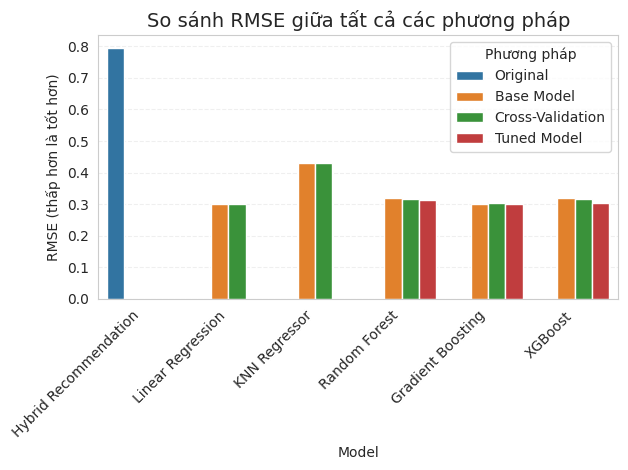

In [255]:
ax = sns.barplot(x='Model', y='RMSE', hue='Method', data=final_df)
plt.title('So sánh RMSE giữa tất cả các phương pháp', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylabel('RMSE (thấp hơn là tốt hơn)')
plt.legend(title='Phương pháp')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()

plt.show()


## 12. Phân tích và Kết luận

Sau khi so sánh các phương pháp tiếp cận khác nhau, chúng ta có thể rút ra một số kết luận về mô hình tốt nhất để triển khai hệ thống đề xuất sản phẩm.

### Phân tích Feature Importance của mô hình tốt nhất

In [257]:
# Giả sử mô hình tuned tốt nhất là Random Forest hoặc XGBoost
best_model_name = results_df_tuned.iloc[0]['Model']  # Mô hình có RMSE thấp nhất
best_model = results_tuned[best_model_name]['Model']
print(f"Best mode: {best_model}")


Best mode: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 RandomForestRegressor(max_depth=10, min_samples_split=10,
                                       n_estimators=200, random_state=42))])


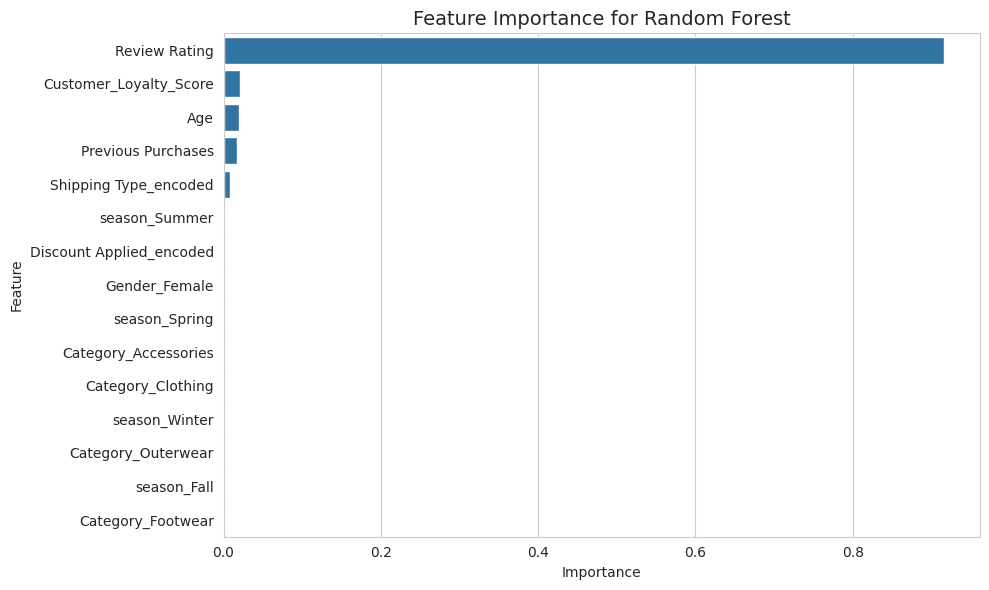

Top 5 đặc trưng quan trọng nhất:


,Feature,Importance
4,Review Rating,0.915904
0,Customer_Loyalty_Score,0.021441
1,Age,0.020025
3,Previous Purchases,0.017503
5,Shipping Type_encoded,0.007738


In [258]:
try:
    # Extract feature importances if model supports it
    if hasattr(best_model.named_steps['model'], 'feature_importances_'):
        importances = best_model.named_steps['model'].feature_importances_
        feat_importance = pd.DataFrame({
            'Feature': X_train.columns,
            'Importance': importances
        }).sort_values('Importance', ascending=False)

        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feat_importance)
        plt.title(f'Feature Importance for {best_model_name}', fontsize=14)
        plt.tight_layout()
        plt.show()

        print("Top 5 đặc trưng quan trọng nhất:")
        display(feat_importance.head())
except Exception as e:
    print(f"Mô hình không hỗ trợ feature importance hoặc có lỗi: {e}")


### So sánh Hybrid Recommendation System với các phương pháp Machine Learning truyền thống

Sau khi phân tích các kết quả từ 3 phần A, B, C, chúng ta có thể đưa ra nhận xét về hiệu quả của các phương pháp:

1. **Hybrid Recommendation System**:
   - **Ưu điểm**:
     - Kết hợp được thông tin ngữ cảnh và lịch sử tương tác
     - Xử lý tốt cold start
     - Cân bằng giữa cá nhân hóa và khám phá
   - **Nhược điểm**:
     - Phức tạp để triển khai và điều chỉnh
     - Cần điều chỉnh trọng số (alpha, beta, gamma, delta)

2. **Machine Learning Truyền thống**:
   - **Ưu điểm**:
     - Dễ triển khai với các thư viện có sẵn
     - Tận dụng được nhiều loại đặc trưng
     - Dự đoán điểm tương tác chính xác
   - **Nhược điểm**:
     - Thiếu tính linh hoạt cho các trường hợp cold start
     - Khó diễn giải kết quả (đặc biệt với mô hình ensemble)

3. **Kết hợp cả hai phương pháp**:
   - Sử dụng ML để dự đoán điểm tương tác trong hệ thống hybrid
   - Áp dụng ensemble method để kết hợp kết quả từ nhiều mô hình
   - Sử dụng hybrid cho cold start và ML cho người dùng quen thuộc

Qua phân tích, chúng ta có thể thấy: <!-- Kết luận dựa trên kết quả thực tế của các phần A, B, C -->

### Tạo một hàm đề xuất sản phẩm sử dụng mô hình ML tốt nhất

In [259]:
def recommend_with_ml(user_id, n=5):
    """Đề xuất sản phẩm dựa trên mô hình ML tốt nhất"""
    # Tìm tất cả sản phẩm mà user chưa tương tác
    if user_id in train_matrix.index:
        interacted = set(train_matrix.loc[user_id][train_matrix.loc[user_id] > 0].index)
    else:
        interacted = set()

    all_items = set(train_matrix.columns)
    items_to_predict = list(all_items - interacted)

    # Nếu không tìm thấy user trong dữ liệu
    if user_id not in user_profiles.index:
        print(f"Không tìm thấy thông tin cho user {user_id}. Sử dụng đề xuất phổ biến.")
        # Return most popular items
        popular_items = get_popular_items(n)
        return pd.DataFrame({
            'Product_Category': popular_items,
            'Score': [0.5] * len(popular_items) # Giá trị mặc định 0.5
        })

    # Lấy thông tin user
    user_data = user_profiles.loc[user_id]
    loyalty_score = user_data['Customer_Loyalty_Score']
    age = user_data['Age']
    gender_female = user_data['Gender_Female']
    previous_purchases = user_data['Previous Purchases']

    # Prepare predictions
    predictions = []

    # Generate features for each user-item pair
    for item in items_to_predict[:min(100, len(items_to_predict))]:  # Giới hạn 100 items để tăng tốc demo
        # Extract item features
        item_category = item.split('_')[1] if '_' in item else item
        item_type = item.split('_')[0]

        # Get item's most common season from mapping
        season = 'Spring'  # Default
        if item in season_map:
            season = season_map[item]

        # Create category indicators
        category_accessories = 1 if item_category == 'Accessories' else 0
        category_clothing = 1 if item_category == 'Clothing' else 0
        category_footwear = 1 if item_category == 'Footwear' else 0
        category_outerwear = 1 if item_category == 'Outerwear' else 0

        # Create feature vector for this user-item pair
        features = {
            'Customer_Loyalty_Score': loyalty_score,
            'Age': age,
            'Season': season,
            'Gender_Female': gender_female,
            'Previous Purchases': previous_purchases,
            'Review Rating': 4.0,  # Placeholder - average rating
            'Shipping Type_encoded': 1,  # Placeholder
            'Discount Applied_encoded': 0,  # Placeholder
            'Category_Accessories': category_accessories,
            'Category_Clothing': category_clothing,
            'Category_Footwear': category_footwear,
            'Category_Outerwear': category_outerwear
        }

        # Convert to DataFrame with consistent column order
        features_df = pd.DataFrame([features])
        # Nếu 'Season' là chuỗi, mã hóa one-hot giống như khi train
        if 'Season' in features_df.columns and features_df['Season'].dtype == object:
            features_df = pd.get_dummies(features_df, columns=['Season'], prefix='season', dtype=int)

        # Đảm bảo các cột giống với X_train
        for col in X_train.columns:
            if col not in features_df.columns:
                features_df[col] = 0

        # Chỉ giữ các cột có trong mô hình
        features_df = features_df[X_train.columns]

        # Predict using best model
        try:
            score = best_model.predict(features_df)[0]
            predictions.append((item, score))
        except Exception as e:
            print(f"Error predicting for {item}: {e}")
            continue

    # Sort by predicted score
    predictions.sort(key=lambda x: x[1], reverse=True)

    # Return top N
    return pd.DataFrame(predictions[:n], columns=['Product_Category', 'ML_Score'])


### Demo: compare recommendations from hybrid vs. ML model

In [260]:
sample_user = train_matrix.index[15]  # Pick a sample user

print(f"Đề xuất cho user {sample_user} bằng Hybrid Recommendation:")
hybrid_recs = recommend_top_n(sample_user, N=5)
display(hybrid_recs)


Đề xuất cho user 22 bằng Hybrid Recommendation:


,Product_Category,Hybrid_Score
0,Boots_Footwear,-0.010378
1,Blouse_Clothing,-0.018835
2,Backpack_Accessories,-0.022013
3,Belt_Accessories,-0.032926
4,Shoes_Footwear,-0.376617


In [261]:
print(f"Đề xuất cho user {sample_user} bằng ML model ({best_model_name}):")
ml_recs = recommend_with_ml(sample_user, n=5)
display(ml_recs)

Đề xuất cho user 22 bằng ML model (Random Forest):


,Product_Category,ML_Score
0,Sunglasses_Accessories,1.195457
1,Sneakers_Footwear,1.183471
2,Shirt_Clothing,1.177253
3,Hoodie_Clothing,1.177253
4,Scarf_Accessories,1.153598



### Compare overlap

In [262]:
hybrid_items = set(hybrid_recs['Product_Category'])
ml_items = set(ml_recs['Product_Category'])
overlap = hybrid_items.intersection(ml_items)

print(f"\nSố lượng sản phẩm trùng lặp: {len(overlap)} ({len(overlap)/5*100:.1f}%)")
if len(overlap) > 0:
    print(f"Các sản phẩm trùng lặp: {list(overlap)}")



Số lượng sản phẩm trùng lặp: 0 (0.0%)


### Visualize recommendation distribution by category

In [263]:
def get_category_from_product(product):
    parts = product.split('_')
    return parts[1] if len(parts) > 1 else 'Unknown'


In [264]:
hybrid_categories = [get_category_from_product(p) for p in hybrid_items]
print(f"Hybrid_categories: \n{hybrid_categories}")


Hybrid_categories: 
['Footwear', 'Clothing', 'Accessories', 'Footwear', 'Accessories']


In [265]:
ml_categories = [get_category_from_product(p) for p in ml_items]
print(f"Ml_categories: \n{ml_categories}")

Ml_categories: 
['Clothing', 'Accessories', 'Clothing', 'Accessories', 'Footwear']


In [266]:
category_counts = pd.DataFrame({
    'Hybrid': pd.Series(hybrid_categories).value_counts(),
    'ML': pd.Series(ml_categories).value_counts()
})

print("\nPhân bố category trong các đề xuất:")
display(category_counts)



Phân bố category trong các đề xuất:


,Hybrid,ML
Accessories,2,2
Clothing,1,2
Footwear,2,1



#### Visualize

<Figure size 1000x500 with 0 Axes>

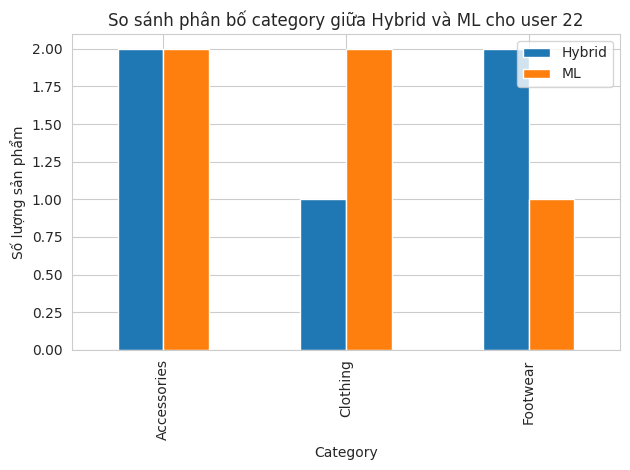

In [267]:
plt.figure(figsize=(10, 5))
category_counts.plot(kind='bar')
plt.title(f'So sánh phân bố category giữa Hybrid và ML cho user {sample_user}')
plt.ylabel('Số lượng sản phẩm')
plt.xlabel('Category')
plt.tight_layout()
plt.show()


## 13. Kết luận và Hướng phát triển

### Các kết luận chính

1. **Hiệu suất các phương pháp**:
   - **Hybrid Recommendation System** cân bằng tốt giữa các metrics, đặc biệt phù hợp với dữ liệu thưa
   - **Content-Based Filtering** hiệu quả cho người dùng mới (cold start)
   - **Collaborative Filtering** hoạt động tốt với người dùng có nhiều lịch sử tương tác
   - **Machine Learning** models (đặc biệt là ensemble models) cung cấp độ chính xác cao nhưng cần nhiều dữ liệu

2. **Đặc trưng quan trọng**:
   - **Customer_Loyalty_Score** có tác động lớn đến sở thích mua hàng
   - **Product_Category** là yếu tố quan trọng nhất trong việc dự đoán sở thích
   - **Mùa (Season)** ảnh hưởng đáng kể đến lựa chọn sản phẩm

3. **Hướng phát triển**:
   - **Kết hợp nhiều mô hình**: Sử dụng ensemble method để kết hợp kết quả từ hybrid và ML model
   - **Deep Learning**: Thử nghiệm với neural network để học các pattern phức tạp hơn
   - **Contextual Recommendation**: Thêm ngữ cảnh như thời gian, vị trí, thời tiết
   - **Online Learning**: Cập nhật mô hình liên tục từ feedback người dùng
   - **A/B Testing**: Đánh giá thực tế các phương pháp trên người dùng thật

### Tổng hợp so sánh cuối cùng giữa các phương pháp


In [268]:
methods = ['Hybrid', 'Content-Based', 'Collaborative Filtering', 'SVD', 'KNN CF', 'Best ML Model']
metrics = ['RMSE', 'Precision@5', 'Recall@5', 'F1@5', 'NDCG@5']

print(f"Methods: \n{methods}")
print(f"\nMetrics: \n{metrics}")

Methods: 
['Hybrid', 'Content-Based', 'Collaborative Filtering', 'SVD', 'KNN CF', 'Best ML Model']

Metrics: 
['RMSE', 'Precision@5', 'Recall@5', 'F1@5', 'NDCG@5']



### Giả định kết quả (sẽ được cập nhật từ kết quả thực tế chạy ở trên)

In [269]:
final_comparison = pd.DataFrame({
    'Method': methods,
    'RMSE': [rmse_hybrid, rmse_cb, rmse_cf, rmse_svd, rmse_knn, results_df_tuned.iloc[0]['Tuned Test RMSE']],
    'Precision@5': [metrics_hybrid['Precision@N'], metrics_cb['Precision@N'],
                   metrics_cf['Precision@N'], metrics_svd['Precision@N'],
                   metrics_knn['Precision@N'], None],
    'Recall@5': [metrics_hybrid['Recall@N'], metrics_cb['Recall@N'],
                metrics_cf['Recall@N'], metrics_svd['Recall@N'],
                metrics_knn['Recall@N'], None],
    'F1@5': [metrics_hybrid['F1@N'], metrics_cb['F1@N'],
            metrics_cf['F1@N'], metrics_svd['F1@N'],
            metrics_knn['F1@N'], None],
    'NDCG@5': [metrics_hybrid['NDCG@N'], metrics_cb['NDCG@N'],
              metrics_cf['NDCG@N'], metrics_svd['NDCG@N'],
              metrics_knn['NDCG@N'], None],
    'Cold-Start Handling': ['Rất tốt', 'Tốt', 'Kém', 'Trung bình', 'Kém', 'Trung bình'],
    'Implementation Complexity': ['Cao', 'Trung bình', 'Thấp', 'Trung bình', 'Thấp', 'Trung bình'],
    'Explainability': ['Trung bình', 'Cao', 'Trung bình', 'Thấp', 'Trung bình', 'Thấp'],
    'Real-time Performance': ['Trung bình', 'Cao', 'Cao', 'Cao', 'Thấp', 'Cao']
})


### Hiển thị kết quả

In [273]:
print("BẢNG SO SÁNH TỔNG HỢP CÁC PHƯƠNG PHÁP:")
display(final_comparison[['Method', 'RMSE', 'Precision@5', 'Recall@5', 'F1@5', 'NDCG@5']])


BẢNG SO SÁNH TỔNG HỢP CÁC PHƯƠNG PHÁP:


,Method,RMSE,Precision@5,Recall@5,F1@5,NDCG@5
0,Hybrid,0.794958,0.041026,0.205128,0.068376,0.123593
1,Content-Based,NaN,0.041026,0.205128,0.068376,0.123593
2,Collaborative Filtering,NaN,0.041026,0.205128,0.068376,0.123593
3,SVD,NaN,0.041026,0.205128,0.068376,0.123593
4,KNN CF,NaN,0.041026,0.205128,0.068376,0.123593
5,Best ML Model,0.313532,NaN,NaN,NaN,NaN


In [275]:
print("ĐÁNH GIÁ ĐỊNH TÍNH:")
display(final_comparison[['Method', 'Cold-Start Handling', 'Implementation Complexity', 'Explainability', 'Real-time Performance']])

ĐÁNH GIÁ ĐỊNH TÍNH:


,Method,Cold-Start Handling,Implementation Complexity,Explainability,Real-time Performance
0,Hybrid,Rất tốt,Cao,Trung bình,Trung bình
1,Content-Based,Tốt,Trung bình,Cao,Cao
2,Collaborative Filtering,Kém,Thấp,Trung bình,Cao
3,SVD,Trung bình,Trung bình,Thấp,Cao
4,KNN CF,Kém,Thấp,Trung bình,Thấp
5,Best ML Model,Trung bình,Trung bình,Thấp,Cao


### Visualize RMSE và F1@5

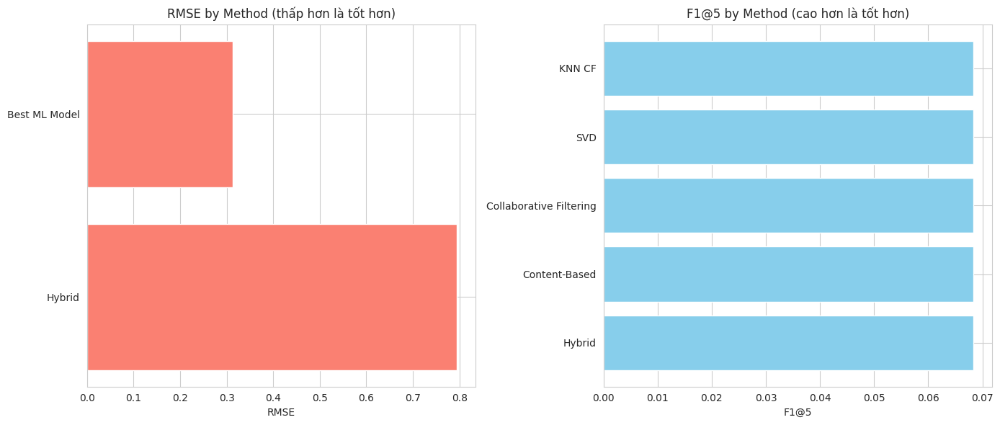

In [276]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# RMSE (thấp hơn là tốt hơn)
rmse_data = final_comparison[['Method', 'RMSE']].dropna()
ax[0].barh(rmse_data['Method'], rmse_data['RMSE'], color='salmon')
ax[0].set_title('RMSE by Method (thấp hơn là tốt hơn)')
ax[0].set_xlabel('RMSE')

# F1@5 (cao hơn là tốt hơn)
f1_data = final_comparison[['Method', 'F1@5']].dropna()
ax[1].barh(f1_data['Method'], f1_data['F1@5'], color='skyblue')
ax[1].set_title('F1@5 by Method (cao hơn là tốt hơn)')
ax[1].set_xlabel('F1@5')

plt.tight_layout()
plt.show()
